# SNF Network-based credit risk models in P2P lending markets
Goal: See whether the predictive accuracy of the ML or DL models improve when we include the centrality parameters. So its about checking the AUC values on models trained with and without the centrality measures.

jupyter notebook --NotebookApp.iopub_data_rate_limit=1.0e10

# Libraries

## install missing packages

In [1]:
def install_missing_packages(package_names):
    """
    Install Missing Packages

    This function checks if a list of packages is already installed and installs any missing packages using pip.

    Parameters:
    - package_names (list): A list of package names to be installed.

    Returns:
    - None

    Note: This function requires the `subprocess` and `importlib` modules to be imported.

    Example Usage:
    install_missing_packages(['h2o', 'numpy', 'pandas'])
    """
    import importlib
    import subprocess


    for package_name in package_names:
        try:
            importlib.import_module(package_name)
            print(f"{package_name} package is already installed")
        except ImportError:
            print(f"{package_name} package not found, installing with pip...")
            subprocess.call(['pip', 'install', package_name])


In [2]:
# TODO YOU NEED TO HAVE R installed
package_list = ['h2o', 'rpy2', 'reportlab', 'fpdf', 'tabulate']
install_missing_packages(package_list)

h2o package is already installed
rpy2 package is already installed
reportlab package not found, installing with pip...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 11.4 MB/s eta 0:00:00
fpdf package not found, installing with pip...
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for fpdf: filename=fpdf-1.7.2-py2.py3-none-any.whl size=40705 sha256=90de8170926ae027a3488e91c5d9f894df8a1ab777728f360ddb837027ac3f2d
  Stored in directory: /Users/bal8/Library/Caches/pip/wheels/44/35/8b/86ce00cec7e4d13c5f189680ae0fa82f919bedc066c2cddae9
Successfully built fpdf
tabulate package is already installed


## general libraries

In [4]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import webbrowser
import pandas as pd
import importlib
import subprocess
import plotly.graph_objects as go
import plotly.io as pio
from plotly.subplots import make_subplots
from sklearn.metrics import (accuracy_score, classification_report, confusion_matrix, roc_curve, auc,
                             precision_recall_curve, average_precision_score)
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import importlib
import subprocess

import os
import hashlib

import json

from typing import List
from lime.lime_tabular import LimeTabularExplainer


In [5]:
import itertools
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.lines import Line2D
from matplotlib.patches import Patch

from tabulate import tabulate

## h2o models

In [6]:
"""
H2O Models

This module provides a set of utility functions for working with H2O models. H2O is an open-source machine learning platform that provides a distributed environment for building and deploying machine learning models.

Functions:
- load_model(model_path): Load an H2O model from the specified path and return the model object.
- save_model(model, model_path): Save the given H2O model to the specified path.
- predict(model, data): Generate predictions using the specified H2O model on the given data.
- evaluate(model, data): Evaluate the performance of the specified H2O model on the given data and return relevant metrics.
- get_model_details(model): Get detailed information about the specified H2O model, including its parameters and performance statistics.
- get_feature_importance(model): Get the feature importance scores for the specified H2O model, indicating the importance of each feature in the model's predictions.

Note: These functions require the H2O Python library to be installed and imported.

For more information on H2O, visit the official documentation at https://docs.h2o.ai/.
"""

import h2o
from h2o.estimators import H2ORandomForestEstimator
from h2o.estimators import H2OGeneralizedLinearEstimator
from h2o.estimators import H2OGeneralizedLinearEstimator, H2ORandomForestEstimator, H2ODeepLearningEstimator
from h2o.grid.grid_search import H2OGridSearch
import h2o.estimators.glm
from h2o.estimators.xgboost import H2OXGBoostEstimator
from h2o.estimators.gbm import H2OGradientBoostingEstimator

In [5]:
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas

ModuleNotFoundError: No module named 'reportlab'

## DeLong

In [7]:
"""
DeLong Test

This module implements the DeLong test, a statistical test used to compare the performance of two predictive models by comparing the areas under their receiver operating characteristic (ROC) curves. The DeLong test is commonly used in medical research and other fields to assess the statistical significance of differences in model performance.

Functions:
- delong_test(y_true, y_pred_model1, y_pred_model2): Perform the DeLong test to compare the predictive performance of two models.
    - y_true: The true labels or outcomes.
    - y_pred_model1: The predicted probabilities or scores from model 1.
    - y_pred_model2: The predicted probabilities or scores from model 2.
    Returns the p-value indicating the significance of the difference in performance between the two models.

Note: This implementation assumes that the models' predictions are provided as probabilities or scores rather than discrete class labels. It also assumes that the models' predictions are for a binary classification task.

For more information on the DeLong test, refer to the original paper by DeLong et al. (1988) titled "Comparing the Areas Under Two or More Correlated Receiver Operating Characteristic Curves: A Nonparametric Approach" or other relevant literature.
"""

import rpy2.robjects as robjects
from rpy2.robjects.packages import importr
# import R's "pROC" package
pROC = importr('pROC')

# Functions1: Data processing

## Read and write data

In [7]:
def read_df_from_disk(directory, filename, parameters):
    """
    Given a directory name, a file name, and a list of parameters,
    reads the data from the file with the specified name and returns it as a Pandas DataFrame.

    Args:
        directory (str): The name of the directory to read the file from.
        filename (str): The name of the file to read.
        parameters (list): A list of parameters that were included in the filename.

    Returns:
        pandas.DataFrame: The data from the file as a Pandas DataFrame.

    Example:
        >>> directory = 'data'
        >>> filename = 'param1_param2_example.csv'
        >>> parameters = ['param1', 'param2']
        >>> df = read_df_from_disk(directory, filename, parameters)
    """
    # navigate up one level from cwd
    parent_dir = os.path.dirname(os.getcwd())
    
    # navigate into directory
    dir_path = os.path.join(parent_dir, directory)
    
    # merge directory path with file name
    file_path = os.path.join(dir_path, parameters + "_" + filename)
    
    # read dataframe from file
    dataframe = pd.read_csv(file_path)
    
    return dataframe


In [8]:
def read_list_from_disk(directory, filename, parameters):
    """
    Given a directory name, a file name, and a list of parameters,
    reads the data from the file with the specified name and returns it as a list.

    Args:
        directory (str): The name of the directory to read the file from.
        filename (str): The name of the file to read.
        parameters (list): A list of parameters that were included in the filename.

    Returns:
        list: The data from the file as a list.

    Example:
        >>> directory = 'data'
        >>> filename = 'param1_param2_example.txt'
        >>> parameters = ['param1', 'param2']
        >>> lst = read_list_from_disk(directory, filename, parameters)
    """
    # Navigate up one level from cwd
    parent_dir = os.path.dirname(os.getcwd())

    # Navigate into directory
    dir_path = os.path.join(parent_dir, directory)

    # Merge directory path with file name, including parameters in the file name
    file_path = os.path.join(dir_path, "_".join(parameters) + "_" + filename)

    # Read list from file
    with open(file_path, 'r') as f:
        lst = [line.strip() for line in f]
    
    return lst


In [9]:
def calculate_hash(string):
    """Calculate SHA-256 hash of a given string"""
    hash_object = hashlib.sha256(string.encode())
    hex_dig = hash_object.hexdigest()
    return hex_dig
hash_result = calculate_hash("hello world")
print(hash_result)
# Output:  b94d27b9934d3e08a52e52d7da7dabfac484efe37a5380ee9088f7ace2efcde9


b94d27b9934d3e08a52e52d7da7dabfac484efe37a5380ee9088f7ace2efcde9


In [10]:
# function to search for models specific files
import os

def search_file_in_directory(directory, filename):
    """
    Search for a specific file in a directory.
    
    Parameters:
    directory (str): The directory to search in.
    filename (str): The name of the file to search for.

    Returns:
    bool: Whether the file was found.
    """
    with os.scandir(directory) as entries:
        for entry in entries:
            if entry.name == filename:
                print(f'File found: {entry.name}')
                return True
    print(f'File not found: {filename}')
    return False


## H20 
related functions

In [11]:
def pandas_to_h2o(data):
    # Convert Pandas DataFrame to H2OFrame
    h2o_df = h2o.H2OFrame(data)
    return h2o_df

def h2o_to_pandas(h2o_df):
    # Convert H2OFrame to Pandas DataFrame
    pandas_df = h2o_df.as_data_frame()

    return pandas_df

In [12]:
def convert_binary_to_categorical(data, binary_columns):
    """
    Convert binary columns in a DataFrame to categorical data type.

    :param data: A pandas DataFrame containing the data.
    :param binary_columns: A list of column names that are binary.
    :return: A new pandas DataFrame with binary columns converted to categorical data type.
    """
    data_categorical = data.copy()

    for column in binary_columns:
        data_categorical[column] = data_categorical[column].astype('category')

    return data_categorical

In [13]:
def convert_to_h2o_frame(pandas_data,binary_columns):
    """
    Convert a pandas DataFrame or Series to an H2O Frame, preserving categorical columns.

    :param pandas_data: pandas DataFrame or Series to be converted
    :return: Converted H2O Frame
    """

    # Convert pandas Series to DataFrame
    if isinstance(pandas_data, pd.Series):
        pandas_data = pandas_data.to_frame()

    # Convert pandas DataFrame to H2O Frame
    h2o_frame = h2o.H2OFrame(pandas_data)

    # Set factor levels for categorical columns in the H2O Frame
    for column in h2o_frame.columns:
        if column in binary_columns:
            h2o_frame[column] = h2o_frame[column].asfactor()

    return h2o_frame

In [14]:
def exclude_columns(data: pd.DataFrame, exclude_list: list) -> pd.DataFrame:
    """
    Exclude specified columns from a Pandas DataFrame.

    Parameters:
    data (pandas.DataFrame): The input Pandas DataFrame.
    exclude_list (list): The list of column names to exclude.

    Returns:
    pandas.DataFrame: A new DataFrame with the specified columns removed.

    """
    new_data = data.drop(exclude_list, axis=1)

    return new_data

In [15]:
def load_h2o_model_from_disk(directory, filename):
    """
    Given a directory name and a file name, loads an H2O model from disk.

    Args:
        directory (str): The name of the directory where the model is saved.
        filename (str): The name of the file where the model is saved.

    Returns:
        H2OEstimator: The loaded H2O estimator object or None if the model file does not exist.

    Example:
        >>> directory = 'models'
        >>> filename = 'rf_model'
        >>> loaded_model = load_h2o_model_from_disk(directory, filename)
        >>> predictions = loaded_model.predict(data) if loaded_model else None
    """
    # Navigate up one level from cwd
    parent_dir = os.path.dirname(os.getcwd())

    # Navigate into directory
    dir_path = os.path.join(parent_dir, directory)

    # Merge directory path with file name
    file_path = os.path.join(dir_path, filename)
    
    file_path = os.path.join(file_path, filename)
    
    print("Loading model from path:", file_path)
    
    # Check if model file exists
    if not os.path.isfile(file_path):
        print(f"No model file found at {file_path}")
        return None

    # Load model from file
    loaded_model = h2o.load_model(file_path)
    
    return loaded_model

## Model performance analysis
This part of functions is not used in the follwing code. I am just not sure whether we need then in the future.

In [16]:
def binary_classification_metrics(y_true, y_pred):
    """
    Calculate and print binary classification metrics: accuracy, confusion matrix, and classification report.
    
    :param y_true: A pandas DataFrame or Series containing the true target values.
    :param y_pred: A pandas DataFrame or Series containing the predicted target values.
    :return: A dictionary containing the calculated classification metrics.
    """
    # Calculate classification metrics
    metrics = {}
    metrics['accuracy'] = accuracy_score(y_true, y_pred)
    metrics['confusion_matrix'] = confusion_matrix(y_true, y_pred)
    metrics['classification_report'] = classification_report(y_true, y_pred)
    
    # Print the classification metrics
    print('Accuracy:', metrics['accuracy'])
    print('Confusion Matrix:\n', metrics['confusion_matrix'])
    print('Classification Report:\n', metrics['classification_report'])

    return metrics

def evaluate_predictions(y_true,
                         y_pred,
                         positive_class=1,
                         roc_file='roc_plot.html',
                         pr_file='pr_plot.html'):
    """
    Evaluate classification metrics, plot ROC curve and Precision-Recall curve using Plotly, and save plots as HTML files.

    :param y_true: A pandas DataFrame or Series containing the true target values.
    :param y_pred: A pandas DataFrame or Series containing the predicted target values.
    :param positive_class: The label of the positive class (default: 1).
    :param roc_file: The name of the HTML file to save the ROC curve plot (default: 'roc_plot.html').
    :param pr_file: The name of the HTML file to save the Precision-Recall curve plot (default: 'pr_plot.html').
    :return: A dictionary containing various classification metrics.
    """
    # Calculate ROC curve and AUC
    fpr, tpr, _ = roc_curve(y_true, y_pred, pos_label=positive_class)
    metrics['auc'] = auc(fpr, tpr)

    # Calculate Precision-Recall curve and average precision
    precision, recall, _ = precision_recall_curve(y_true,
                                                  y_pred,
                                                  pos_label=positive_class)
    metrics['average_precision'] = average_precision_score(y_true, y_pred)

    # Create ROC curve plot
    fig_roc = make_subplots(rows=1, cols=1, subplot_titles=('ROC Curve', ))
    fig_roc.add_trace(go.Scatter(x=fpr,
                                 y=tpr,
                                 mode='lines',
                                 name='ROC Curve',
                                 line=dict(color='blue')),
                      row=1,
                      col=1)
    fig_roc.add_trace(go.Scatter(x=[0, 1],
                                 y=[0, 1],
                                 mode='lines',
                                 name='Random',
                                 line=dict(color='black', dash='dash')),
                      row=1,
                      col=1)
    fig_roc.update_layout(title=f'ROC Curve (AUC = {metrics["auc"]:.4f})',
                          xaxis_title='False Positive Rate',
                          yaxis_title='True Positive Rate',
                          showlegend=True,
                          legend=dict(orientation='h',
                                      yanchor='bottom',
                                      xanchor='right',
                                      y=1.02,
                                      x=1))

    # Save the ROC curve plot as an HTML file
    pio.write_html(fig_roc, file=roc_file)

    # Create Precision-Recall curve plot
    fig_pr = make_subplots(rows=1,
                           cols=1,
                           subplot_titles=('Precision-Recall Curve', ))
    fig_pr.add_trace(go.Scatter(x=recall,
                                y=precision,
                                mode='lines',
                                name='Precision-Recall Curve',
                                line=dict(color='blue')),
                     row=1,
                     col=1)
    fig_pr.update_layout(
        title=
        f'Precision-Recall Curve (Avg. Precision = {metrics["average_precision"]:.4f})',
        xaxis_title='Recall',
        yaxis_title='Precision',
        showlegend=True,
        legend=dict(orientation='h',
                    yanchor='bottom',
                    xanchor='right',
                    y=1.02,
                    x=1))

    # Save the Precision-Recall curve plot as an HTML file
    pio.write_html(fig_pr, file=pr_file)

    # Print classification metrics nicely

    print(f'AUC: {metrics["auc"]:.4f}')
    print(f'Average Precision: {metrics["average_precision"]:.4f}')

    # Open the HTML files in the default web browser
    webbrowser.open(roc_file)
    webbrowser.open(pr_file)

    return metrics

In [17]:
def get_model_by_hash(model_directory, hash_string):
    """
    Returns an H2O model located in a specified directory, identified by a hash string.

    Args:
        model_directory (str): The directory where the models are located.
        hash_string (str): The hash string of the model to be loaded.

    Returns:
        h2o.model: The model that matches the hash string if found.

    Example:
        >>> model = get_model_by_hash('/path/to/models', 'abc123')
    """
    # Load the model from disk using the hash_string as the filename
    model = load_h2o_model_from_disk(model_directory, hash_string)

    if model is None:
        # Raise an error if no matching model is found
        raise FileNotFoundError(f"No model found with hash string {hash_string}.")
    
    return model

In [97]:
def create_explainer(X_train: pd.DataFrame, y_train: np.ndarray, discretize_continuous: bool = False) -> LimeTabularExplainer:
    """
    This function creates a LIME Tabular explainer for a given training dataset.

    Parameters:
    ----------
    X_train : pd.DataFrame
        The training data used to fit the model.

    y_train : np.ndarray
        The target variable for the training data.

    discretize_continuous : bool, default=True
        Whether to discretize the continuous features to produce histograms.

    Returns:
    -------
    LimeTabularExplainer
        The LIME explainer object for the given training data.

    Example:
    --------
    ```python
    import pandas as pd
    import numpy as np
    from sklearn.datasets import load_iris

    # Load the iris dataset
    iris = load_iris()
    X_train = pd.DataFrame(iris.data, columns=iris.feature_names)
    y_train = iris.target

    # Create the LIME explainer
    explainer = create_explainer(X_train, y_train)
    ```
    """
    return LimeTabularExplainer(X_train.values,
                                feature_names=X_train.columns,
                                class_names=np.unique(y_train),
                                discretize_continuous=discretize_continuous)

In [19]:
def predict_proba_h2o(model, data):
    """
    This function returns predicted probabilities of an H2O model for given data.

    Parameters:
    ----------
    model: H2OModel
        The H2O model which is used to make predictions.

    data: pd.DataFrame
        The data on which the predictions are made.

    Returns:
    -------
    np.ndarray
        The predicted probabilities for each class.

    Example:
    --------
    >>> import h2o
    >>> from h2o.estimators.gbm import H2OGradientBoostingEstimator
    >>> h2o.init()

    >>> # Create a sample binary classification dataset
    >>> df = h2o.H2OFrame({'x': [1, 2, 3, 4, 5], 'y': [0, 1, 0, 1, 0]})
    >>> model = H2OGradientBoostingEstimator(ntrees=1, max_depth=1)
    >>> model.train(x=['x'], y='y', training_frame=df)

    >>> # Convert the H2OFrame to a pandas DataFrame
    >>> df_pd = df.as_data_frame()

    >>> # Use the function to get predicted probabilities
    >>> proba = predict_proba_h2o(model, df_pd)
    >>> print(proba)
    """
    predictions = model.predict(h2o.H2OFrame(data)).as_data_frame()
    # Here we assume your binary target variable has been coded as 0/1 and that 'p1' is the
    # predicted probability of class 1
    return predictions[['p0', 'p1']].values

# Parameters1

## Parameters for data pre-process

In [20]:
## data parameters

data_directory = "data" # where the data is stored
preprocessed_filename = "preprocessed" # filename we give for storing the preprocessed data, just before training

In [21]:
preprocessed_filename = "preprocessed_shuffled" #goes to the shffuled data set

In [22]:
directory = 'data'
file_name = 'Bondora_sample(24000)_with_centrality.csv'
parameter_string = "pandas_washes"

# Auto ML

## Init the H2O package:

In [23]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321..... not found.
Attempting to start a local H2O server...
  Java Version: java version "17.0.7" 2023-04-18 LTS; Java(TM) SE Runtime Environment (build 17.0.7+8-LTS-224); Java HotSpot(TM) 64-Bit Server VM (build 17.0.7+8-LTS-224, mixed mode, sharing)
  Starting server from /opt/anaconda3/lib/python3.9/site-packages/h2o/backend/bin/h2o.jar
  Ice root: /var/folders/3q/g52_1wls189gg2_cpvs9n9840000gq/T/tmpfvxo4q2d
  JVM stdout: /var/folders/3q/g52_1wls189gg2_cpvs9n9840000gq/T/tmpfvxo4q2d/h2o_bal8_started_from_python.out
  JVM stderr: /var/folders/3q/g52_1wls189gg2_cpvs9n9840000gq/T/tmpfvxo4q2d/h2o_bal8_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,02 secs
H2O_cluster_timezone:,Europe/Zurich
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.40.0.4
H2O_cluster_version_age:,1 month and 29 days
H2O_cluster_name:,H2O_from_python_bal8_gkptma
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,8 Gb
H2O_cluster_total_cores:,10
H2O_cluster_allowed_cores:,10
H2O_cluster_status:,"locked, healthy"


# Read back data and convert to H20
Read back the dataset (after cleaning) and convert to H2O df

## Read back data

In [24]:
preprocessed_filename

'preprocessed_shuffled'

In [25]:
data_categorical = read_df_from_disk(directory = data_directory,
                                     filename = preprocessed_filename, 
                                     parameters = parameter_string)
binary_columns = read_list_from_disk(directory = data_directory,
                                     filename = preprocessed_filename, 
                                     parameters = "binary columns")
target_column = "default"
feature_columns = [col for col in data_categorical.columns if col != target_column]
#print(binary_columns)
#print(len(binary_columns))

In [23]:
print(data_categorical.head())
print(type(data_categorical))

   default  new       Age  Gender  Interest  MonthlyPayment  DebtToIncome  \
0        0    1  0.634615       0  0.392055        0.699456      0.834713   
1        0    1  0.192308       0  0.291110        0.693792      0.000000   
2        0    0  0.423077       0  0.197004        0.587526      0.625892   
3        0    0  0.134615       0  0.521980        0.418453      0.108193   
4        0    1  0.615385       0  0.363400        0.631606      0.000000   

   NoOfPreviousLoansBeforeLoan  AmountOfPreviousLoansBeforeLoan      time  \
0                     0.000000                         0.000000  0.280459   
1                     0.000000                         0.000000  0.855214   
2                     0.153846                         0.163233  0.370908   
3                     0.076923                         0.014718  0.224772   
4                     0.000000                         0.000000  0.740803   

   ...  katz  authority           hub  pagerank_shuffled  \
0  ...   0.0  

## Train test split

In [74]:
X = data_categorical.drop(target_column, axis=1)
y = data_categorical[target_column]
X_train, X_test, y_train, y_test = train_test_split(X,
                                                    y,
                                                    test_size=0.4,
                                                    random_state=42)
X_test, X_val, y_test, y_val = train_test_split(X_test,
                                                y_test,
                                                test_size=0.5,
                                                random_state=42)

In [75]:
X_train.copy().iloc[:,-20:]

,no.previous.repay.00,no.previous.repay.01,previous.repay.l,A,B,C,pagerank,betweenness,closeness,eigenvector,katz,authority,hub,pagerank_shuffled,betweenness_shuffled,closeness_shuffled,eigenvector_shuffled,katz_shuffled,authority_shuffled,hub_shuffled
8063,1,0,0.00000,0,0,1,0.000000,0.0,0.032052,NaN,0.000000,0.000000e+00,1.450147e-94,0.000000,0.0,0.008108,NaN,0.091974,1.666210e-105,0.000000e+00
4812,1,0,0.00000,1,0,0,0.000000,0.0,0.027383,NaN,0.000000,0.000000e+00,6.836651e-95,0.000000,0.0,NaN,NaN,0.169754,1.192670e-75,0.000000e+00
2126,1,0,0.00000,0,0,1,0.000000,0.0,0.001437,NaN,0.000000,0.000000e+00,1.523836e-52,0.000000,0.0,0.021393,NaN,0.000000,3.188065e-78,2.661635e-103
20503,1,0,0.00000,1,0,0,0.205827,0.0,NaN,NaN,0.076921,7.045160e-87,0.000000e+00,0.000000,0.0,0.009232,NaN,0.000000,0.000000e+00,1.153347e-90
15863,1,0,0.00000,0,1,0,0.000000,0.0,0.014420,NaN,0.000000,0.000000e+00,2.493049e-61,0.024651,0.0,0.054155,NaN,0.025464,3.890599e-76,0.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21575,1,0,0.00000,0,0,1,0.317804,0.0,NaN,NaN,0.106411,5.334708e-83,0.000000e+00,0.000000,0.0,0.051151,NaN,0.000000,6.890837e-69,2.005971e-71
5390,0,0,0.75122,0,0,0,0.000000,0.0,0.035732,NaN,0.000000,0.000000e+00,2.126107e-87,0.000000,0.0,0.051712,NaN,0.021054,0.000000e+00,1.419386e-18
860,1,0,0.00000,0,0,1,0.000000,0.0,0.036884,NaN,0.000000,0.000000e+00,1.096428e-58,0.030968,0.0,0.067977,NaN,0.043807,0.000000e+00,6.983675e-23
15795,1,0,0.00000,0,0,1,0.069807,0.0,NaN,NaN,0.095726,6.009113e-56,0.000000e+00,0.000000,0.0,0.005839,NaN,0.036081,2.736786e-76,1.689689e-54


## Convert to H20
also some simple tests

In [76]:
X_train = convert_to_h2o_frame(X_train, binary_columns)
X_test = convert_to_h2o_frame(X_test, binary_columns)
X_val = convert_to_h2o_frame(X_val, binary_columns)

y_train = convert_to_h2o_frame(y_train, 'default')
y_test = convert_to_h2o_frame(y_test, 'default')
y_val = convert_to_h2o_frame(y_val, 'default')

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [77]:
print(type(X_train))
print(type(X_test))
print(type(X_val))
print(type(y_train))
print(type(y_test))
print(type(y_val))

<class 'h2o.frame.H2OFrame'>
<class 'h2o.frame.H2OFrame'>
<class 'h2o.frame.H2OFrame'>
<class 'h2o.frame.H2OFrame'>
<class 'h2o.frame.H2OFrame'>
<class 'h2o.frame.H2OFrame'>


In [30]:
is_categorical = X_test.isfactor()
for column, is_cat in zip(X_test.columns, is_categorical):
    print(f"Column {column} is {'categorical' if is_cat else 'not categorical'}")

Column new is categorical
Column Age is not categorical
Column Gender is categorical
Column Interest is not categorical
Column MonthlyPayment is not categorical
Column DebtToIncome is not categorical
Column NoOfPreviousLoansBeforeLoan is not categorical
Column AmountOfPreviousLoansBeforeLoan is not categorical
Column time is not categorical
Column Hour.0 is categorical
Column Hour.1 is categorical
Column Hour.2 is categorical
Column Hour.3 is categorical
Column Hour.4 is categorical
Column Hour.5 is categorical
Column Hour.6 is categorical
Column Hour.7 is categorical
Column Hour.8 is categorical
Column Hour.9 is categorical
Column Hour.10 is categorical
Column Hour.11 is categorical
Column Hour.12 is categorical
Column Hour.13 is categorical
Column Hour.14 is categorical
Column Hour.15 is categorical
Column Hour.16 is categorical
Column Hour.17 is categorical
Column Hour.18 is categorical
Column Hour.19 is categorical
Column Hour.20 is categorical
Column Hour.21 is categorical
Column 

# Function2: Load models and compare

In [48]:
import rpy2.robjects as robjects
from rpy2.robjects.packages import importr

# Import R's "pROC" package
pROC = importr('pROC')


def delong_test(model1, model2, X_test, y_test):
    """
    Performs the DeLong test to compare the performance of two models.

    Parameters:
    model1: First h2o model for comparison.
    model2: Second h2o model for comparison.
    X_test: h2o DataFrame of features used for testing.
    y_test: h2o DataFrame of target variable used for testing.

    Returns:
    None. Prints the results of the DeLong test.

    Example:
    delong_test(model_with6, model_without6, X_test, y_test)
    """

    # Generate predictions
    pred1 = model1.predict(X_test.cbind(y_test)).as_data_frame()
    pred2 = model2.predict(X_test.cbind(y_test)).as_data_frame()

    # Get predicted probabilities and true labels
    y_scores1 = pred1['p1'].values
    y_scores2 = pred2['p1'].values
    y_true = y_test.as_data_frame().values.flatten()

    # Create R objects
    r_y_scores1 = robjects.FloatVector(y_scores1)
    r_y_scores2 = robjects.FloatVector(y_scores2)
    r_y_true = robjects.IntVector(y_true)

    # Compute ROC curves
    roc1 = pROC.roc(r_y_true, r_y_scores1)
    roc2 = pROC.roc(r_y_true, r_y_scores2)

    # Perform DeLong test
    roc_test = pROC.roc_test(roc1, roc2, method="delong")

    # Print result
    print(roc_test)

    # Extract hypothesis and p-value
    hypothesis = roc_test.rx2('alternative')[0]
    p_value = roc_test.rx2('p.value')[0]

    return hypothesis, p_value


# Example usage:
# delong_test(model_with6, model_without6, X_test, y_test)

OSError: cannot load library '/Library/Frameworks/R.framework/Resources/lib/libR.dylib': dlopen(/Library/Frameworks/R.framework/Resources/lib/libR.dylib, 0x0002): tried: '/Library/Frameworks/R.framework/Resources/lib/libR.dylib' (mach-o file, but is an incompatible architecture (have 'arm64', need 'x86_64')), '/System/Volumes/Preboot/Cryptexes/OS/Library/Frameworks/R.framework/Resources/lib/libR.dylib' (no such file), '/Library/Frameworks/R.framework/Resources/lib/libR.dylib' (mach-o file, but is an incompatible architecture (have 'arm64', need 'x86_64')), '/Library/Frameworks/R.framework/Versions/4.3-arm64/Resources/lib/libR.dylib' (mach-o file, but is an incompatible architecture (have 'arm64', need 'x86_64')), '/System/Volumes/Preboot/Cryptexes/OS/Library/Frameworks/R.framework/Versions/4.3-arm64/Resources/lib/libR.dylib' (no such file), '/Library/Frameworks/R.framework/Versions/4.3-arm64/Resources/lib/libR.dylib' (mach-o file, but is an incompatible architecture (have 'arm64', need 'x86_64'))

In [32]:
def load_one_model(model_directory, model_name, hyper_param, exclude_list):
    """
    Load a trained H2O model from disk.
    
    Parameters:
    model_directory (str): The directory where the model is stored.
    model_name (str): The name of the model.
    hyper_param (dict): The hyperparameters used to train the model.
    exclude_list (list): A list of features that were excluded during model training.

    Returns:
    model: The loaded H2O model.
    """
    data_set_parameters = str(
        exclude_list) + data_directory + preprocessed_filename + file_name
    model_parameters = data_set_parameters + model_name + str(hyper_param)
    model_parameters_hash = calculate_hash(model_parameters)

    model = load_h2o_model_from_disk(directory=model_directory,
                                     filename=model_parameters_hash)
    
    #print(model)
    return model

In [33]:
def load_a_group_of_model(exclude_LIST, model_directory, model_name,
                          hyper_param):
    """
    This function loads a group of H2O models from a specified directory.

    Parameters:
    exclude_LIST: A list of lists where each sublist contains the features to be excluded during the model load.
    model_directory: A string representing the directory where the H2O model files are saved.
    model_name: A string representing the base name of the model files.
    hyper_param: A dictionary containing the hyperparameters used for the model.

    Returns:
    h2o_models: A list of H2O model objects that have been loaded.
    """
    h2o_models = []

    for exclude_list in exclude_LIST:
        # For each list of features to be excluded, load the corresponding model and append it to the list.
        # The function load_one_model() is assumed to take the directory, model name, hyperparameters, and exclude list as arguments,
        # and returns a loaded H2O model.
        h2o_models.append(
            load_one_model(model_directory, model_name, hyper_param,
                           exclude_list))

    # Return the list of loaded models.
    return h2o_models

In [34]:
from h2o import H2OFrame

def model_compare_within_group(model_group, X_test, y_test, paired=True):
    """
    This function evaluates a group of models on a given test set, and returns several evaluation metrics for each model.
    If the 'paired' parameter is set to True, the function will also perform a DeLong test to compare the performance of each pair of models.

    Parameters:
    model_group: A list of trained H2O models to be evaluated.
    X_test: An H2OFrame representing the predictor variables in the test set.
    y_test: An H2OFrame representing the response variable in the test set.
    paired: A Boolean indicating whether to perform a DeLong test comparing the performance of each pair of models.

    Returns:
    confusion_matrices: A list of confusion matrices, one for each model.
    roc_curves: A list of ROC curves, one for each model.
    auc_s: A list of AUC scores, one for each model.
    delong_results: A list of tuples, each containing the null hypothesis and p-value from a DeLong test comparing a pair of models.
    """
    confusion_matrices = []
    roc_curves = []
    auc_s = []
    delong_results = []

    # Loop over models and compute metrics
    for model in model_group:
        # Performance
        performance = model.model_performance(X_test.cbind(y_test))

        # Get confusion matrix
        confusion_matrix = performance.confusion_matrix()
        confusion_matrices.append(confusion_matrix)

        # Get ROC curve
        roc_curve = performance.roc()
        roc_curves.append(roc_curve)

        # Get AUC value
        auc = performance.auc()
        auc_s.append(auc)

    # If paired is True, perform DeLong test on each pair of models
    if paired:
        for i in range(0, len(model_group), 2):
            model1 = model_group[i]
            model2 = model_group[i + 1]
            hypothesis, p_value = delong_test(model1, model2, X_test, y_test)
            delong_results.append((hypothesis, p_value))
        return confusion_matrices, roc_curves, auc_s, delong_results
    else:
        return confusion_matrices, roc_curves, auc_s


This part is used to test the function, will be deleted later.

## load_pairs_and_compare

In [35]:
import time


def load_pairs_and_compare(X_test,
                           y_test,
                           exclude_LIST,
                           models_and_hyperparams,
                           model_directory,
                           graph_directory,
                           model_to_analyse,
                           paired=True):
    """
    This function loads pairs of models specified in models_and_hyperparams, 
    compares the performance of each pair using model_compare_within_group, and saves ROC curves in a PDF file.

    Parameters:
    X_test: The test data (features).
    y_test: The test data (labels).
    exclude_LIST: A list, each sublist of which contains the features to be excluded when loading the model.
    models_and_hyperparams: A list of dictionaries, each of which contains the model type, model name, and hyperparameters.
    model_directory: A string representing the directory where the H2O model files are saved.
    graph_directory: A string representing the directory where the ROC curve graphs will be saved.
    model_to_analyse: A list of model names to analyze.
    paired: A boolean indicating whether to perform DeLong's test on each pair of models (default is True).

    Returns:
    result_list: A list, each sublist of which contains the model_id of the model, the hyperparameters, and the result of the DeLong test.
    graph_filepath: The file path of the PDF file containing the ROC curve graphs.
    """
    result_list = []
    problematic_pairs = [
    ]  # List to keep track of problematic hyperparameters and indices

    counter = 0
    for model_dict in models_and_hyperparams:  # Loop over different model types
        counter += 1
        if counter % 10 == 0:
            time.sleep(
                2.5
            )  # Add a delay every 10 models to avoid overloading the system

        model_name = model_dict['model_name']
        if model_name not in model_to_analyse:
            continue

        # Prepare to save ROC curves as a PDF file
        graph_directory_path = os.path.join(graph_directory, "ROC_curves",
                                            str(preprocessed_filename))

        # Create the directory if it doesn't exist
        os.makedirs(graph_directory_path, exist_ok=True)

        graph_filepath = os.path.join(graph_directory_path,
                                      f"{model_name}.pdf")
        pdf = PdfPages(graph_filepath)

        hyper_params = model_dict['hyper_params']

        # Generate all combinations of hyperparameters
        keys, values = zip(*hyper_params.items())
        hyper_param_combinations = [
            dict(zip(keys, v)) for v in itertools.product(*values)
        ]

        for i, hyper_param in enumerate(
                hyper_param_combinations):  #loop: hyper parameters combination

            model_group = load_a_group_of_model(exclude_LIST, model_directory,
                                                model_name, hyper_param)

            try:
                # Evaluate the performance of the group of models and plot ROC curves
                if paired:
                    confusion_matrices, roc_curves, auc_s, delong_results = model_compare_within_group(
                        model_group, X_test, y_test)
                else:
                    confusion_matrices, roc_curves, auc_s = model_compare_within_group(
                        model_group, X_test, y_test, paired=False)
                # Add results to result list
                for i in range(0, len(model_group), 2):
                    model1 = model_group[i]
                    model2 = model_group[i + 1]
                    if paired:
                        delong_result = delong_results[i // 2]
                        hypothesis, p_value = delong_result
                        #!!! model_id, hyper_param, auc, hypothesis, p_value
                        result_list.append([
                            model1.model_id, hyper_param, auc_s[i], hypothesis,
                            p_value
                        ])
                        result_list.append([
                            model2.model_id, hyper_param, auc_s[i + 1],
                            hypothesis, p_value
                        ])
                    else:
                        result_list.append(
                            [model1.model_id, hyper_param, auc_s[i]])
                        result_list.append(
                            [model1.model_id, hyper_param, auc_s[i + 1]])
                # Plot ROC curves
                for i, roc_curve in enumerate(roc_curves):
                    linestyle = '-' if i % 2 == 0 else '-.'
                    color = f'C{i // 2}'  # Use color cycle C0, C1, C2, ...
                    plt.plot(roc_curve[0],
                             roc_curve[1],
                             linestyle=linestyle,
                             color=color)  # Add AUC value to the label)

                #plt.title(f"Model: {model_name}, Hyperparameters: {hyper_param}")
                plt.title(
                    f"Model: {model_name}\nHyperparameters: {hyper_param}"
                    #\nPreprocessed File: {preprocessed_filename}
                )

                plt.xlabel("False Positive Rate")
                plt.ylabel("True Positive Rate")
                # Create a custom legend for model pairs
                if paired:
                    legend_elements = [
                        Patch(
                            facecolor=f'C{i}',
                            edgecolor=f'C{i}',
                            label=
                            f"Model Pair {i+1}, Hypothesis: {delong_results[i][0]}, p-value: {delong_results[i][1]}"
                        ) for i in range(0, len(delong_results))
                    ]
                    # Set the legend
                    auc_legend_elements = [
                        Line2D([0], [0],
                               color=f'C{i // 2}',
                               linestyle='-' if i % 2 == 0 else '-.',
                               label=f"Model {i+1}: AUC = {auc_s[i]:.2f}")
                        for i in range(len(auc_s))
                    ]

                    auc_legend_elements = [
                        Line2D([0], [0],
                               color=f'C{i // 2}',
                               linestyle='-' if i % 2 == 0 else '-.',
                               label=f"Model {i+1}: AUC = {auc_s[i]:.2f}")
                        for i in range(len(auc_s))
                    ]

                    plt.legend(handles=legend_elements + auc_legend_elements,
                               loc="lower right")

                pdf.savefig()
                plt.clf()

            except Exception as e:
                print(
                    f"Error with hyperparameters: {hyper_param} and index: {i}. Exception: {e}"
                )
                problematic_pairs.append((hyper_param, i, e))

            print(str(hyper_param) + "finished!!!")

        pdf.close()

    if problematic_pairs:
        print(
            f"Problems encountered with the following hyperparameters and indices: {problematic_pairs}"
        )
    else:
        print("No problems encountered during model comparison.")

    return problematic_pairs, result_list, graph_filepath

## Feature_importance

In [36]:
def feature_importance(X_test,
                       y_test,
                       exclude_LIST,
                       models_and_hyperparams,
                       model_directory,
                       graph_directory,
                       model_to_analyse,
                       paired=True):
    problematic_pairs = [
    ]  # List to keep track of problematic hyperparameters and indices

    for model_dict in models_and_hyperparams:  # Loop over different model types

        model_name = model_dict['model_name']
        if model_name not in model_to_analyse:
            continue

        # Prepare to save ROC curves as a PDF file
        graph_directory_path = os.path.join(graph_directory,
                                            "feature_importance",
                                            str(preprocessed_filename))

        # Create the directory if it doesn't exist
        os.makedirs(graph_directory_path, exist_ok=True)

        graph_filepath = os.path.join(graph_directory_path,
                                      f"{model_name}.pdf")
        pdf = PdfPages(graph_filepath)

        hyper_params = model_dict['hyper_params']

        # Generate all combinations of hyperparameters
        keys, values = zip(*hyper_params.items())
        hyper_param_combinations = [
            dict(zip(keys, v)) for v in itertools.product(*values)
        ]

        for i, hyper_param in enumerate(
                hyper_param_combinations):  #loop: hyper parameters combination

            model_group = load_a_group_of_model(exclude_LIST, model_directory,
                                                model_name, hyper_param)

            # First, get the names of all features
            feature_names = X_train.columns

            # Initialize the feature importance dictionary with all zeros
            feature_importances = {
                name: [0] * len(model_group)
                for name in feature_names
            }

            for i, model in enumerate(model_group):
                try:
                    varimp = model.varimp(use_pandas=True)
                    #print(varimp)
                    for index, row in varimp.iterrows():
                        feature = row['variable']
                        if feature in feature_importances:
                            feature_importances[feature][i] = row[
                                'scaled_importance']
                except AttributeError as e:
                    problematic_pairs.append((hyper_param, e))
                    continue

            # Now we plot the feature importances
            # Now we plot the feature importances
            fig, ax = plt.subplots(figsize=(40, 10))
            bar_width = 0.15
            for i, (feature, importances) in enumerate(feature_importances.items()):
                for j, importance in enumerate(importances):
                    ax.bar(i + j * bar_width, importance, bar_width, color=f'C{j // 2}', label=f'Model {j+1}' if feature == feature_names[0] else "")
                    # Draw dashed bars for even models
                    if j % 2 == 1:
                        ax.bar(i + j * bar_width, importance, bar_width, color=f'C{j // 2}', hatch='///',alpha=0.75)
                        
            # Set the x-ticks to be the feature names
            ax.set_xticks([i + bar_width*(len(model_group)//2) for i in range(len(feature_importances))])
            ax.set_xticklabels(list(feature_importances.keys()), rotation=90, fontsize=8)  # Adjusted font size for smaller labels
            
            # Add title
            ax.set_title(
                f"Model: {model_name}\nHyperparameters: {hyper_param}\nPreprocessed File: {preprocessed_filename}"
            )
            
            # Create custom legend patches
            legend_patches = [mpatches.Patch(color=f'C{i // 2}', alpha=0.25 if i % 2 else 1.0, hatch='////' if i % 2 else None, label=f'Model {i+1}') for i in range(len(model_group))]
            
            # Set the legend with the custom legend patches
            plt.legend(handles=legend_patches)
            
            # Show the plot
            #plt.tight_layout()
            #plt.show()
            
            # Save the current figure to the pdf file
            pdf.savefig()
        
        pdf.close()
        if problematic_pairs:
            print(
                f"Problems encountered with the following hyperparameters and indices: {problematic_pairs}"
            )
        else:
            print("No problems encountered during model comparison.")
    return problematic_pairs, graph_filepath

## Print the model report

In [38]:
from fpdf import FPDF

# 创建自定义的PDF类
class PDF(FPDF):
    def header(self):
        self.set_font('Arial', 'B', 12)
        self.cell(0, 10, 'Model Information', 0, 1, 'C')

    def chapter_title(self, title):
        self.set_font('Arial', 'B', 12)
        self.cell(0, 10, title, 0, 1, 'L')
        self.ln(5)

    def chapter_body(self, text):
        self.set_font('Arial', '', 12)
        self.multi_cell(0, 10, text)
        self.ln(10)


In [39]:
from reportlab.lib.pagesizes import letter
from reportlab.pdfgen import canvas


def create_pdf(models, pdf):
    # 创建一个新的canvas对象
    #c = canvas.Canvas(filename, pagesize=letter)

    # 为每个模型创建一个摘要并添加到PDF

    for i, model in enumerate(models):
        pdf.add_page()

        # 打印model信息
        pdf.chapter_title(f'Model {i+1} Details')
        pdf.chapter_body(str(model))

        # 打印coefficients_table信息
        pdf.chapter_title(f'Model {i+1} Coefficients Table')
        coefficients_table = model._model_json['output']['coefficients_table']

        if coefficients_table is not None:
            num_rows = len(coefficients_table.cell_values[0])
            num_cols = len(coefficients_table.cell_values)

            if num_rows > 0 and num_cols > 0:
                # 检查系数表的列数是否足够
                max_cols = min(6, num_cols)
                headers = coefficients_table.col_header[:max_cols]
                table_data = [
                    coefficients_table.cell_values[col][:max_cols]
                    for col in range(num_cols)
                ]
                coefficients_table_str = tabulate(table_data,
                                                  headers=headers,
                                                  tablefmt='grid')
                pdf.chapter_body(coefficients_table_str)
            else:
                pdf.chapter_body(
                    "No coefficients table available for this model.")
        else:
            pdf.chapter_body("No coefficients table available for this model.")

In [37]:
def print_model_report(X_test, y_test, exclude_LIST, models_and_hyperparams,
                       model_directory, graph_directory, model_to_analyse):

    for model_dict in models_and_hyperparams:  # Loop over different model types

        model_name = model_dict['model_name']
        if model_name not in model_to_analyse:
            continue

        # Prepare to save ROC curves as a PDF file
        graph_directory_path = os.path.join(graph_directory, "model_report",
                                            str(preprocessed_filename))

        # Create the directory if it doesn't exist
        os.makedirs(graph_directory_path, exist_ok=True)

        graph_filepath = os.path.join(graph_directory_path,
                                      f"{model_name}.pdf")

        hyper_params = model_dict['hyper_params']

        # Generate all combinations of hyperparameters
        keys, values = zip(*hyper_params.items())
        hyper_param_combinations = [
            dict(zip(keys, v)) for v in itertools.product(*values)
        ]

        pdf = PDF()
        for i, hyper_param in enumerate(
                hyper_param_combinations):  #loop: hyper parameters combination

            model_group = load_a_group_of_model(exclude_LIST, model_directory,
                                                model_name, hyper_param)
            # 为模型组创建一个PDF摘要
            create_pdf(model_group, pdf)

        pdf.output(graph_filepath, 'F')

    return graph_filepath

# Parameters2: Relevant to models

In [40]:
exclude_features_distribution = read_list_from_disk(
    directory=data_directory,
    filename=preprocessed_filename,
    parameters="exclude_features_distribution")
exclude_features_distribution

['inc.princ.empl.l',
 'inc.pension.l',
 'inc.fam.all.l',
 'inc.soc.wel.l',
 'inc.leave.l',
 'inc.child.l',
 'inc.other.l',
 'eigenvector',
 'authority',
 'hub']

In [41]:
exclude_features_selectionMethod= read_list_from_disk(
    directory=data_directory,
    filename=preprocessed_filename,
    parameters="exclude_features_selectionMethod")
exclude_features_selectionMethod

['Hour.3',
 'marital.5',
 'depen.4',
 'employ.2',
 'employ.4',
 'employ.6',
 'em.dur.trial',
 'Energy',
 'Real.estate',
 'Research',
 'Administrative',
 'Art.entertainment',
 'inc.soc.wel.l',
 'inc.leave.l',
 'inc.total',
 'no.refin.04',
 'inc.support',
 'liab.l',
 'no.previous.repay.01',
 'previous.repay.l',
 'no.previous.loan.00',
 'employ.3',
 'inc.princ.empl.l',
 'FreeCash.l',
 'Interest',
 'AmountOfPreviousLoansBeforeLoan',
 'Hour.2',
 'Hour.9',
 'Hour.12',
 'Hour.19',
 'weekday.2',
 'weekday.4',
 'weekday.6',
 'depen.0',
 'depen.1',
 'em.dur.trial',
 'exper.10y',
 'Construction',
 'Hospitality.catering',
 'Administrative',
 'FreeCash.l',
 'no.previous.repay.00',
 'A']

In [42]:
exclude_features_distribution
exclude_features_selectionMethod

exclude_LIST = [
    #This is EXCLUDE list!!!
    #When you change this list, it must keep two dimentions, and contains only strings
    #All initial columns - uninformative features
    list(
        set([
            'pagerank', 'betweenness', 'closeness', 'eigenvector', 'katz',
            'authority', 'hub', 'pagerank_shuffled', 'betweenness_shuffled',
            'closeness_shuffled', 'eigenvector_shuffled', 'katz_shuffled',
            'authority_shuffled', 'hub_shuffled'
        ] + exclude_features_distribution + exclude_features_selectionMethod)),
    #Initial columns - uninformative features + informative graph features
    list(
        set([
            'pagerank_shuffled', 'betweenness_shuffled', 'closeness_shuffled',
            'eigenvector_shuffled', 'katz_shuffled', 'authority_shuffled',
            'hub_shuffled'
        ] + exclude_features_distribution + exclude_features_selectionMethod)),
    #All initial columns - uninformative features
    list(
        set([
            'pagerank', 'betweenness', 'closeness', 'eigenvector', 'katz',
            'authority', 'hub', 'pagerank_shuffled', 'betweenness_shuffled',
            'closeness_shuffled', 'eigenvector_shuffled', 'katz_shuffled',
            'authority_shuffled', 'hub_shuffled'
        ] + exclude_features_distribution + exclude_features_selectionMethod)),
    #Initial columns - uninformative features + shuffled  graph features
    list(
        set([
            'pagerank', 'betweenness', 'closeness', 'eigenvector', 'katz',
            'authority', 'hub'
        ] + exclude_features_distribution + exclude_features_selectionMethod))
]

## Models and Hyperparams
This cell must be updated manually!!!!!!!!!!!

In [43]:
"""
Define Models and Hyperparameters

This section defines a list of models along with their corresponding hyperparameters. Each model is represented by a dictionary containing the following keys:

- 'model': The model class or constructor.
- 'model_name': A string representing the name or identifier of the model.
- 'hyper_params': A dictionary specifying the hyperparameter grid for the model.
- 'params': Additional parameters for the model.

The list 'models_and_hyperparams' contains multiple such dictionaries, each representing a different model with its hyperparameters.

After defining the list, the function 'write_list_to_disk' is called to write the 'models_and_hyperparams' list to a file on disk.

Parameters:
- None

Returns:
- None

Example Usage:
Define the models and hyperparameters, and write them to a file:
    write_list_to_disk(
        lst=models_and_hyperparams,
        directory=model_directory,
        filename="models_and_hyperparams",
        parameters=""
    )
"""

# Define Models and Hyperparameters
models_and_hyperparams = [
    # Existing models...
    {
        'model': H2OGeneralizedLinearEstimator,
        'model_name': "GLM",
        'hyper_params': {
            'alpha': [0, 0.2, 0.4, 0.6, 0.8, 1],
            'lambda': [1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100]
        },
        'params': {
            'family': 'binomial',
            'compute_p_values': True,
            'remove_collinear_columns': True   
        }
    },
    {
        'model': H2ORandomForestEstimator,
        'model_name': "RF",
        'hyper_params': {
            'ntrees': [50, 100, 150, 200, 250],
            'max_depth': [5, 10, 15, 20]
        },
        'params': {}
    },
    {
        'model': H2ODeepLearningEstimator,
        'model_name': "DL",
        'hyper_params': {
            'hidden': [[50, 50], [100, 100], [200, 200], [100, 200, 100],
                       [200, 100, 200]],
            'epochs': [10, 50, 100],
        },
        'params': {}
    },
    # New models...
    {
        'model': H2OXGBoostEstimator,
        'model_name': "XGB",
        'hyper_params': {
            'ntrees': [100, 200],
            'max_depth': [5, 15],
            'learn_rate': [0.01, 0.1, 0.2],
            'sample_rate': [0.6, 0.8, 1.0],
        },
        'params': {}
    },
    {
        'model': H2OGradientBoostingEstimator,
        'model_name': "GBM",
        'hyper_params': {
            'ntrees': [100, 200],
            'max_depth': [5, 15],
            'learn_rate': [0.01, 0.1, 0.2],
            'sample_rate': [0.6, 0.8, 1.0],
        },
        'params': {}
    }
]

In [44]:
# short cut for defining hyperparameters for different model types
# GLM
GLM_params=models_and_hyperparams[0]
print(GLM_params['hyper_params'])
# RF
RF_params=models_and_hyperparams[1]
print(RF_params['hyper_params'])

DL_params=models_and_hyperparams[2]
print(DL_params['hyper_params'])

{'alpha': [0, 0.2, 0.4, 0.6, 0.8, 1], 'lambda': [0.0001, 0.001, 0.01, 0.1, 1, 10, 100]}
{'ntrees': [50, 100, 150, 200, 250], 'max_depth': [5, 10, 15, 20]}
{'hidden': [[50, 50], [100, 100], [200, 200], [100, 200, 100], [200, 100, 200]], 'epochs': [10, 50, 100]}


In [45]:
model_directory = "model"

model_to_analyse = ['GLM', 'RF', 'DL']
model_to_analyse = ['RF']

graph_directory = os.path.dirname(os.getcwd()) + '/graph'

# Employing h2o explainability tools to leading models

## Applying h2o.explain() 

In [46]:
import os
print(os.getcwd())


/Users/bal8/Desktop/P2P-Model-Bondora/code


In [47]:
# navigate up one level from cwd
parent_dir = os.path.dirname(os.getcwd())
    
# navigate into directory
dir_path = os.path.join(parent_dir, 'model')

print(dir_path)

/Users/bal8/Desktop/P2P-Model-Bondora/model


In [48]:
# search for filenames
# Use function
search_file_in_directory(dir_path, 'aaa81d16cda1bf620bd5cce2977eeb52c71b2f32f67e9faf0f7cc38d8acbd6c9')

File found: aaa81d16cda1bf620bd5cce2977eeb52c71b2f32f67e9faf0f7cc38d8acbd6c9


True

In [49]:
# Combine X_train and y_train into one H2OFrame
train_data = X_train.cbind(y_train)

# Combine X_test and y_test into one H2OFrame
test_data = X_test.cbind(y_test)

### GLM Models

In [60]:
# load best model from group of GLM models based on output_info in /Desktop/P2P-Bondora/output_info
# best models are chosen according to AUC criterion.
# Models are different according to the exclusion list and feature selection (detailed in output_info)

Group_GLM_1 = get_model_by_hash(model_directory, 'aaa81d16cda1bf620bd5cce2977eeb52c71b2f32f67e9faf0f7cc38d8acbd6c9')

Group_GLM_2 = get_model_by_hash(model_directory, '8e6d6d0d2b4fb095e27a4b8e763989c4785f7fcaf44580714acb060ce0190b54')

Group_GLM_3 = get_model_by_hash(model_directory, 'bebdf9b502a85fb82e34b4d6338434ee5aedcb0c7493d79ba20fffe7a4259d0e')

Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/aaa81d16cda1bf620bd5cce2977eeb52c71b2f32f67e9faf0f7cc38d8acbd6c9/aaa81d16cda1bf620bd5cce2977eeb52c71b2f32f67e9faf0f7cc38d8acbd6c9
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/8e6d6d0d2b4fb095e27a4b8e763989c4785f7fcaf44580714acb060ce0190b54/8e6d6d0d2b4fb095e27a4b8e763989c4785f7fcaf44580714acb060ce0190b54
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/bebdf9b502a85fb82e34b4d6338434ee5aedcb0c7493d79ba20fffe7a4259d0e/bebdf9b502a85fb82e34b4d6338434ee5aedcb0c7493d79ba20fffe7a4259d0e


In [46]:
### Explain the different GLM models

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## aaa81d16cda1bf620bd5cce2977eeb52c71b2f32f67e9faf0f7cc38d8acbd6c9

,0,1,Error,Rate
0,3260.0,3929.0,0.5465,(3929.0/7189.0)
1,827.0,6384.0,0.1147,(827.0/7211.0)
Total,4087.0,10313.0,0.3303,(4756.0/14400.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

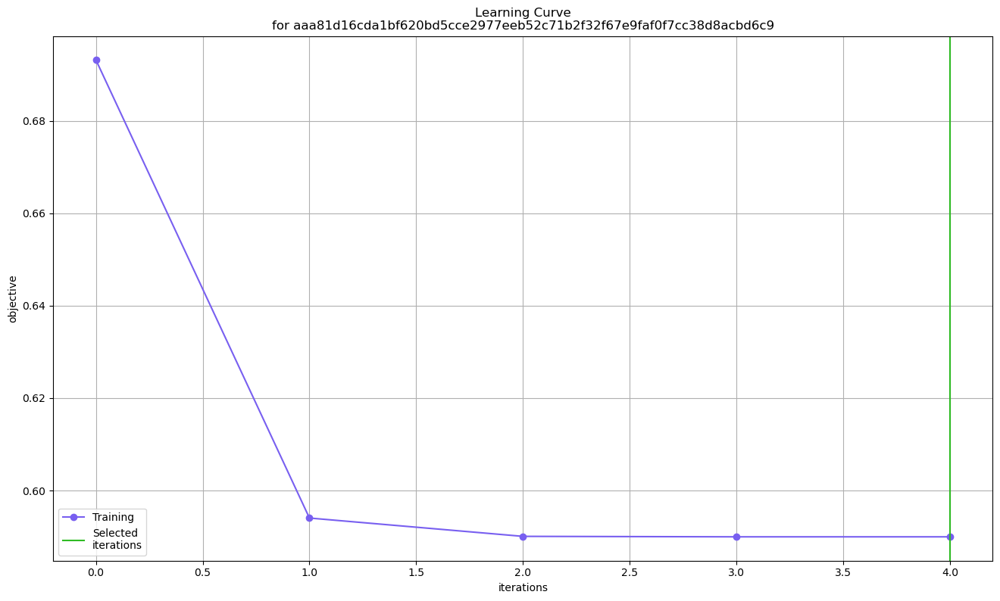

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

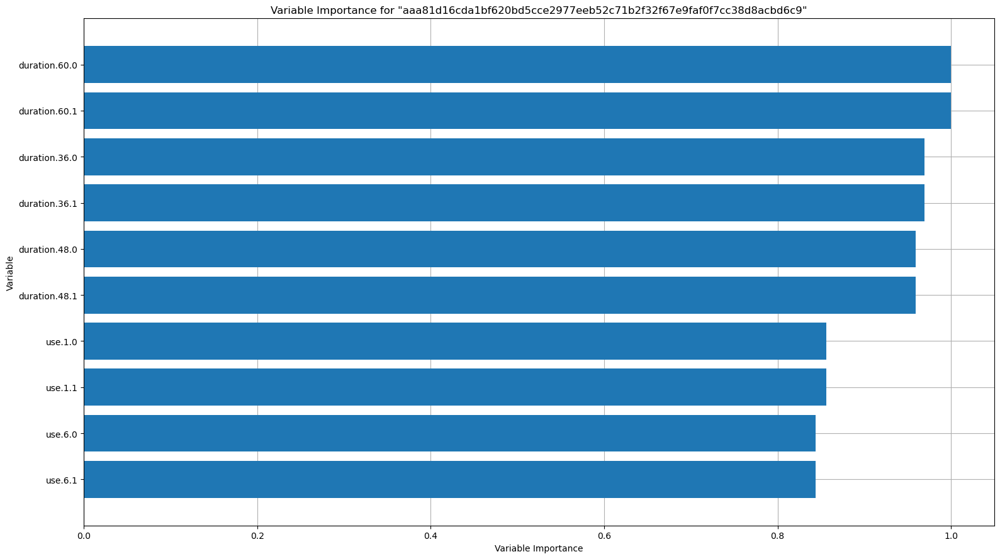

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

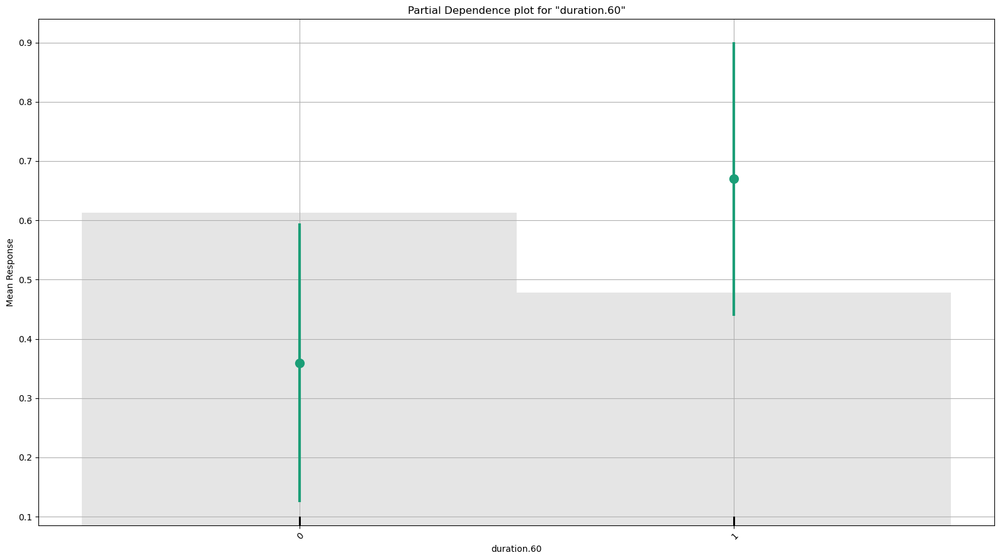

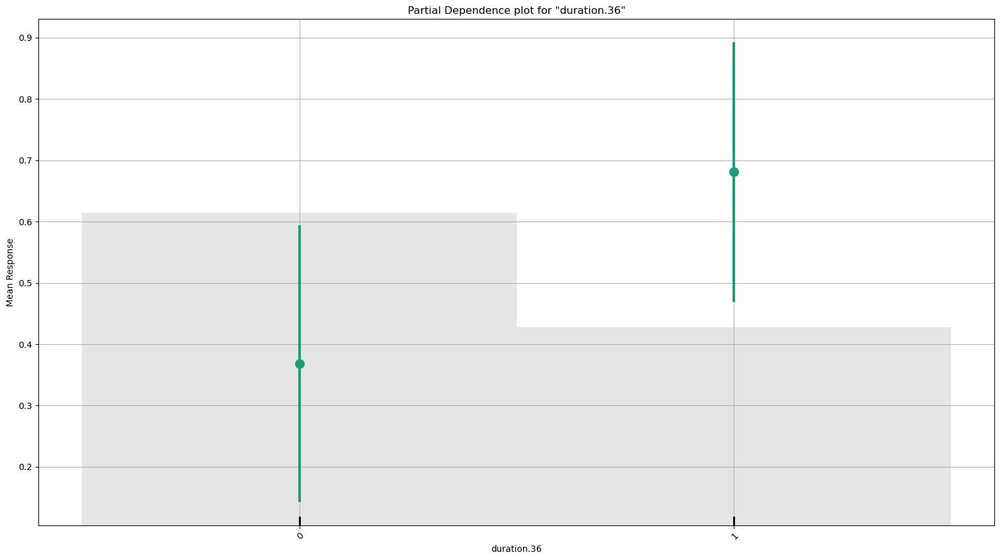

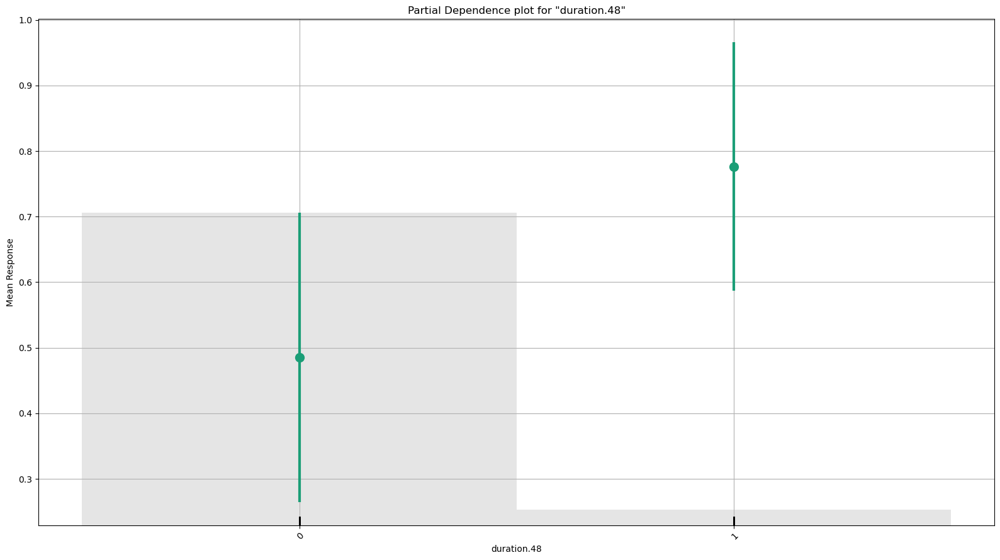

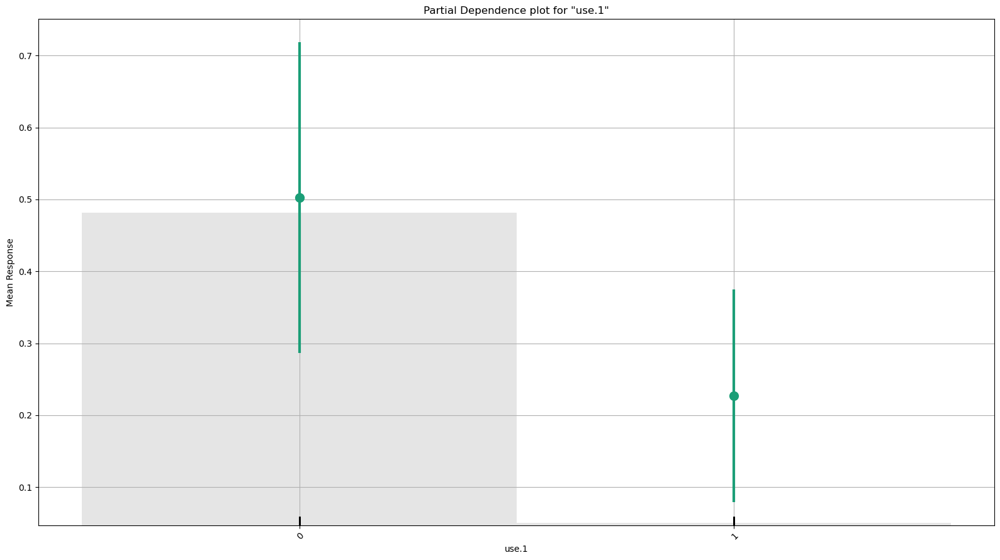

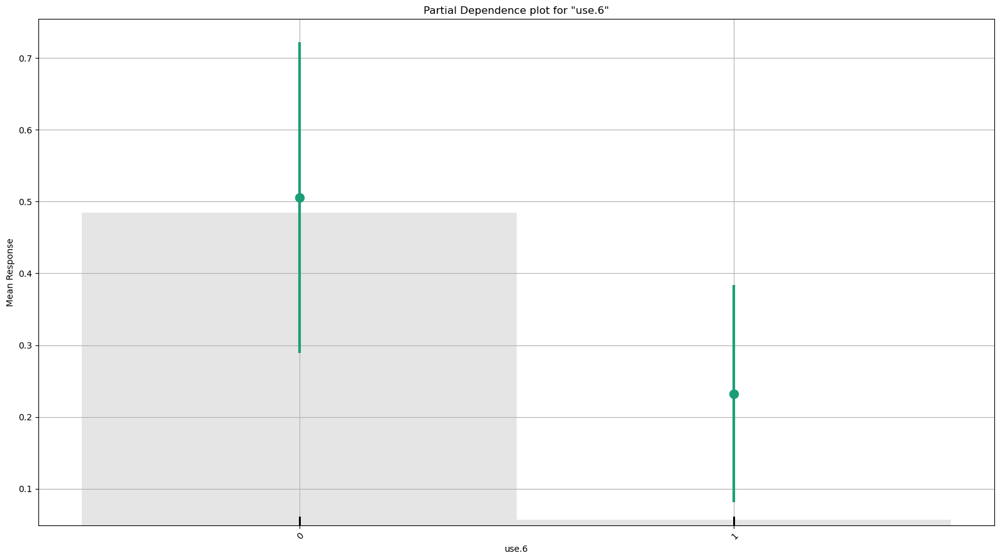

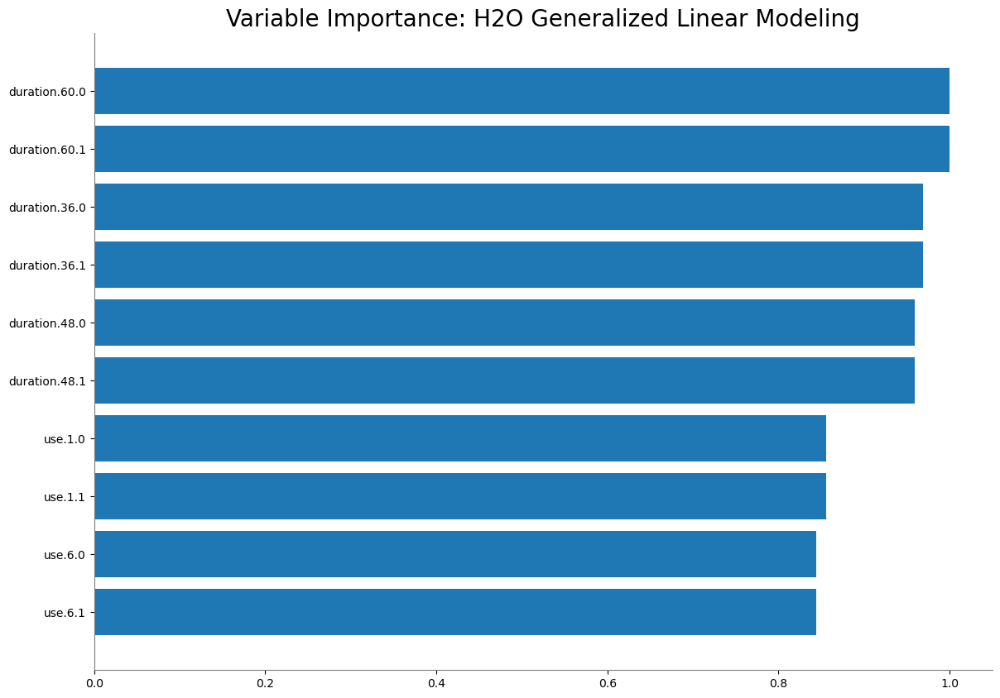

<Figure size 640x480 with 0 Axes>

In [61]:
# Group_GLM_1 (training set)
# Model interpretation
h2o.explain(Group_GLM_1, train_data)

# Plot variable importance
Group_GLM_1.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## aaa81d16cda1bf620bd5cce2977eeb52c71b2f32f67e9faf0f7cc38d8acbd6c9

,0,1,Error,Rate
0,926.0,1442.0,0.609,(1442.0/2368.0)
1,224.0,2208.0,0.0921,(224.0/2432.0)
Total,1150.0,3650.0,0.3471,(1666.0/4800.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

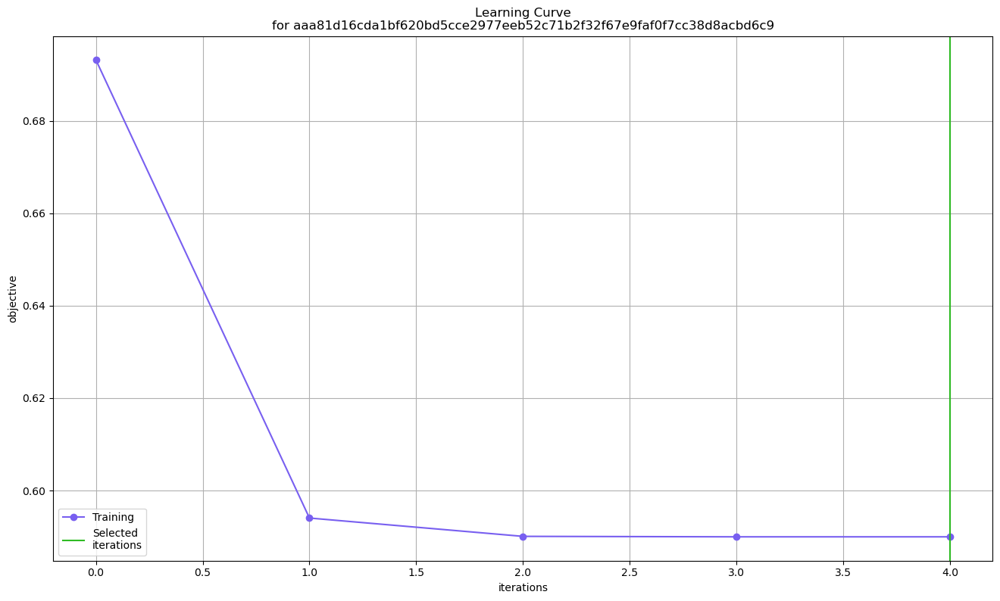

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

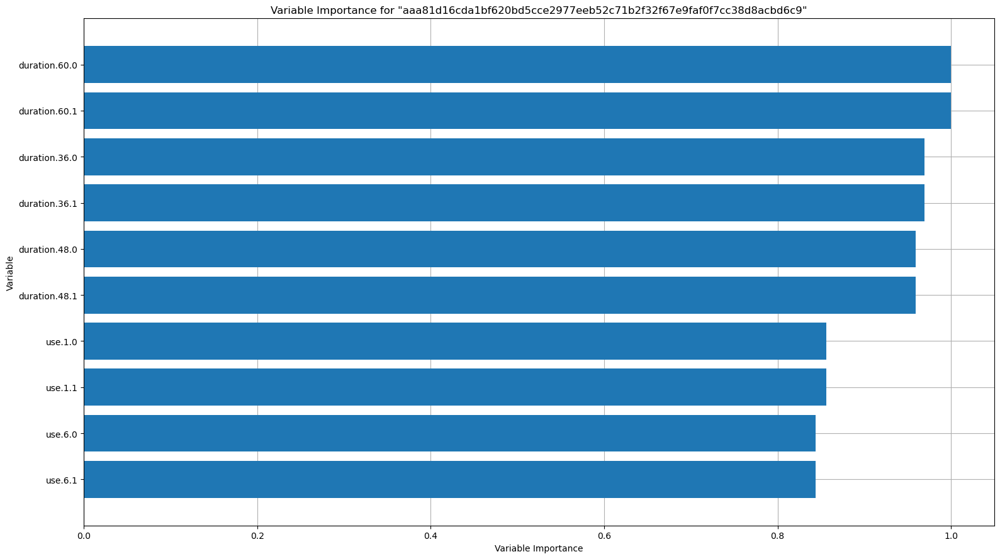

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

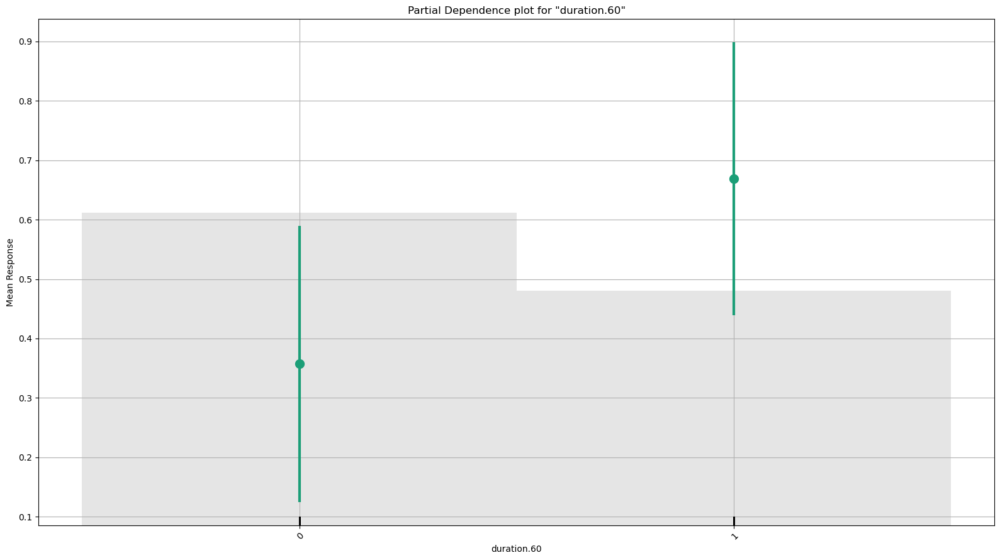

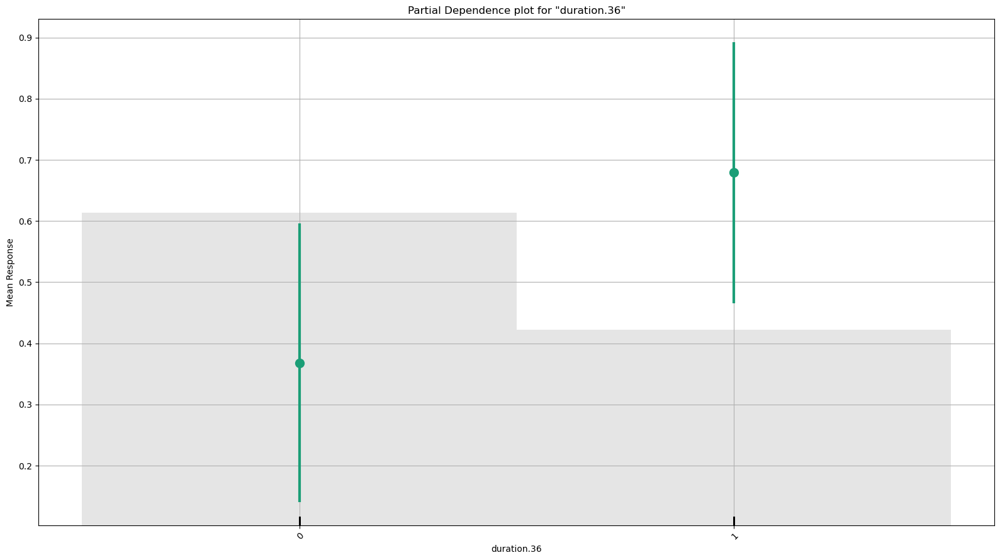

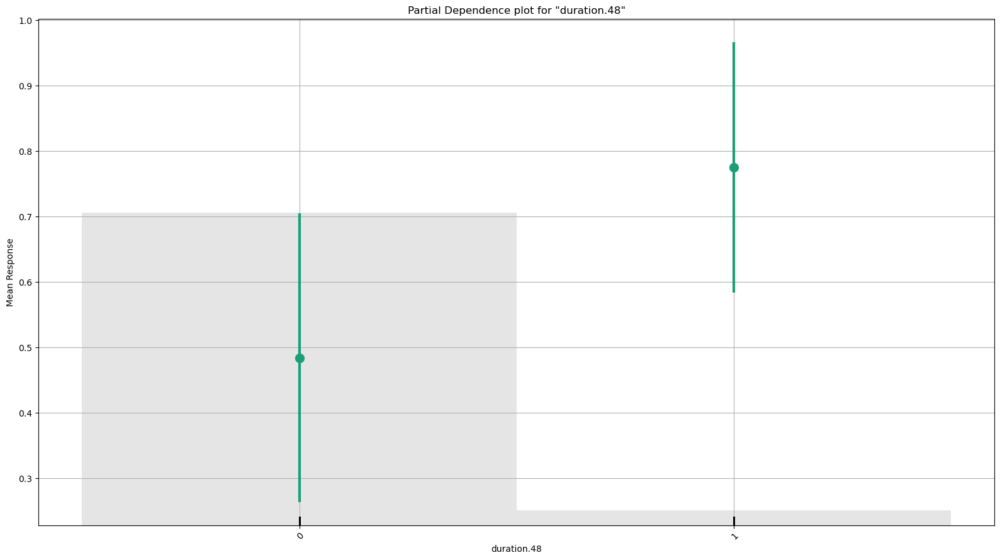

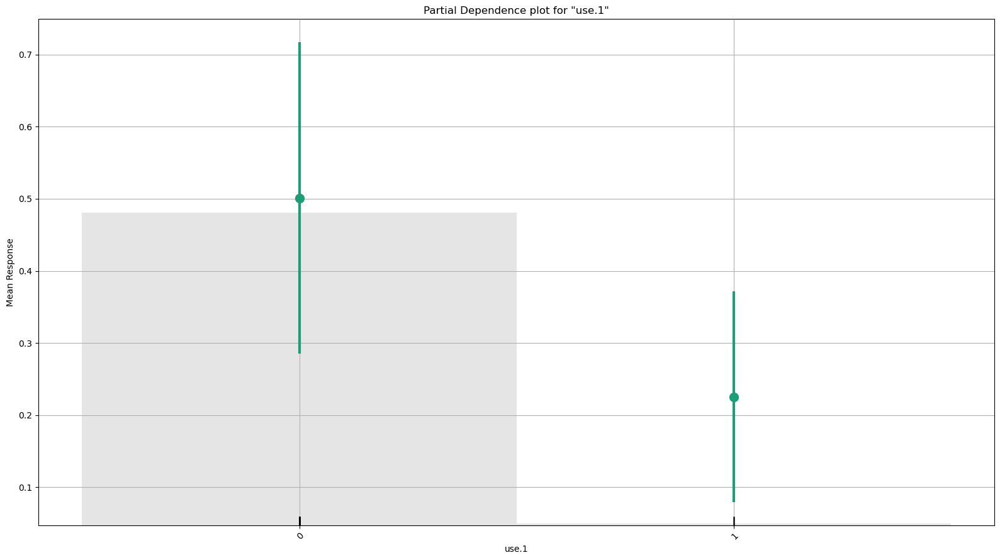

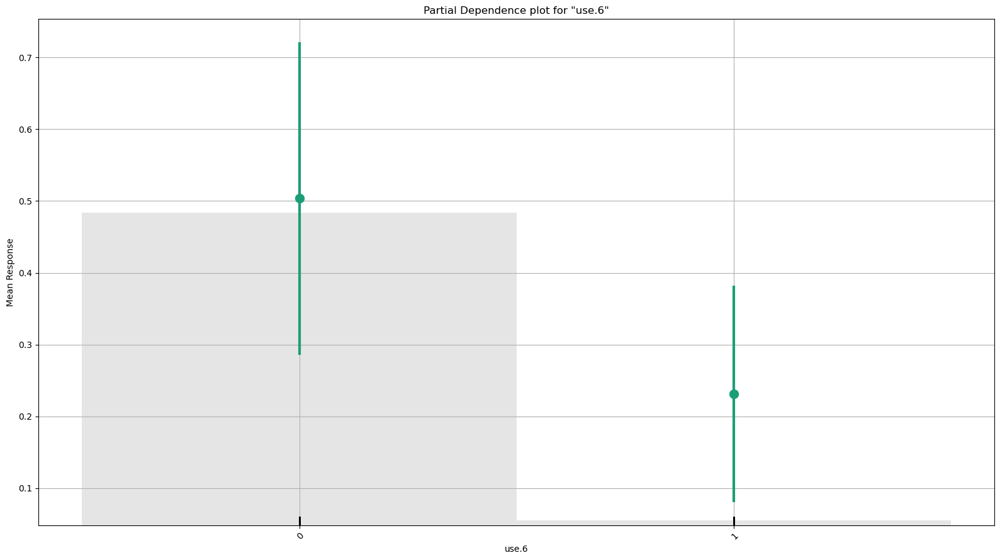

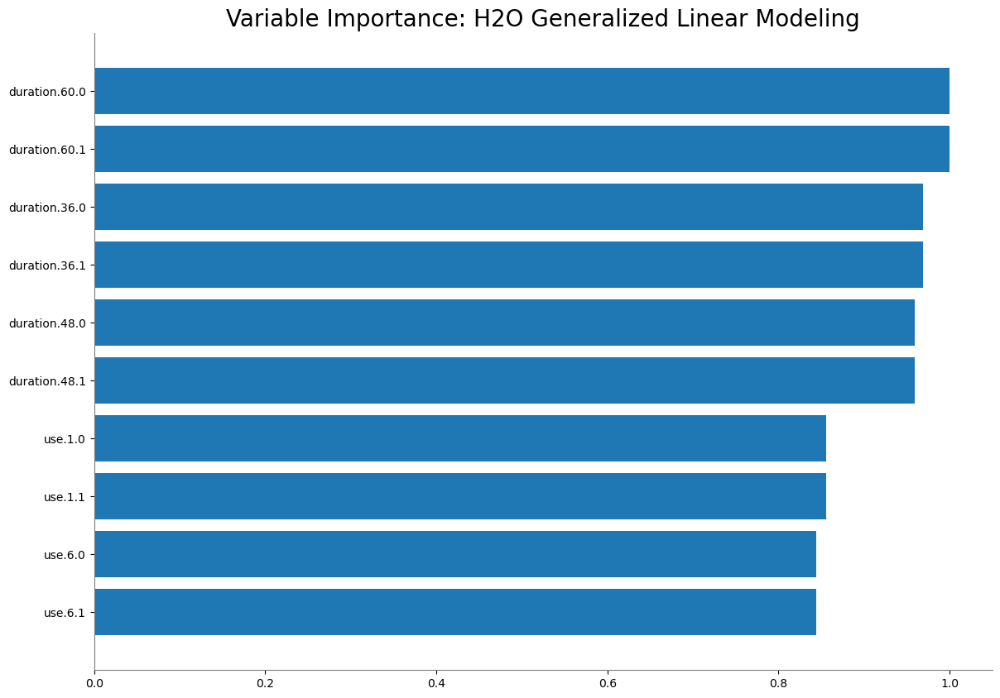

<Figure size 640x480 with 0 Axes>

In [62]:
# Group_GLM_1 (TEST SET)
# Model interpretation
h2o.explain(Group_GLM_1, test_data)

# Plot variable importance
Group_GLM_1.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## 8e6d6d0d2b4fb095e27a4b8e763989c4785f7fcaf44580714acb060ce0190b54

,0,1,Error,Rate
0,5069.0,2120.0,0.2949,(2120.0/7189.0)
1,1168.0,6043.0,0.162,(1168.0/7211.0)
Total,6237.0,8163.0,0.2283,(3288.0/14400.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

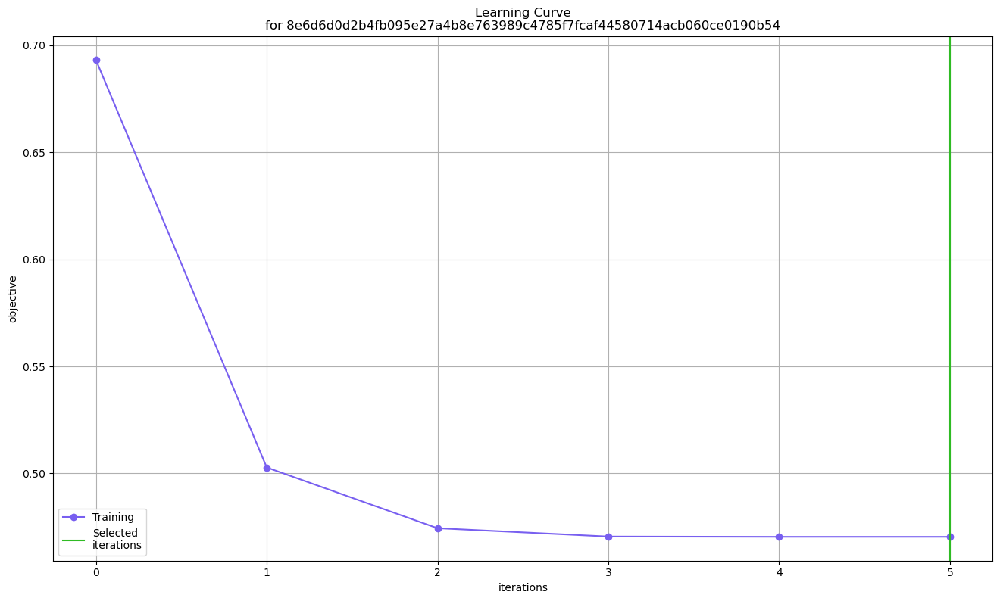

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

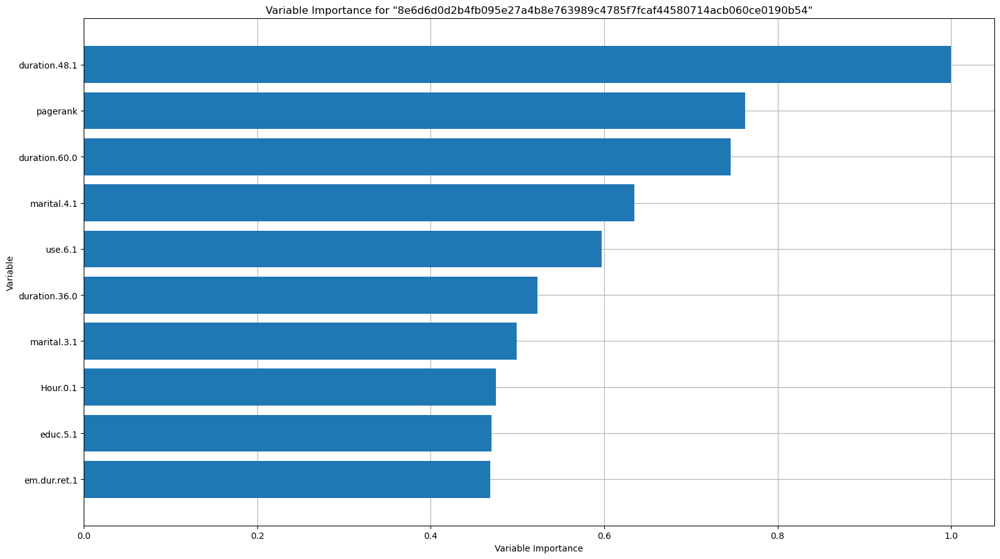

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

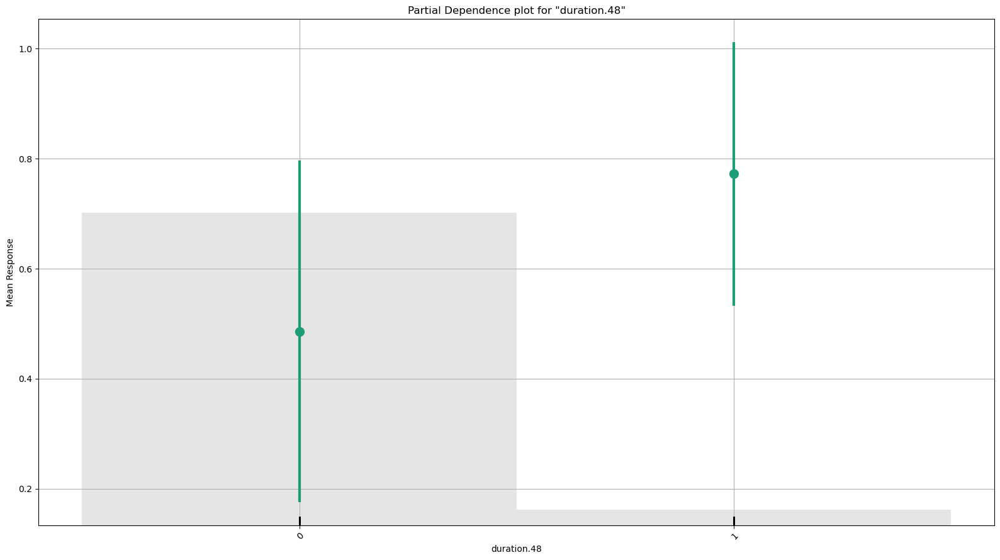

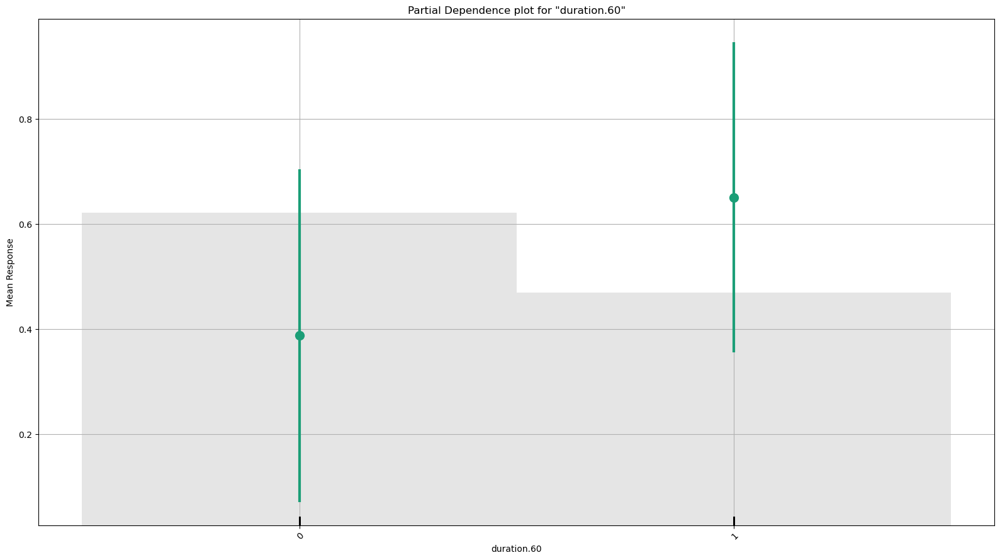

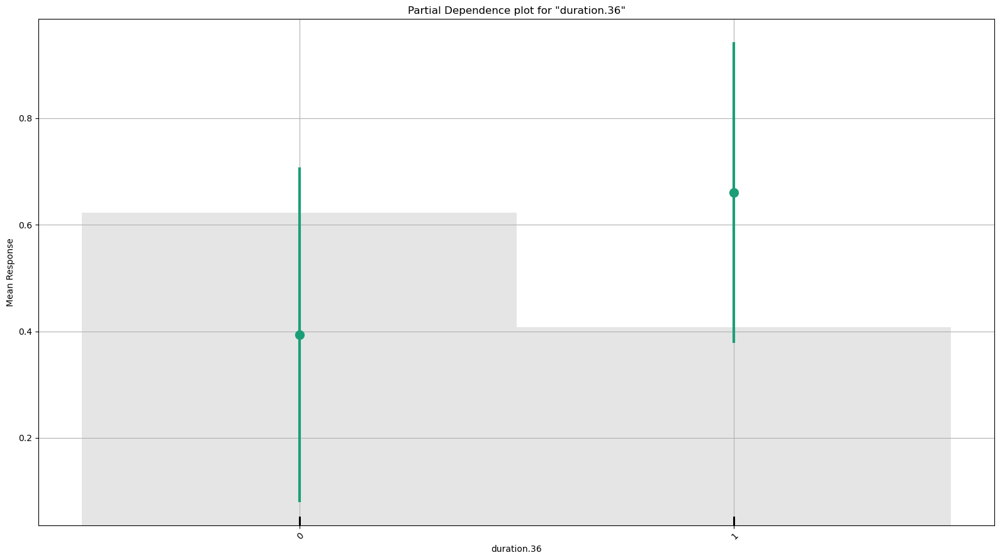

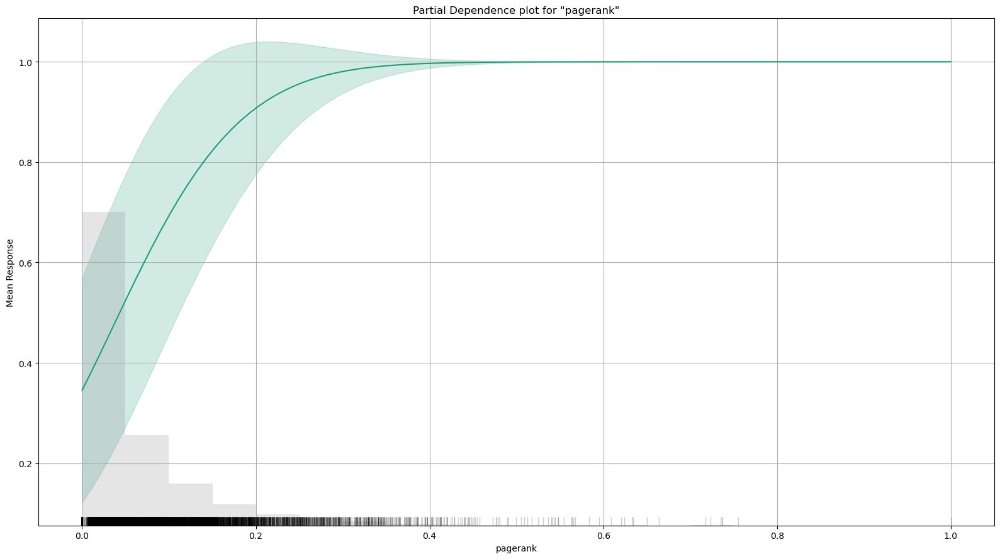

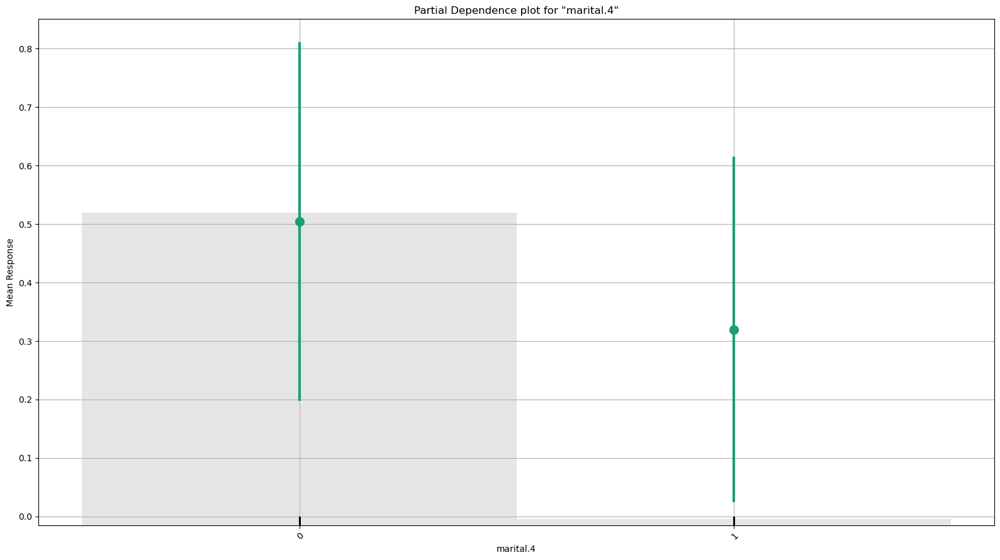

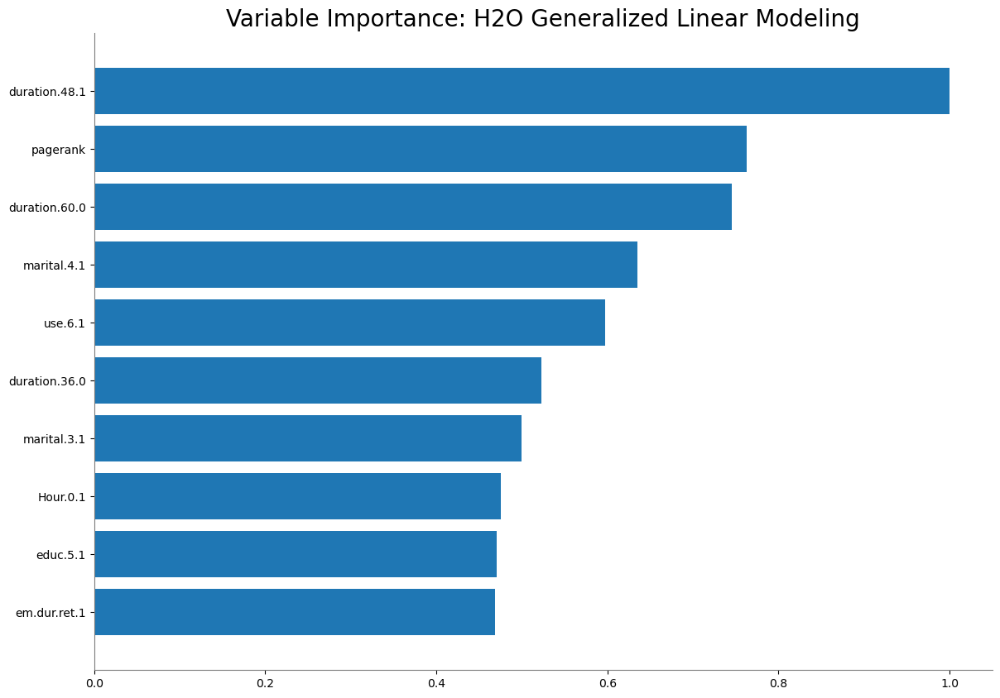

<Figure size 640x480 with 0 Axes>

In [63]:
# Group_GLM_2 (training set)
# Model interpretation
h2o.explain(Group_GLM_2, train_data)

# Plot variable importance
Group_GLM_2.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## 8e6d6d0d2b4fb095e27a4b8e763989c4785f7fcaf44580714acb060ce0190b54

,0,1,Error,Rate
0,1644.0,724.0,0.3057,(724.0/2368.0)
1,448.0,1984.0,0.1842,(448.0/2432.0)
Total,2092.0,2708.0,0.2442,(1172.0/4800.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

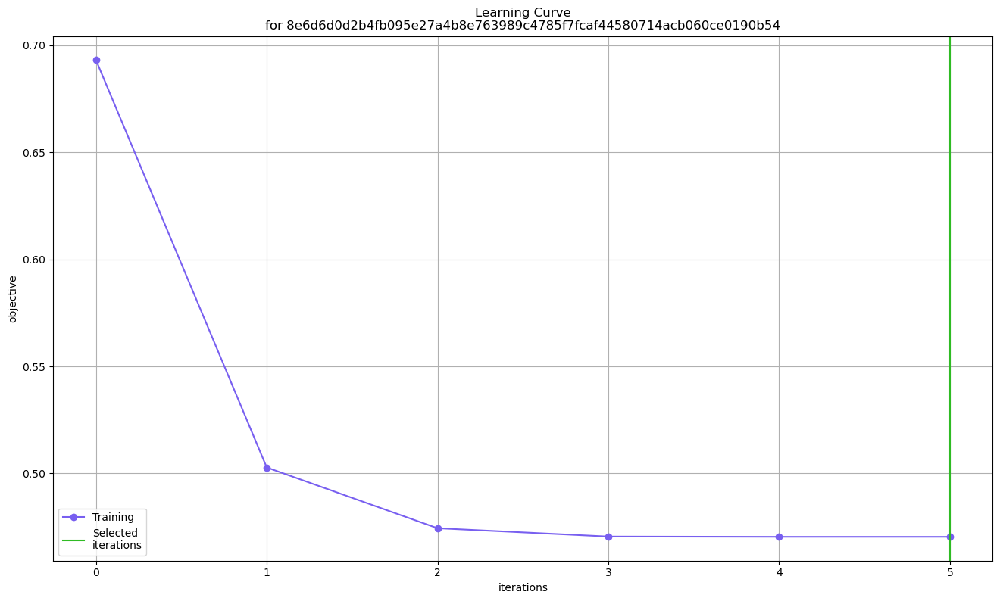

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

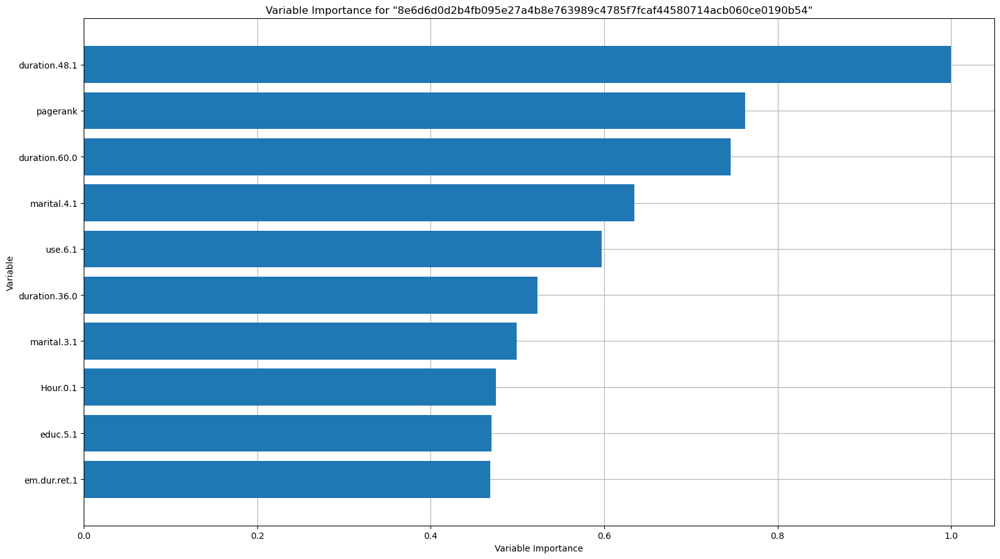

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

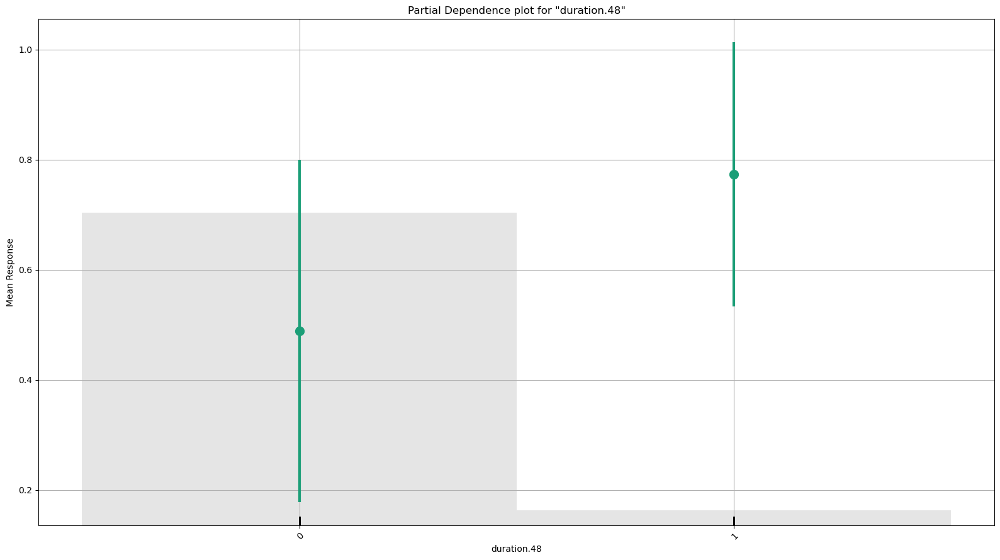

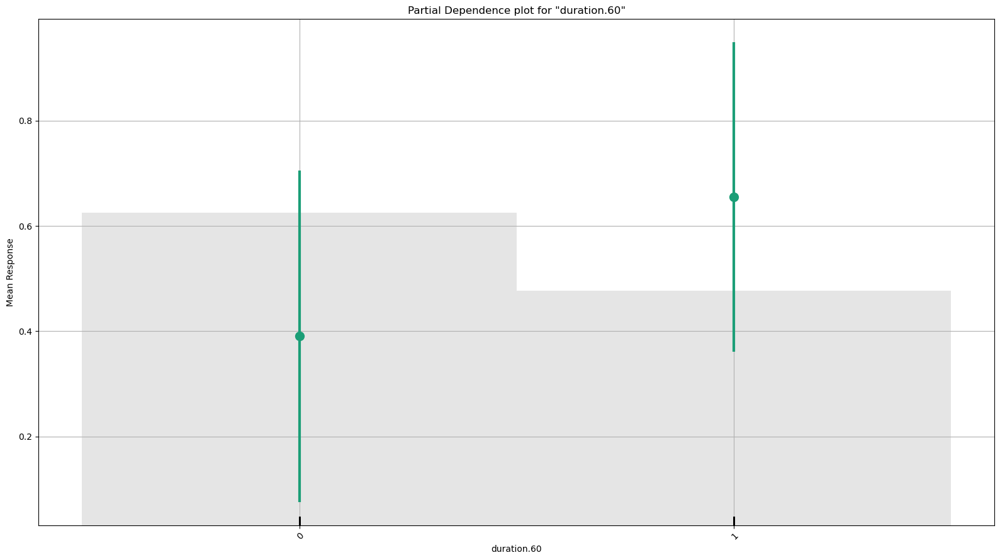

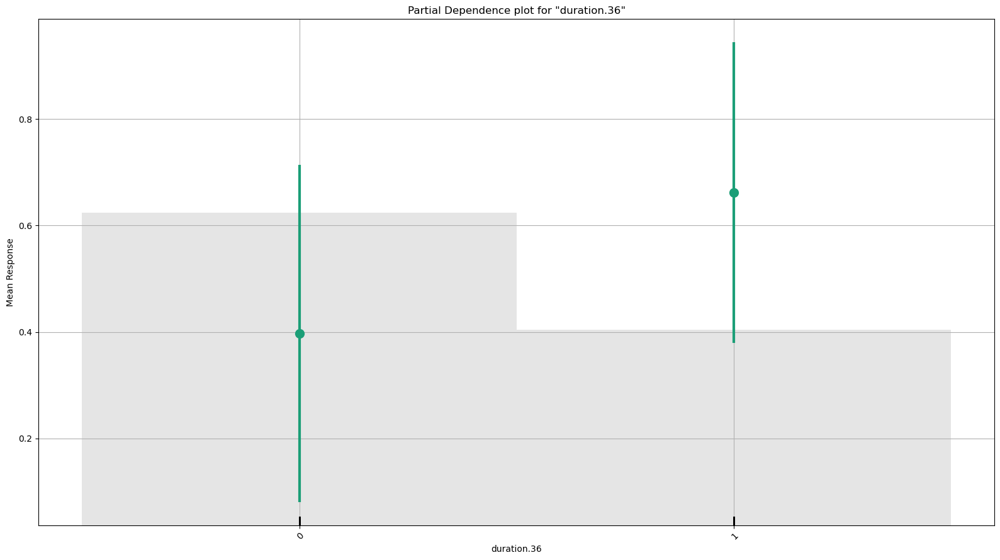

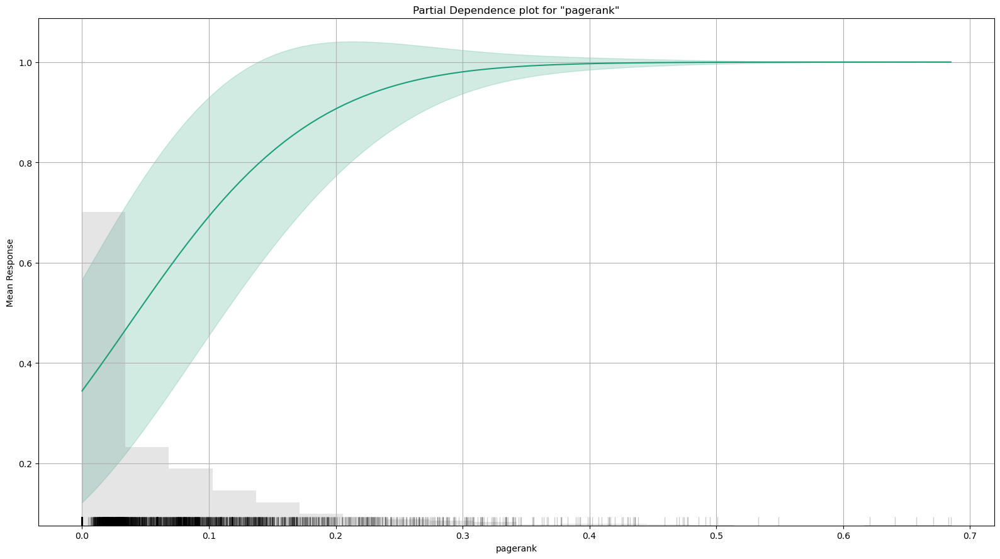

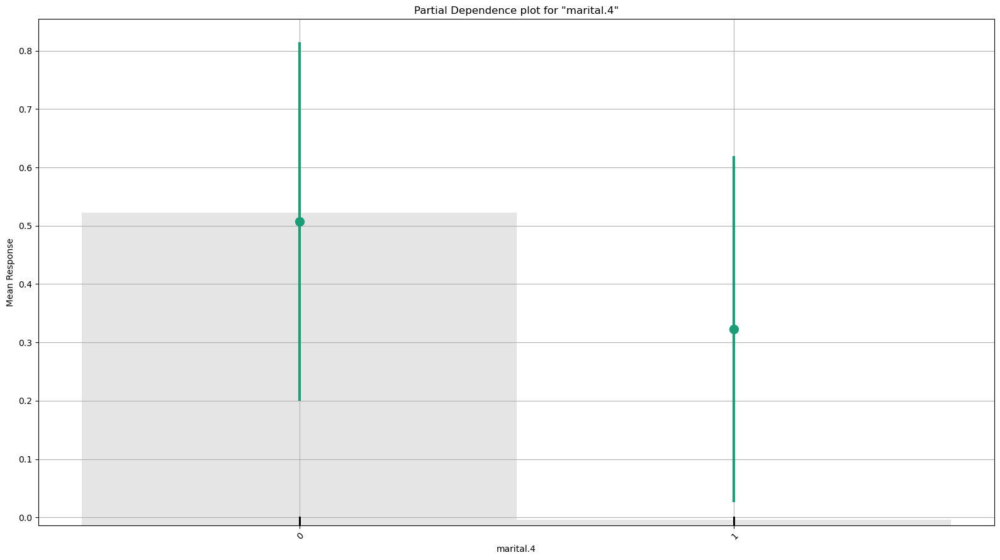

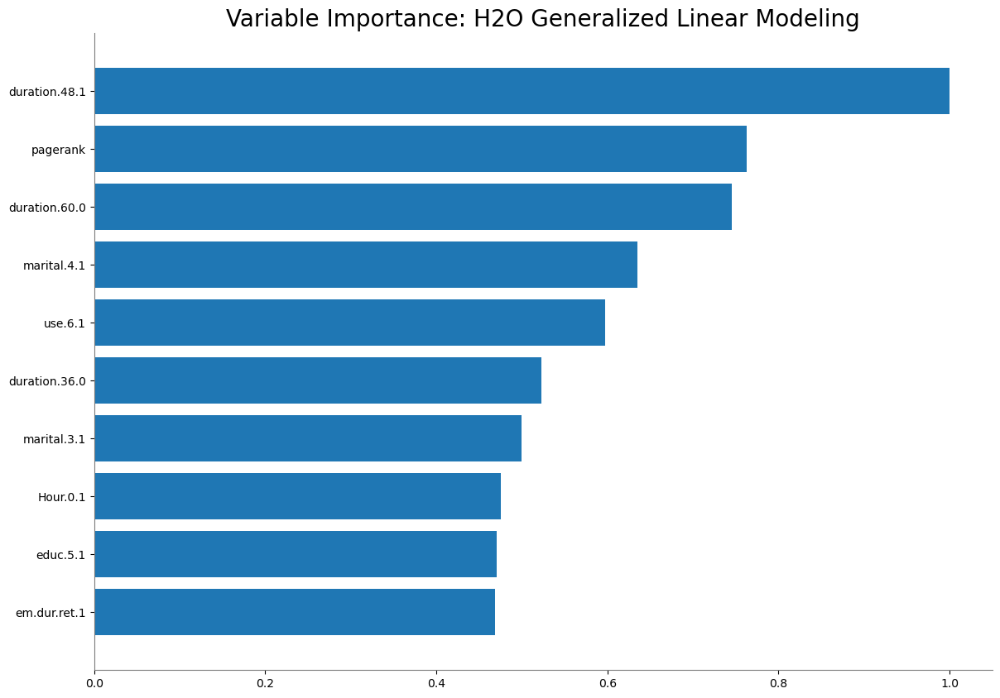

<Figure size 640x480 with 0 Axes>

In [64]:
# Group_GLM_2 (TEST SET)
# Model interpretation
h2o.explain(Group_GLM_2, test_data)

# Plot variable importance
Group_GLM_2.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## bebdf9b502a85fb82e34b4d6338434ee5aedcb0c7493d79ba20fffe7a4259d0e

,0,1,Error,Rate
0,3217.0,3972.0,0.5525,(3972.0/7189.0)
1,808.0,6403.0,0.1121,(808.0/7211.0)
Total,4025.0,10375.0,0.3319,(4780.0/14400.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

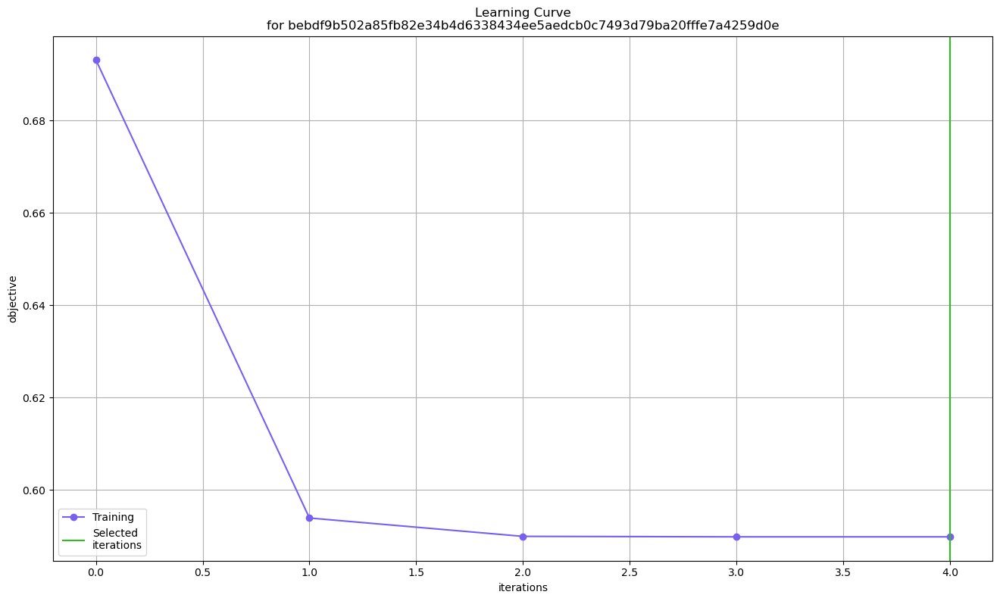

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

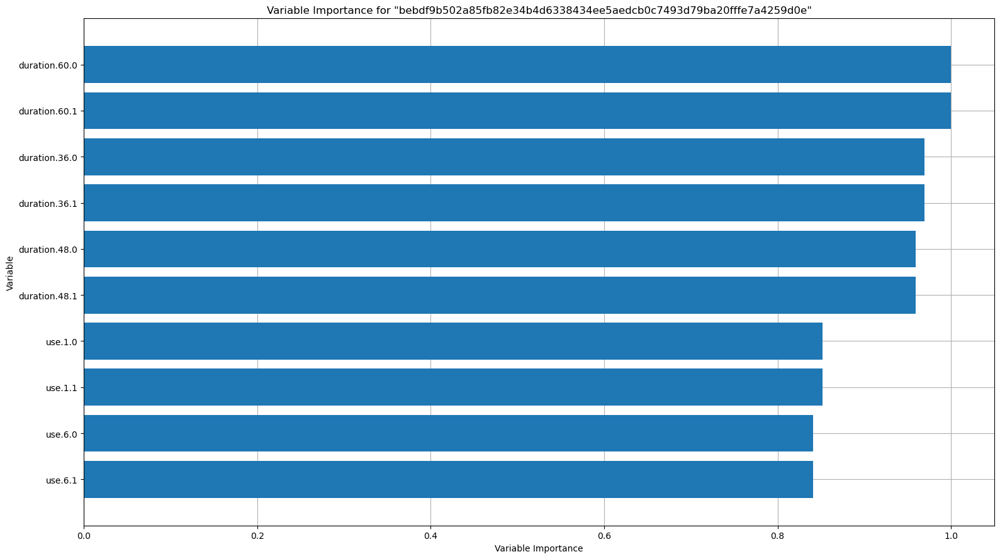

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

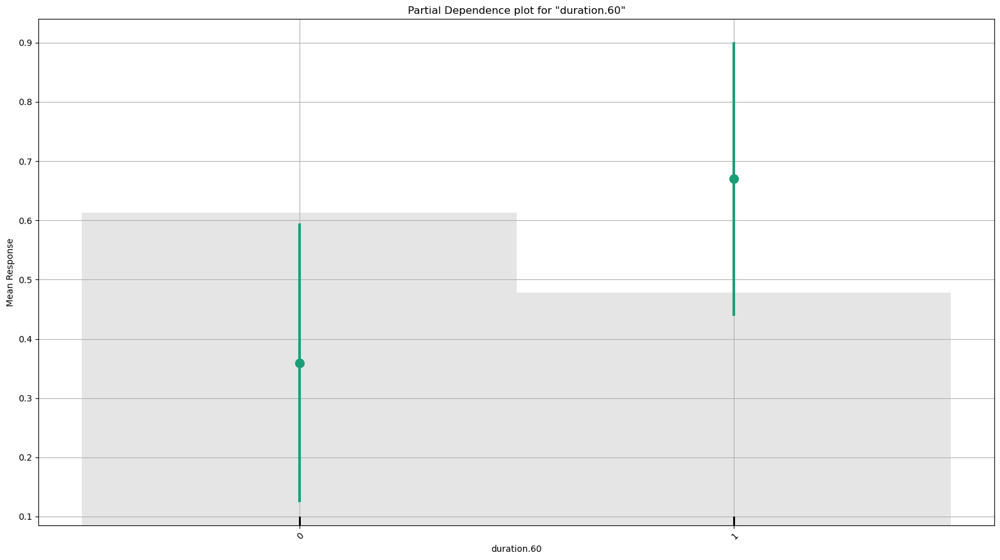

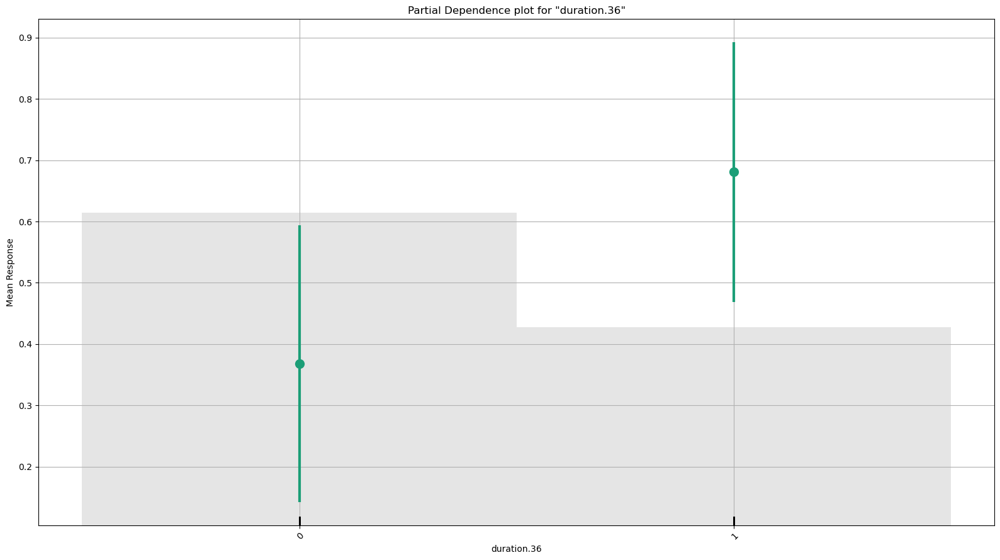

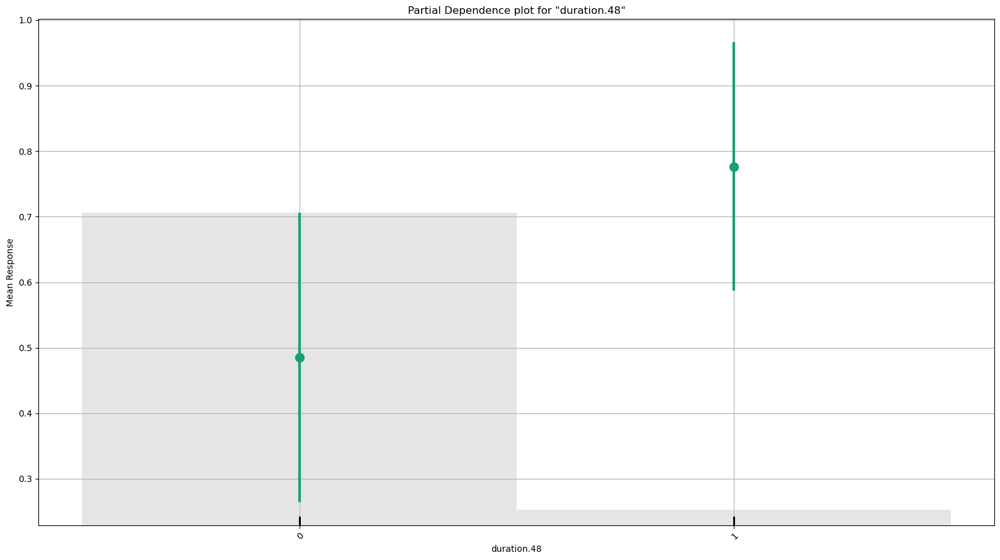

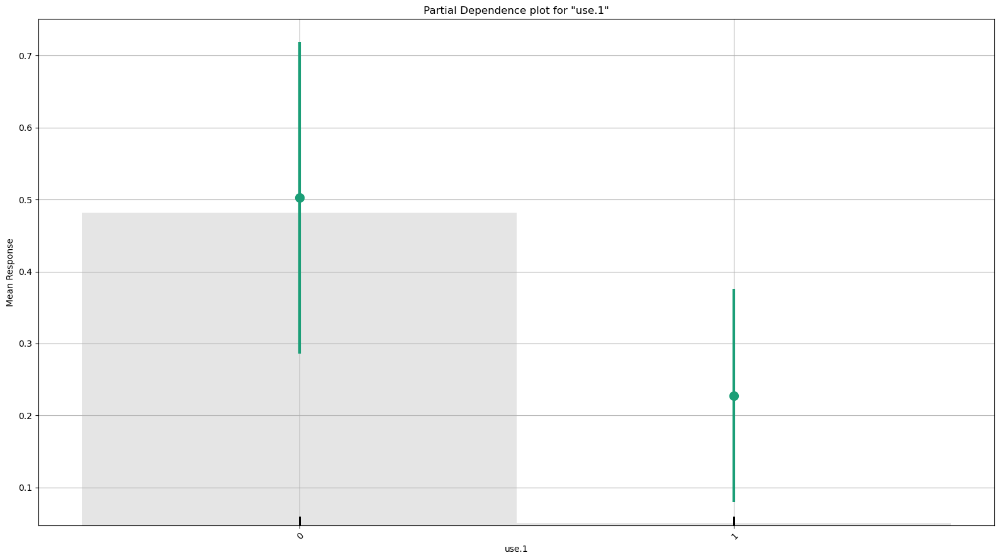

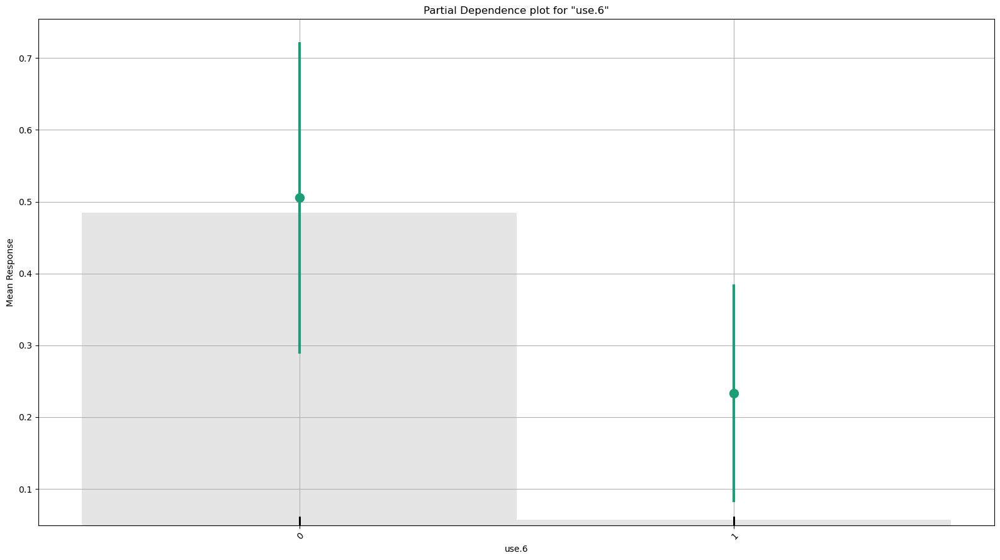

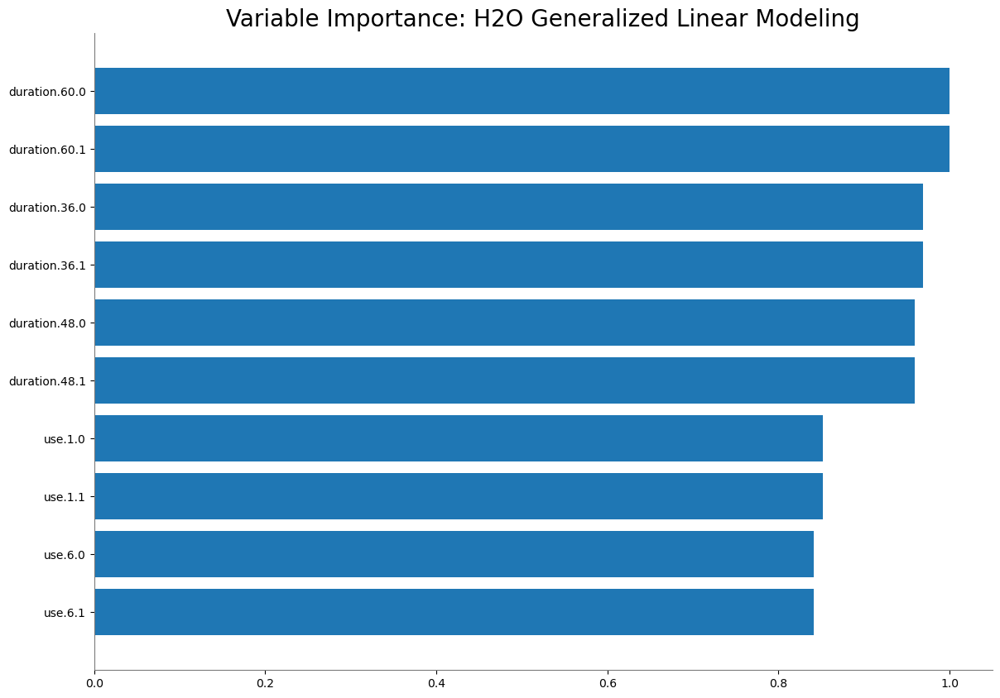

<Figure size 640x480 with 0 Axes>

In [65]:
# Group_GLM_3 (training set)
# Model interpretation
h2o.explain(Group_GLM_3, train_data)

# Plot variable importance
Group_GLM_3.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## bebdf9b502a85fb82e34b4d6338434ee5aedcb0c7493d79ba20fffe7a4259d0e

,0,1,Error,Rate
0,947.0,1421.0,0.6001,(1421.0/2368.0)
1,236.0,2196.0,0.097,(236.0/2432.0)
Total,1183.0,3617.0,0.3452,(1657.0/4800.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

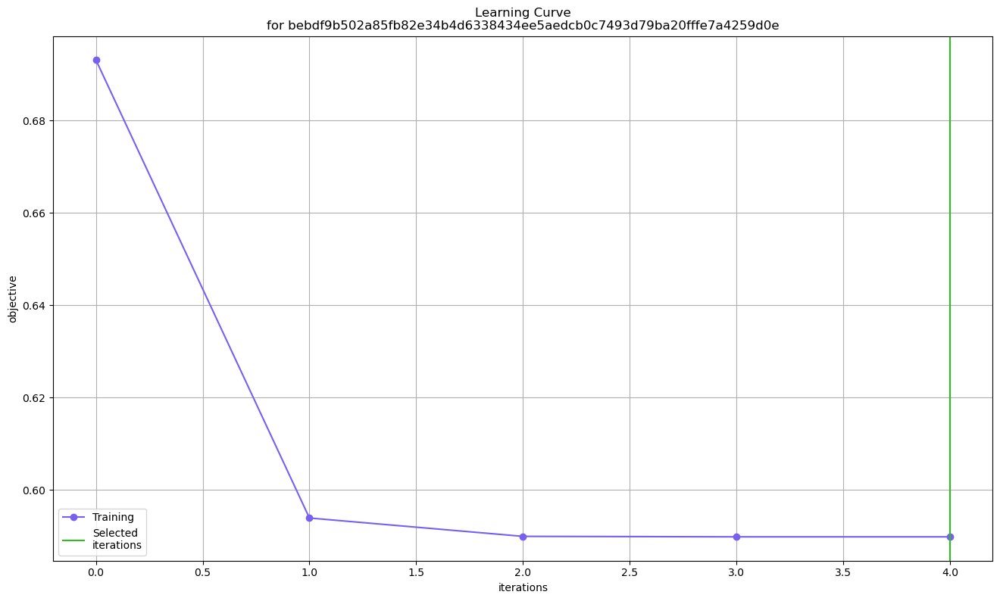

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

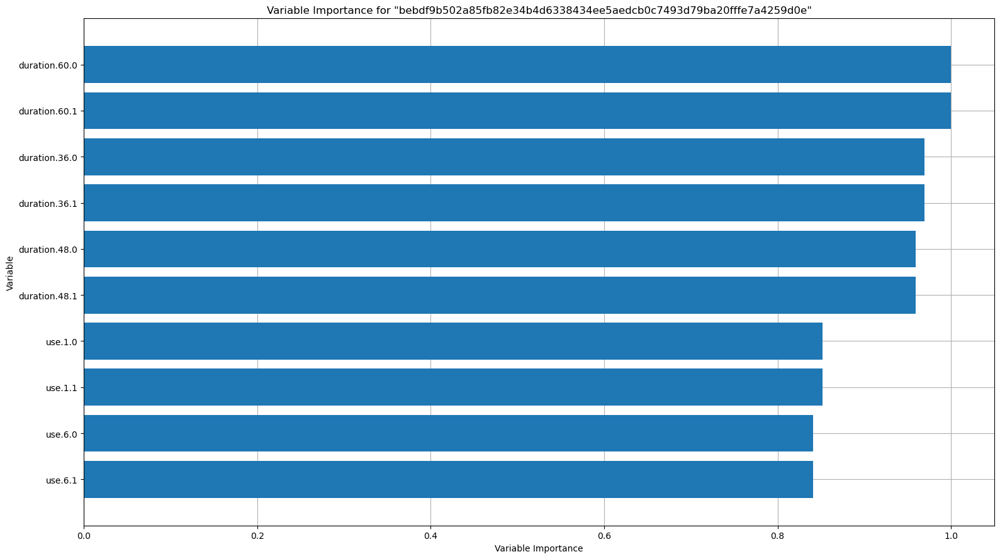

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

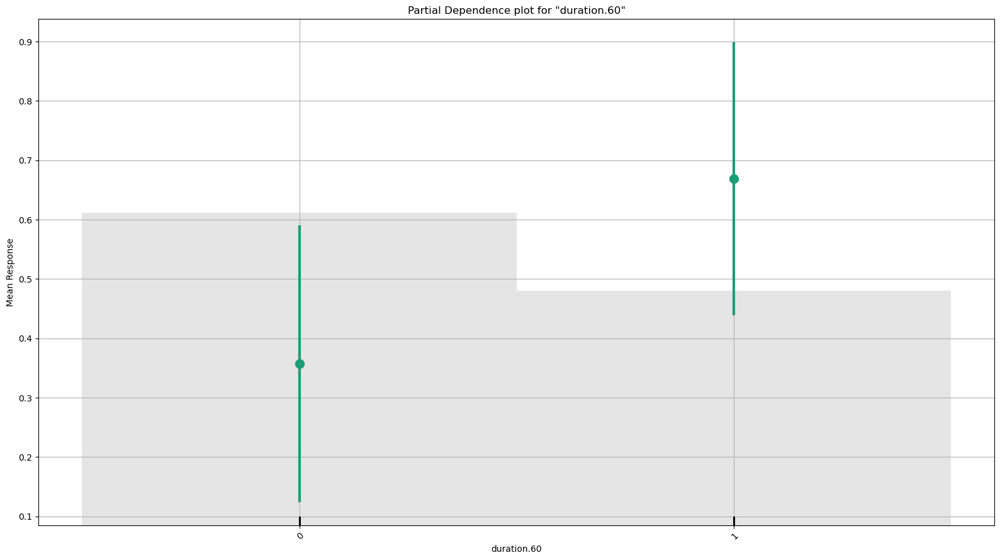

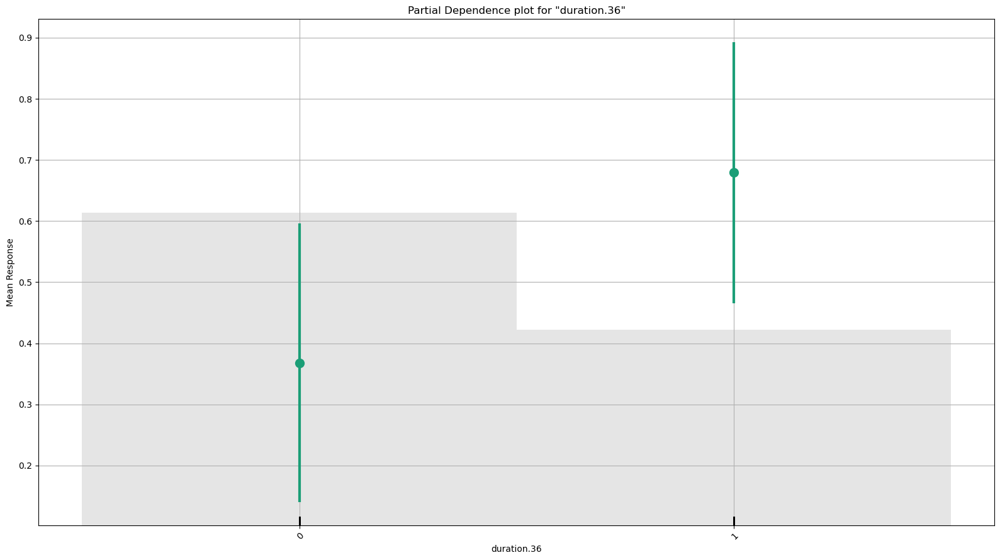

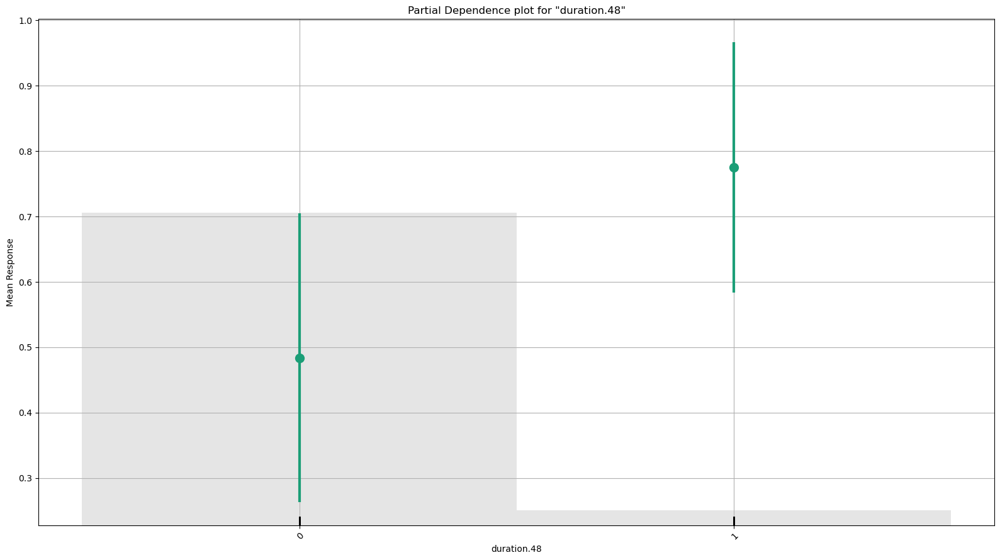

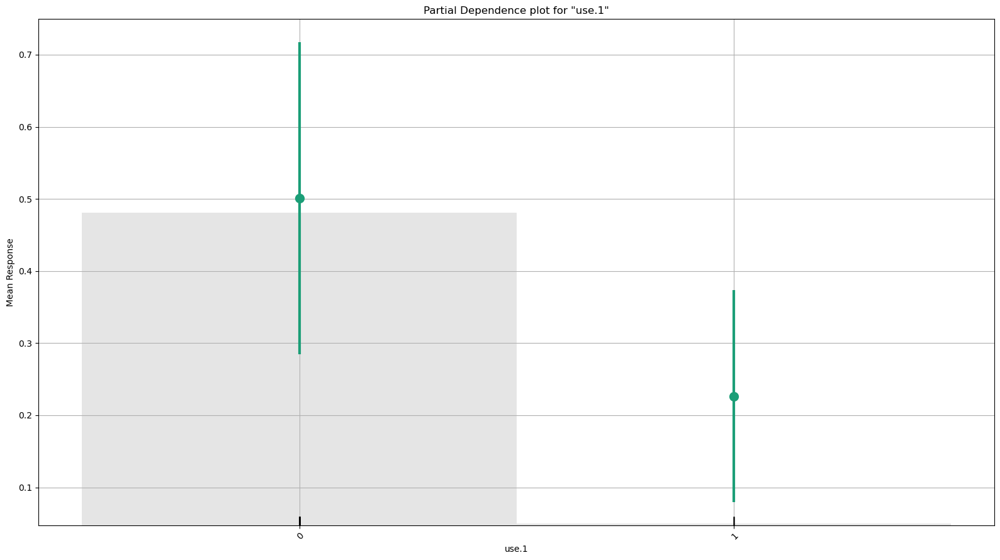

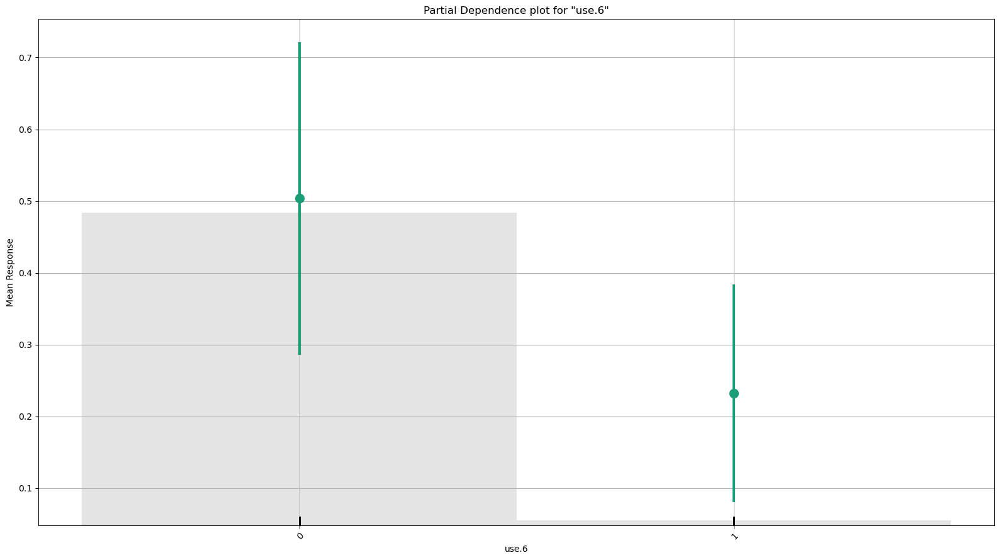

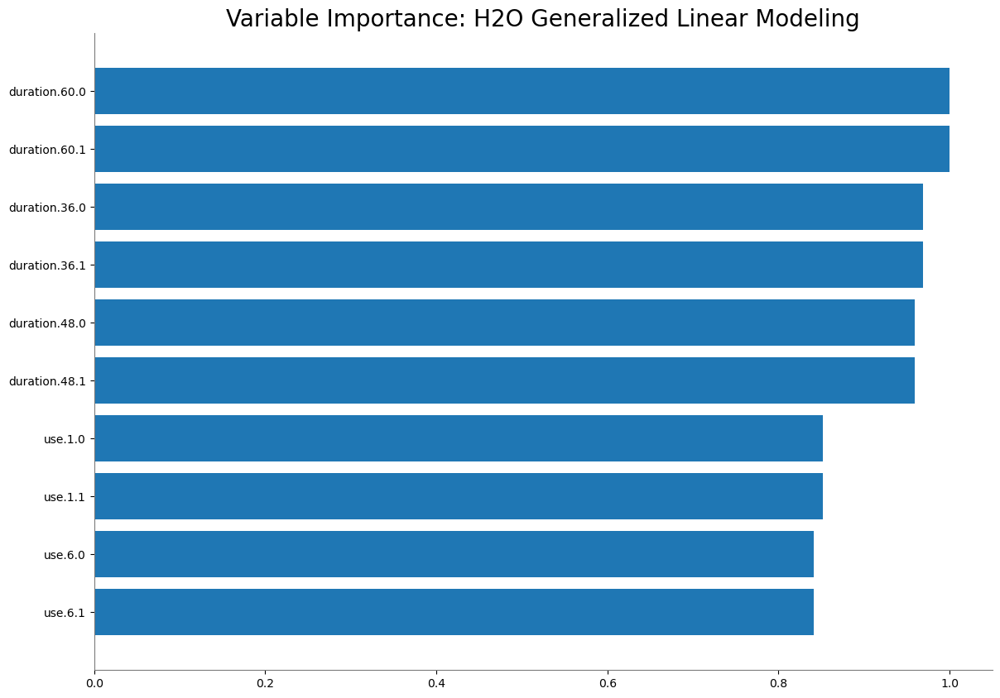

<Figure size 640x480 with 0 Axes>

In [66]:
# Group_GLM_3 (TEST SET)
# Model interpretation
h2o.explain(Group_GLM_3, test_data)

# Plot variable importance
Group_GLM_3.varimp_plot()

### RF Models

In [71]:
# load best model from group of RF models based on output_info in /Desktop/P2P-Bondora/output_info
# best models are chosen according to AUC criterion.
# Models are different according to the exclusion list and feature selection (detailed in output_info)

Group_RF_1 = get_model_by_hash(model_directory, 'c6444352544b1af0aefba03fcbc78ae99b55742f8d023a5bcea7d8502cc30c9f')

Group_RF_2 = get_model_by_hash(model_directory, 'dfe47e75ca9003debc9e7b7117e369e1b4db5f68f7427791a56362bd0acff391')

Group_RF_3 = get_model_by_hash(model_directory, 'e84d4f5cb53ebcfed23636eccd0f9e30d4358cae7b67e29422c813d5de3d636a')

Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/c6444352544b1af0aefba03fcbc78ae99b55742f8d023a5bcea7d8502cc30c9f/c6444352544b1af0aefba03fcbc78ae99b55742f8d023a5bcea7d8502cc30c9f
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/dfe47e75ca9003debc9e7b7117e369e1b4db5f68f7427791a56362bd0acff391/dfe47e75ca9003debc9e7b7117e369e1b4db5f68f7427791a56362bd0acff391
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/e84d4f5cb53ebcfed23636eccd0f9e30d4358cae7b67e29422c813d5de3d636a/e84d4f5cb53ebcfed23636eccd0f9e30d4358cae7b67e29422c813d5de3d636a


In [68]:
# Explain the different RF models

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## c6444352544b1af0aefba03fcbc78ae99b55742f8d023a5bcea7d8502cc30c9f

,0,1,Error,Rate
0,6491.0,698.0,0.0971,(698.0/7189.0)
1,358.0,6853.0,0.0496,(358.0/7211.0)
Total,6849.0,7551.0,0.0733,(1056.0/14400.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

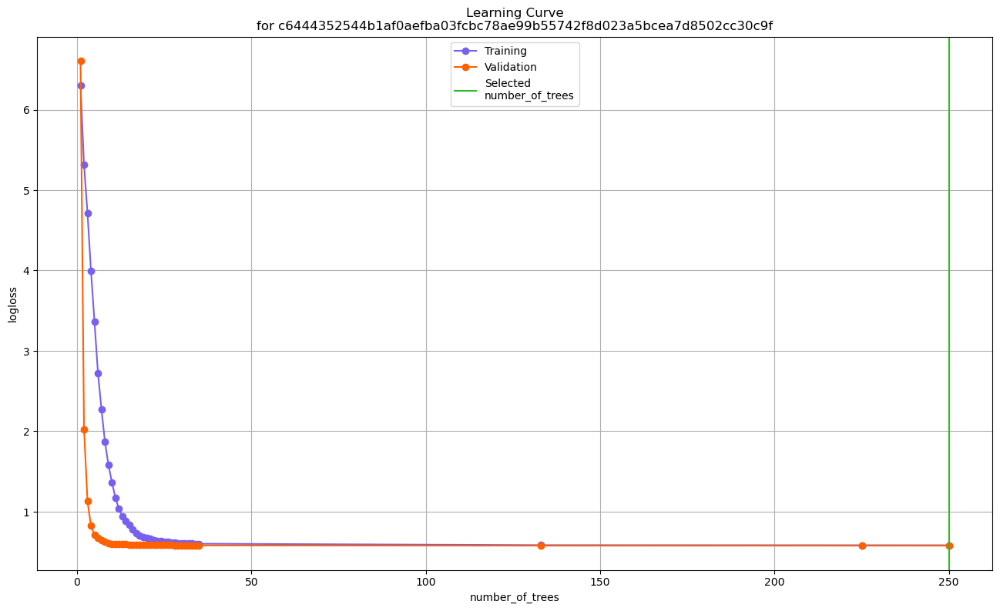

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

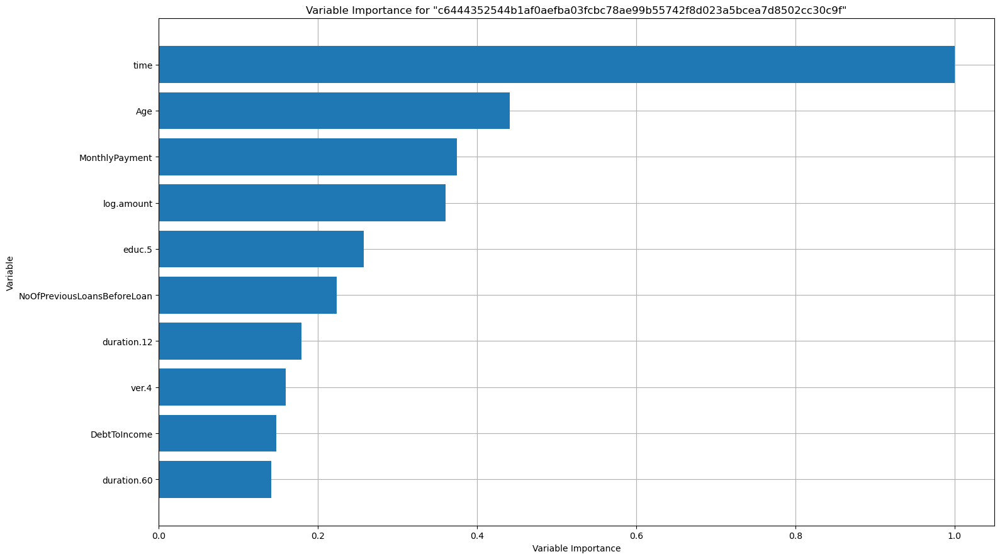

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

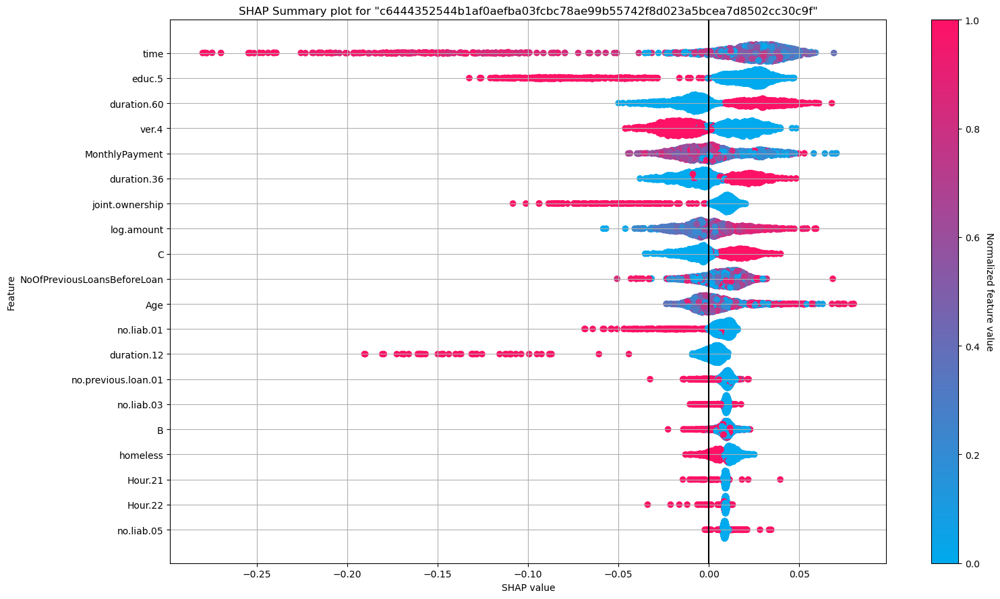

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

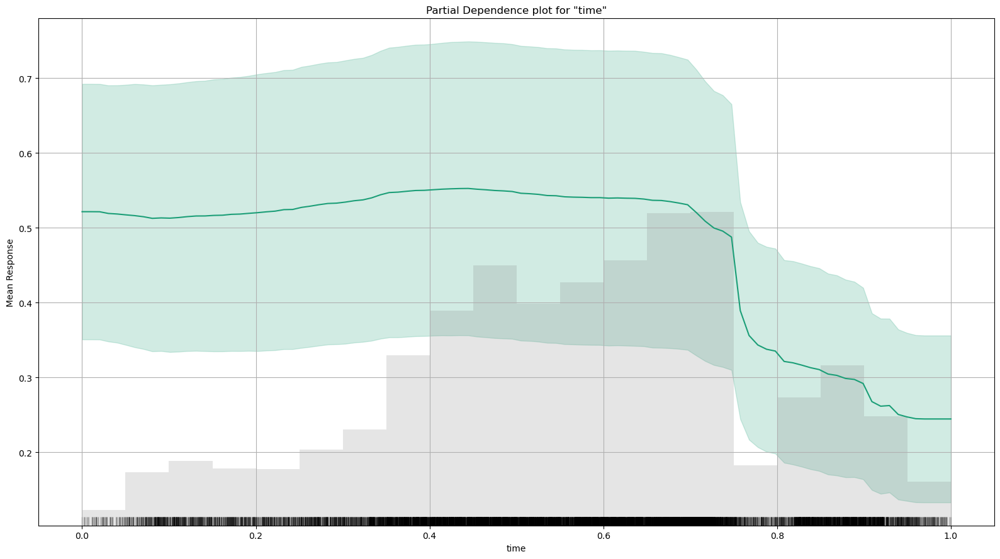

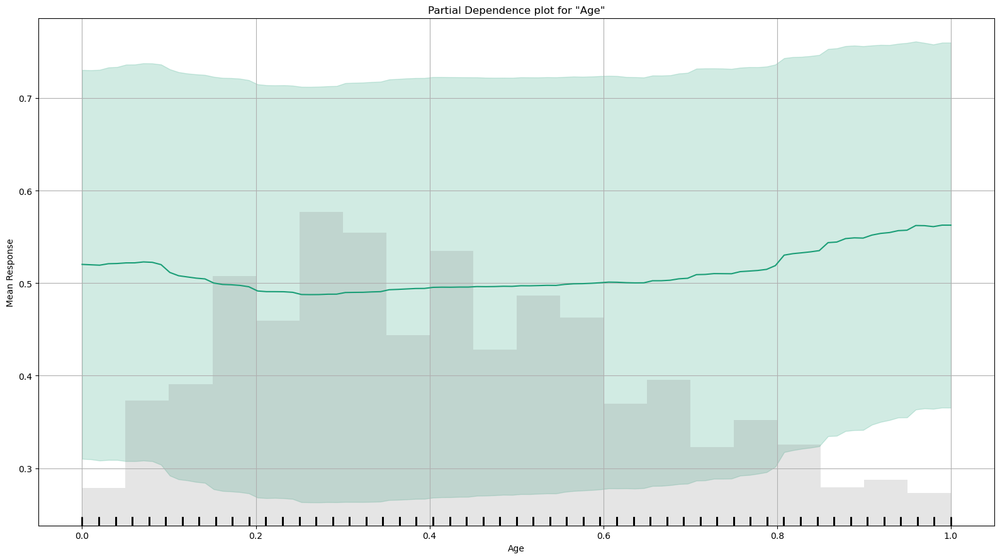

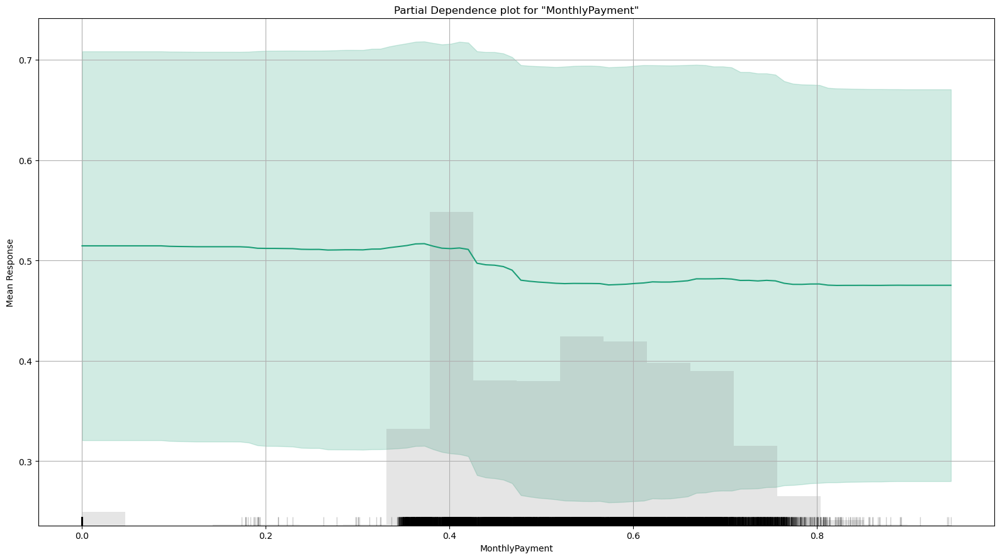

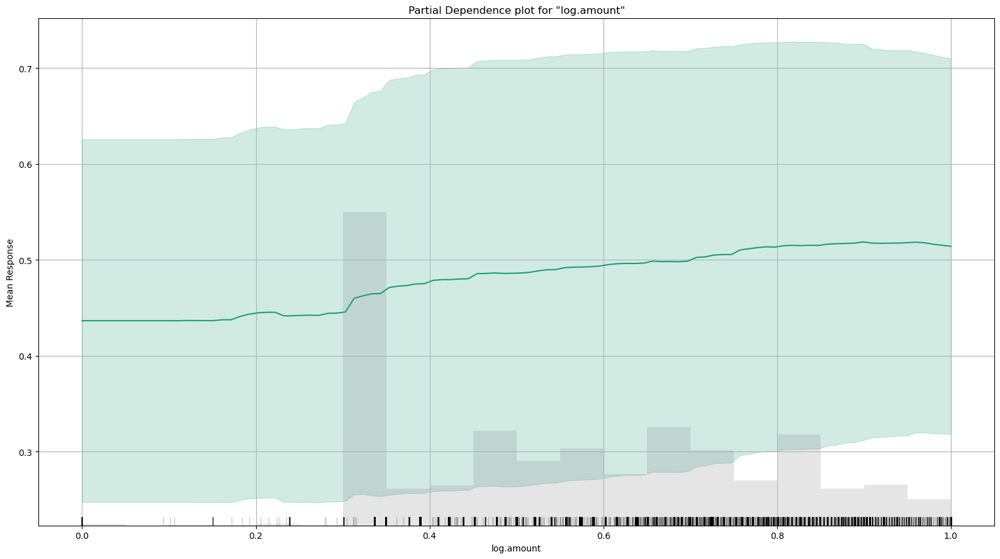

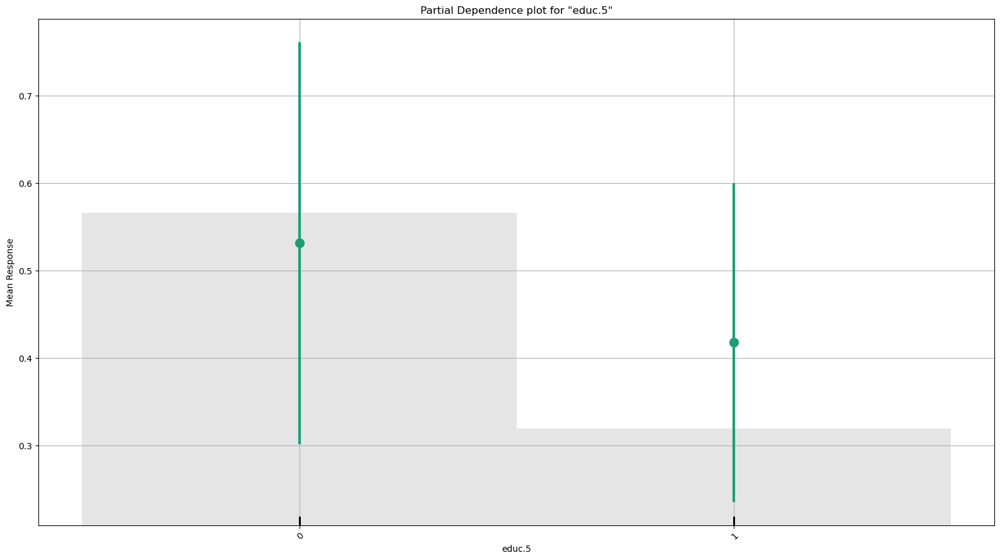

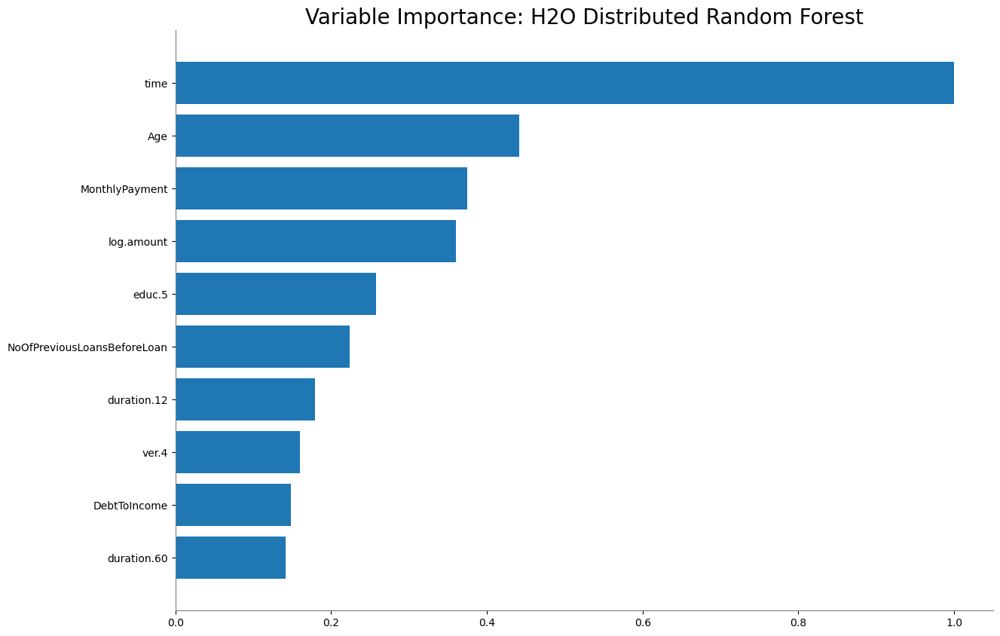

<Figure size 640x480 with 0 Axes>

In [69]:
# Group_RF_1 (training set)
# Model interpretation
h2o.explain(Group_RF_1, train_data)

# Plot variable importance
Group_RF_1.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## c6444352544b1af0aefba03fcbc78ae99b55742f8d023a5bcea7d8502cc30c9f

,0,1,Error,Rate
0,1057.0,1311.0,0.5536,(1311.0/2368.0)
1,253.0,2179.0,0.104,(253.0/2432.0)
Total,1310.0,3490.0,0.3258,(1564.0/4800.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

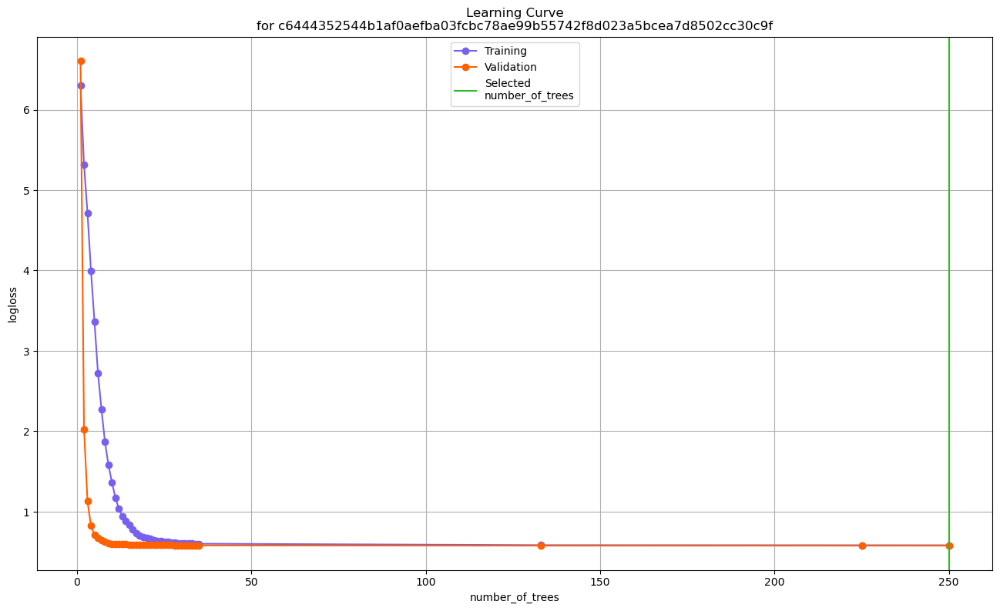

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

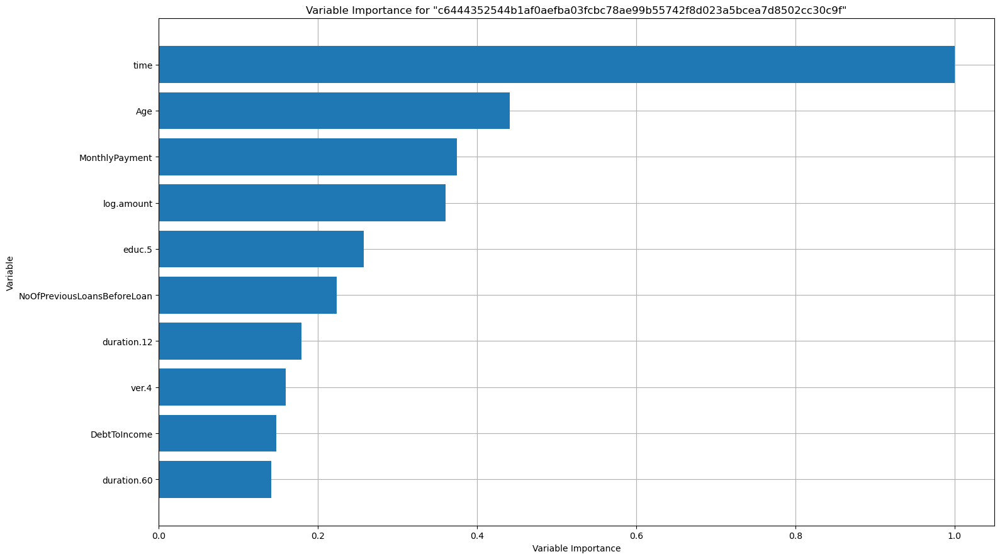

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

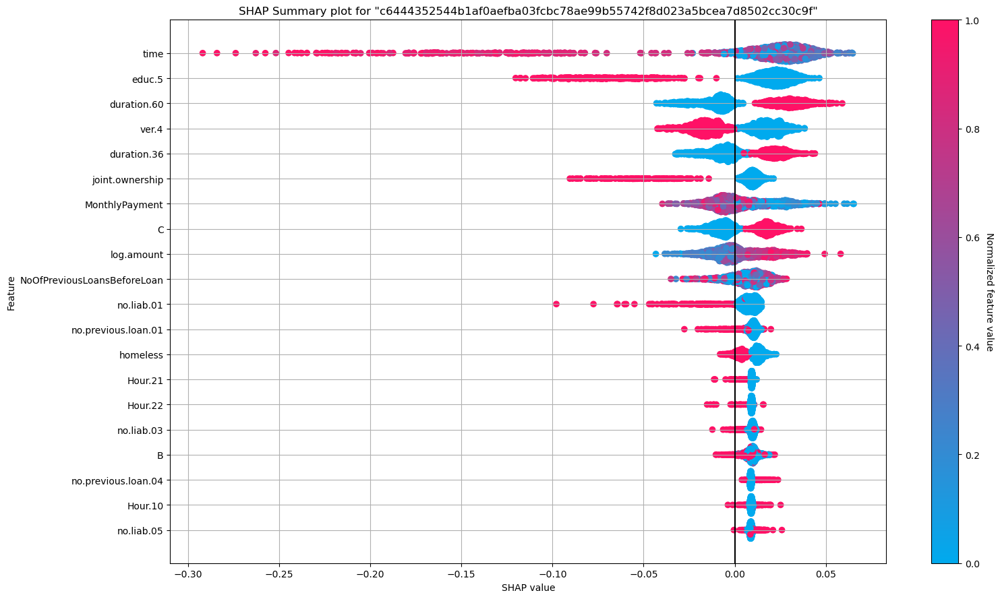

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

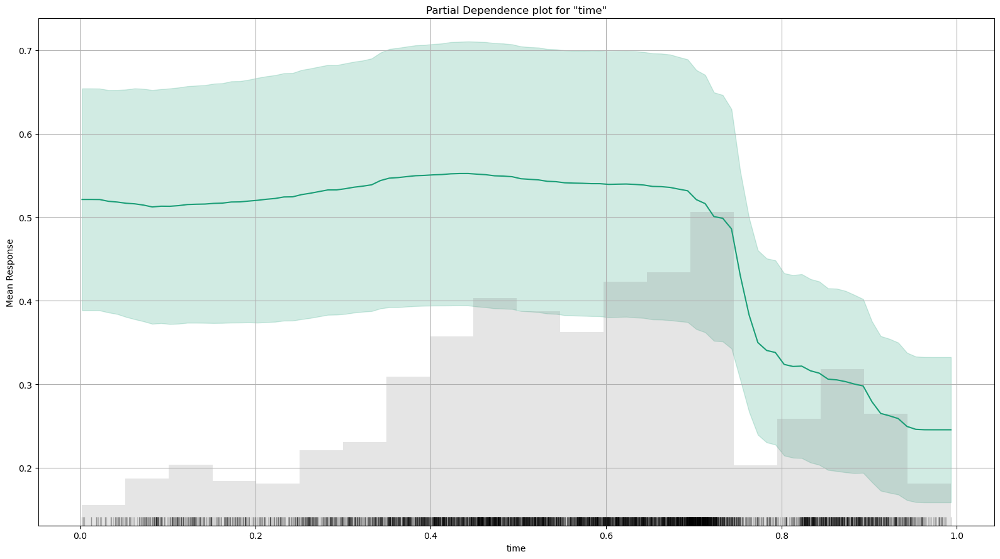

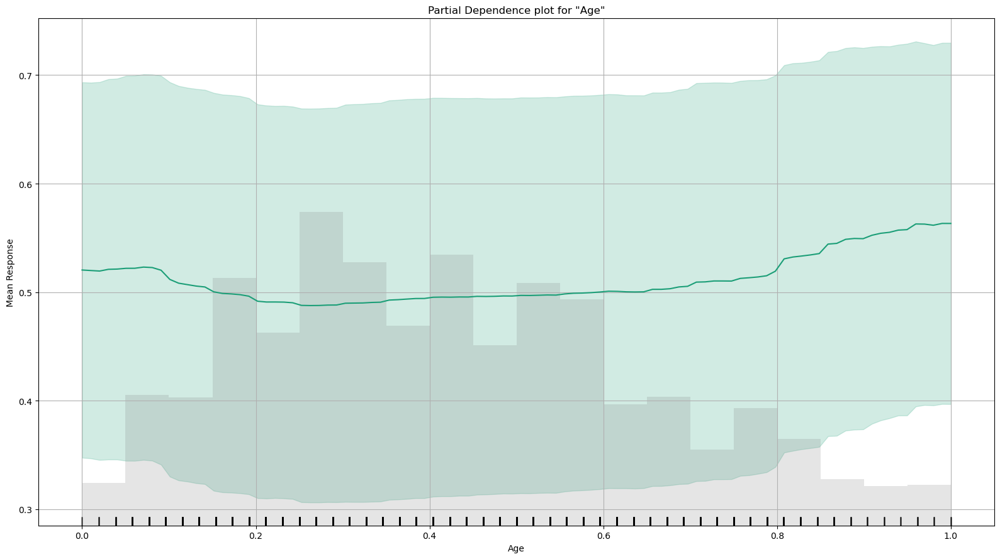

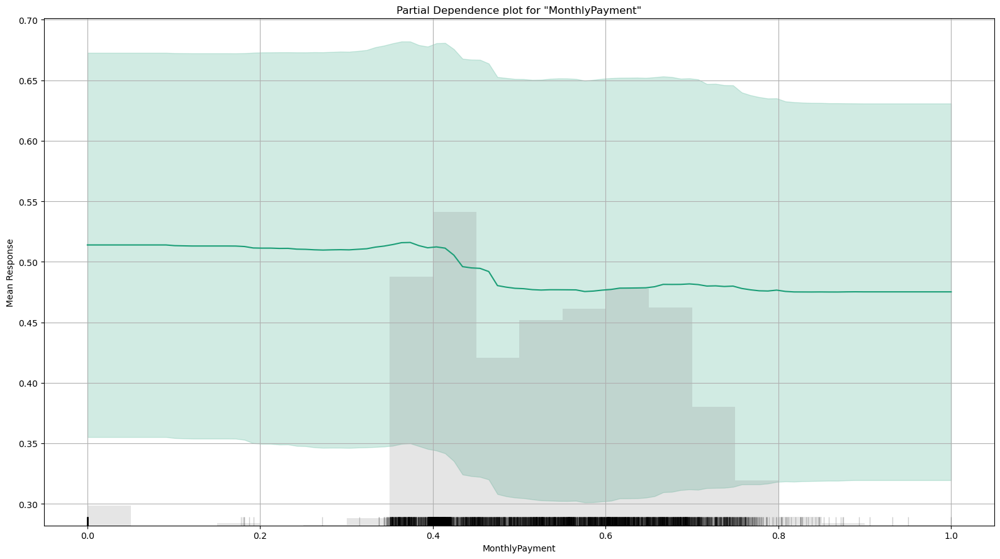

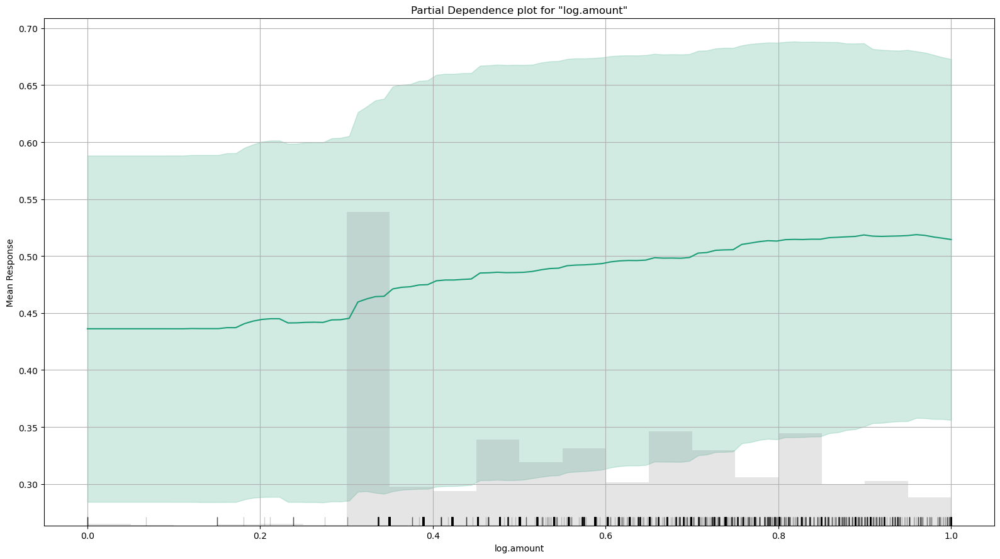

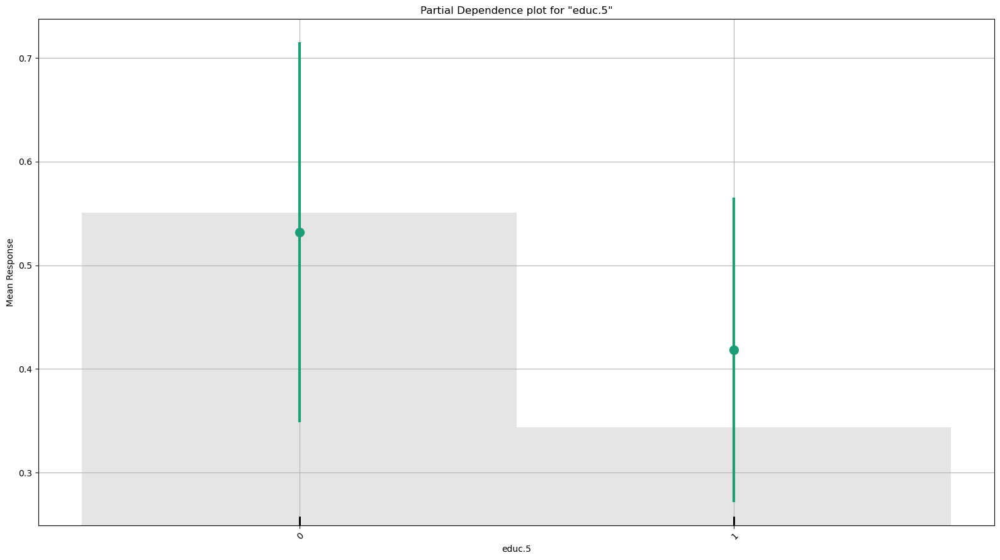

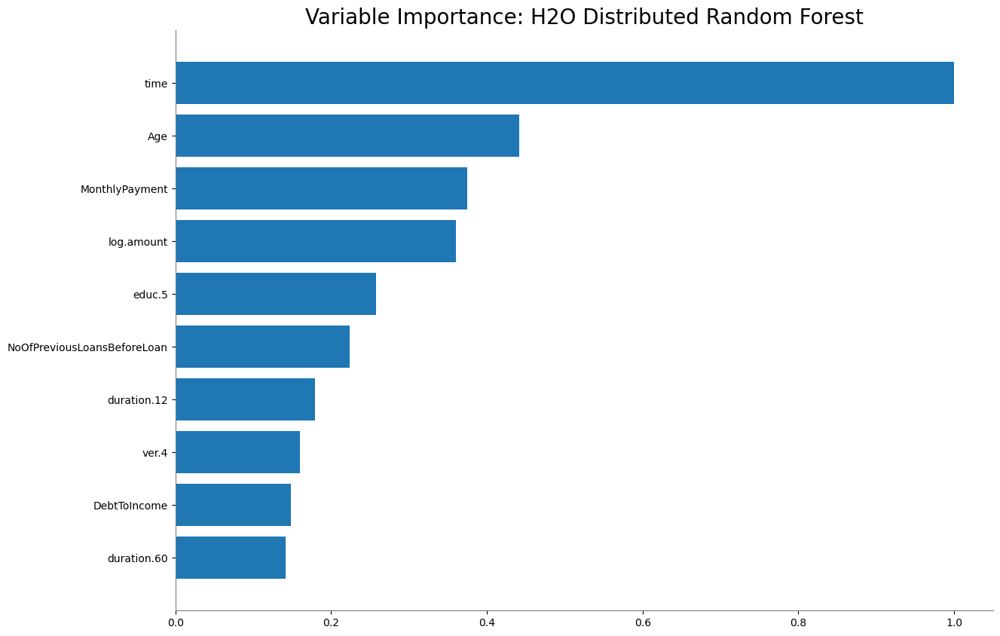

<Figure size 640x480 with 0 Axes>

In [70]:
# Group_RF_1 (TEST SET)
# Model interpretation
h2o.explain(Group_RF_1, test_data)

# Plot variable importance
Group_RF_1.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## dfe47e75ca9003debc9e7b7117e369e1b4db5f68f7427791a56362bd0acff391

,0,1,Error,Rate
0,8719.0,890.0,0.0926,(890.0/9609.0)
1,685.0,8906.0,0.0714,(685.0/9591.0)
Total,9404.0,9796.0,0.082,(1575.0/19200.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

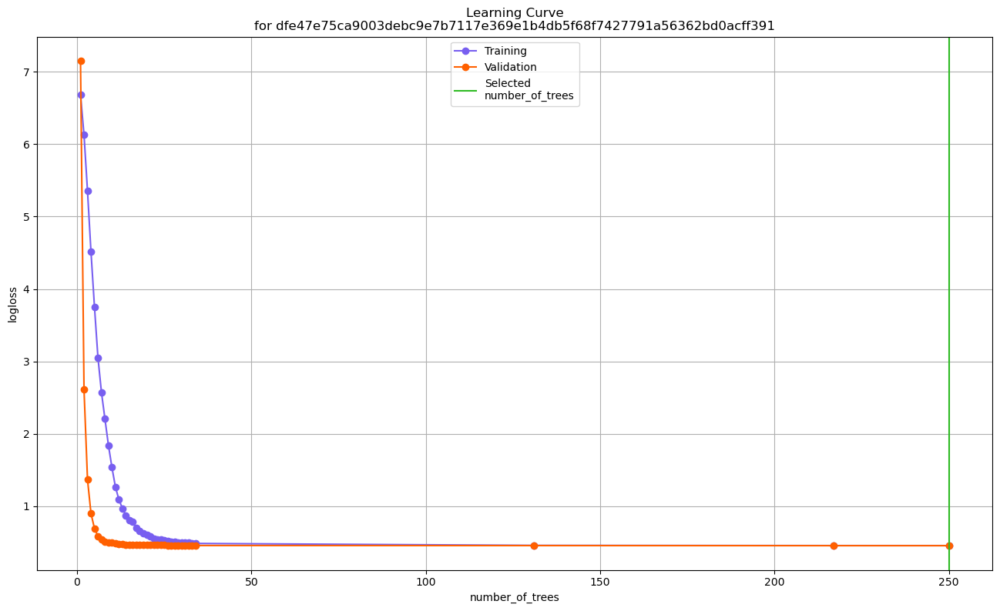

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

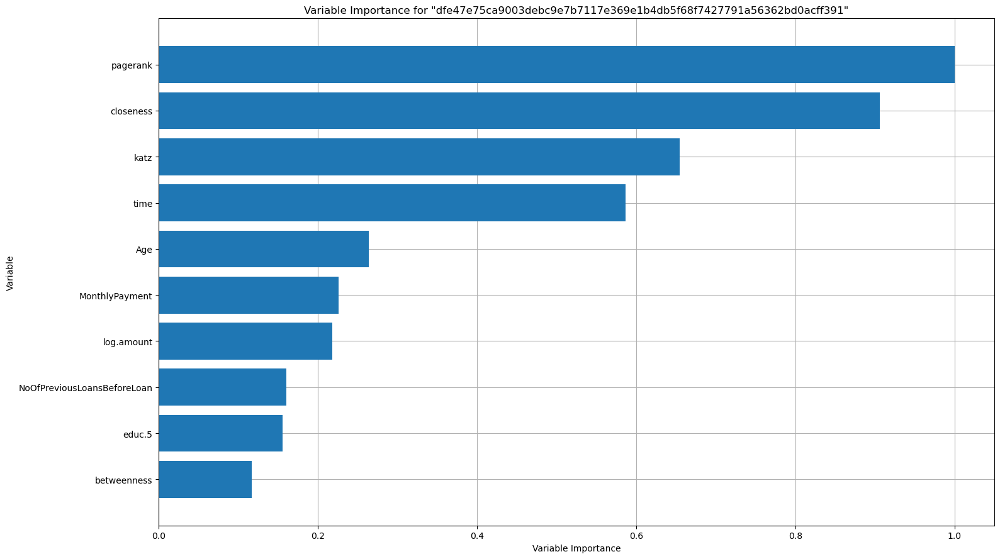

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

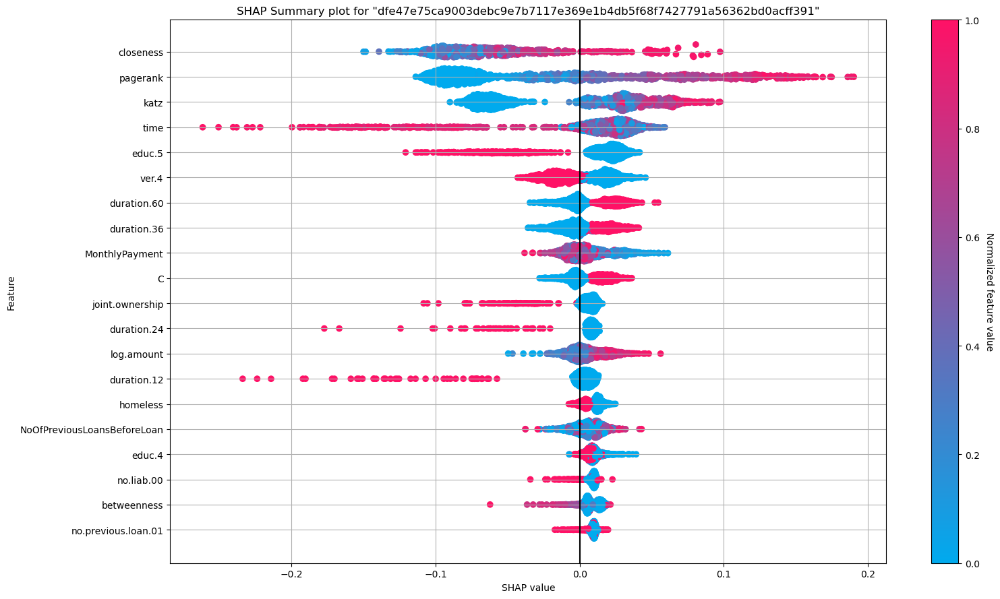

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

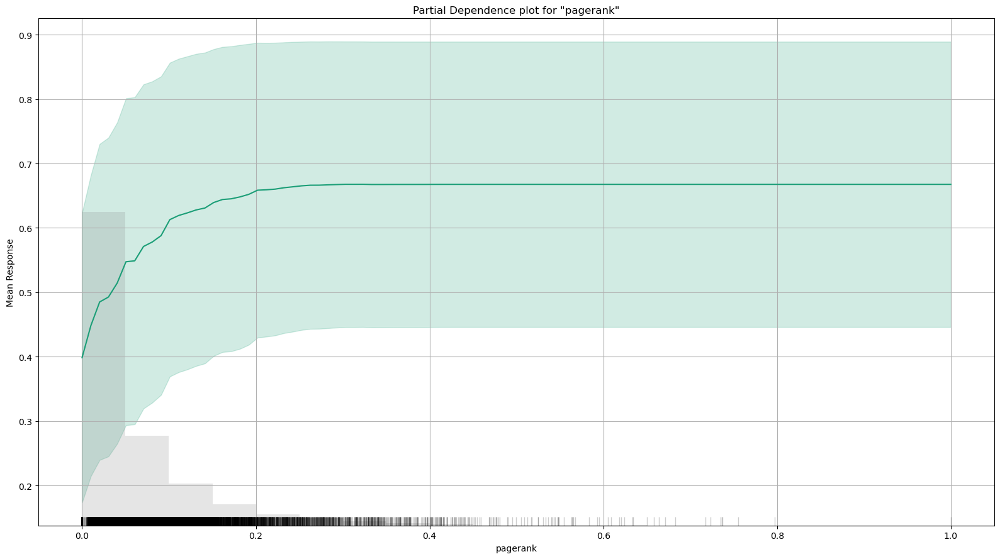

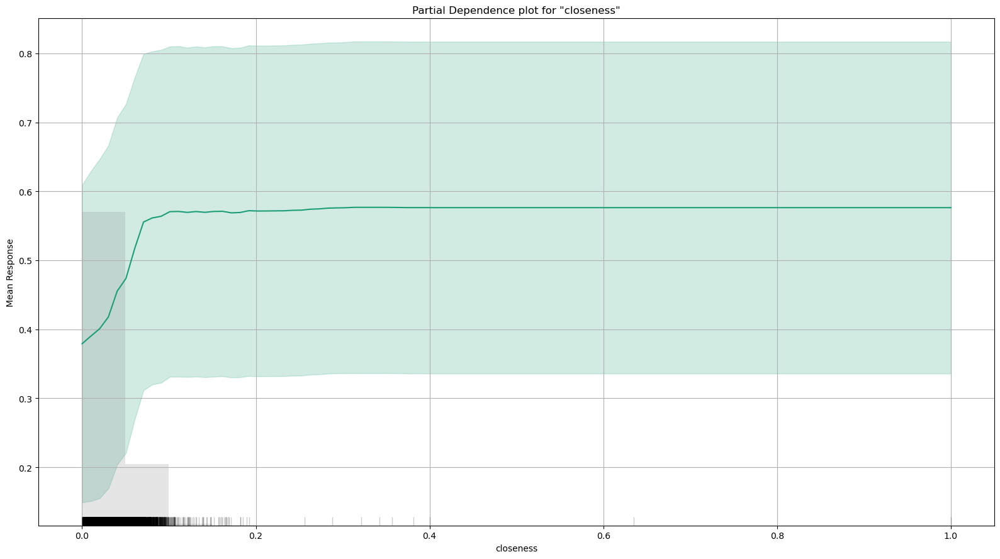

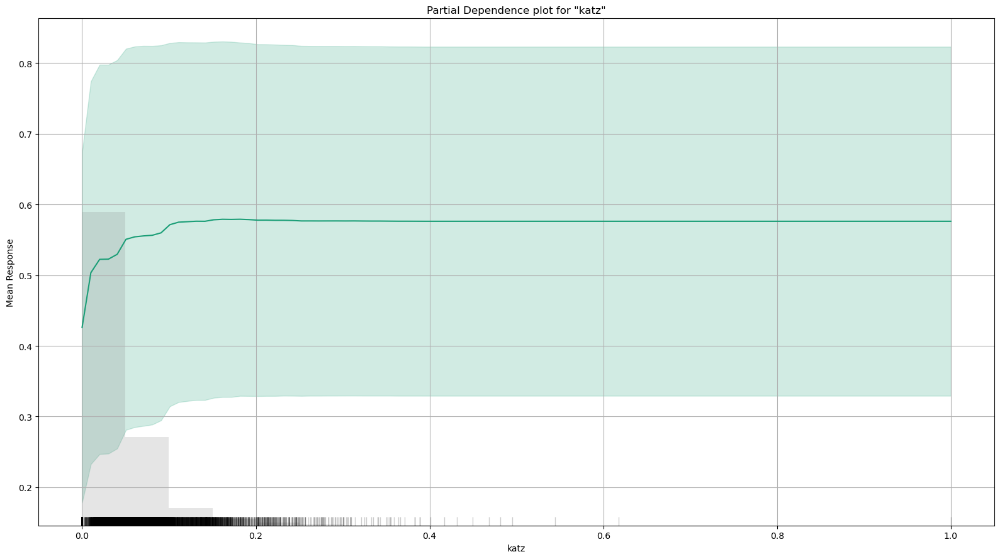

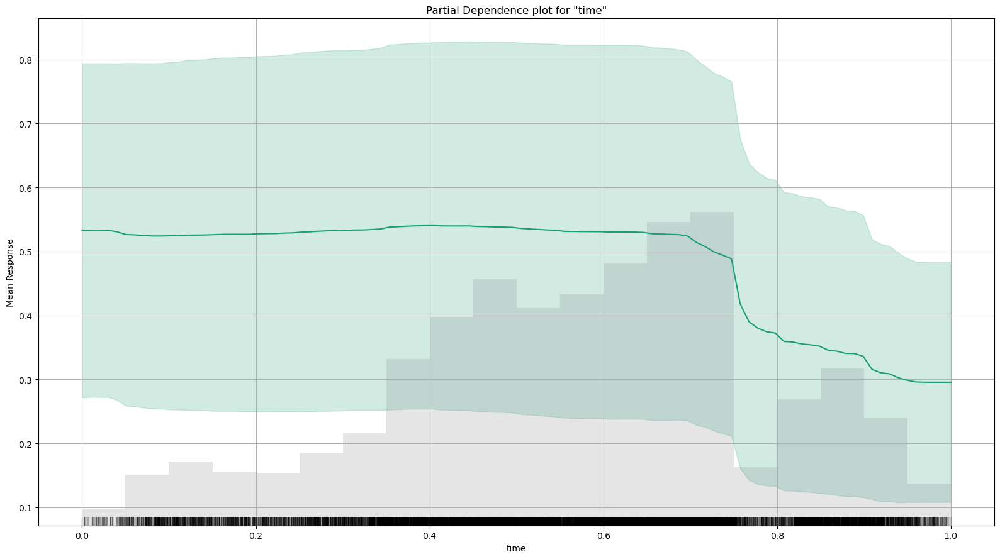

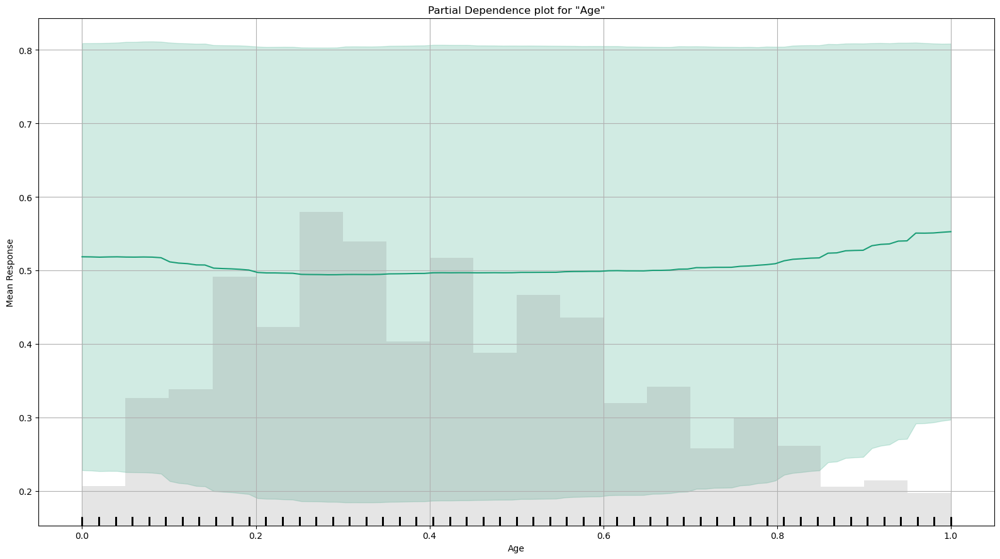

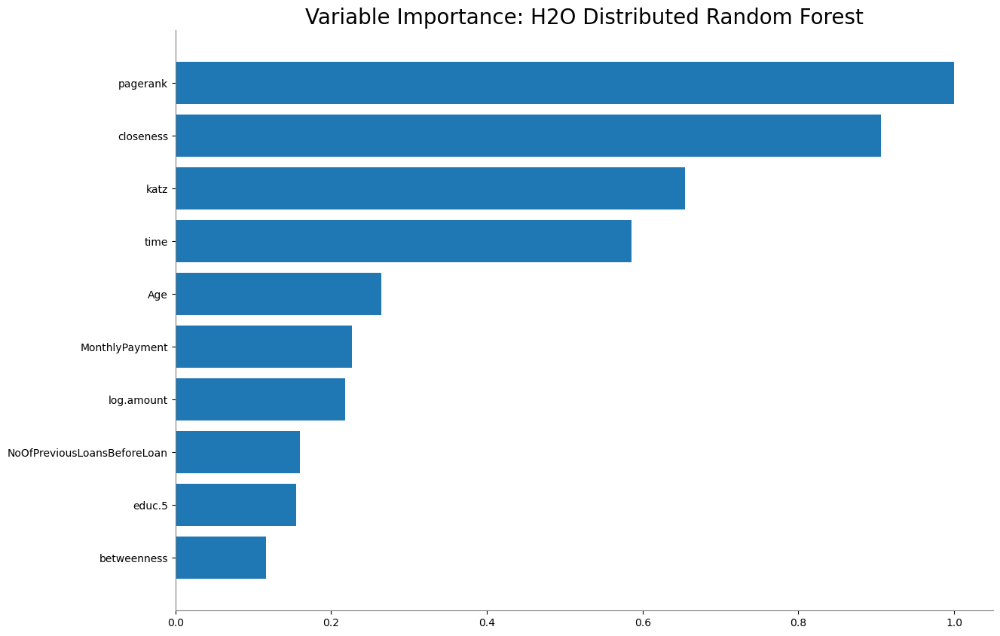

<Figure size 640x480 with 0 Axes>

In [54]:
# Group_RF_2 (training set)
# Model interpretation
h2o.explain(Group_RF_2, train_data)

# Plot variable importance
Group_RF_2.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## dfe47e75ca9003debc9e7b7117e369e1b4db5f68f7427791a56362bd0acff391

,0,1,Error,Rate
0,1802.0,589.0,0.2463,(589.0/2391.0)
1,406.0,2003.0,0.1685,(406.0/2409.0)
Total,2208.0,2592.0,0.2073,(995.0/4800.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

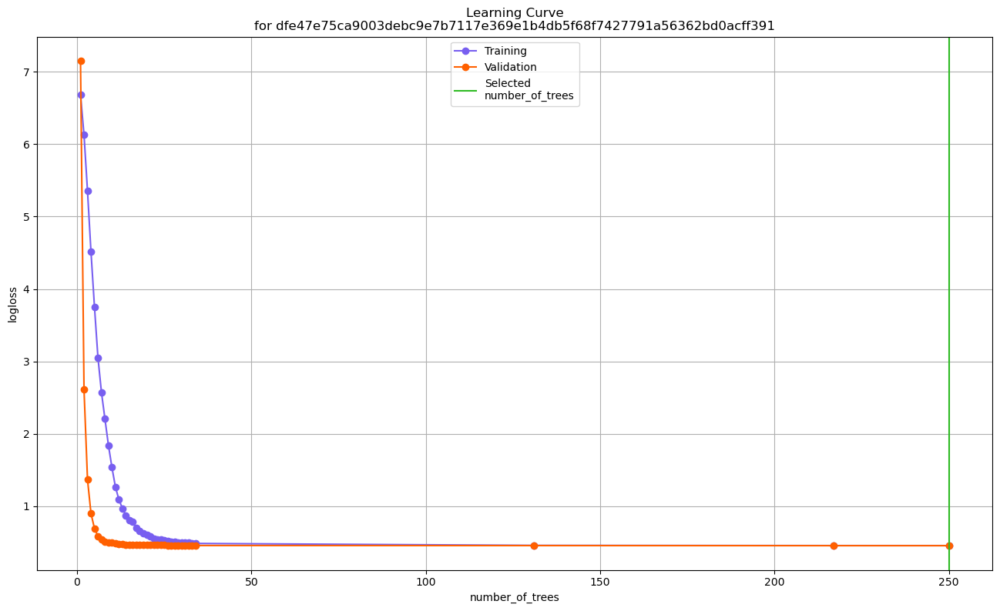

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

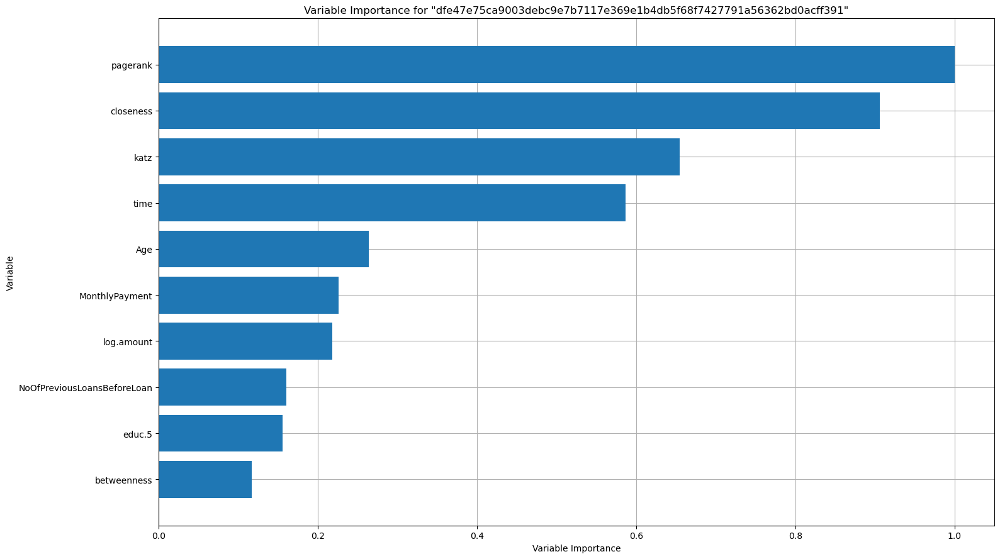

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

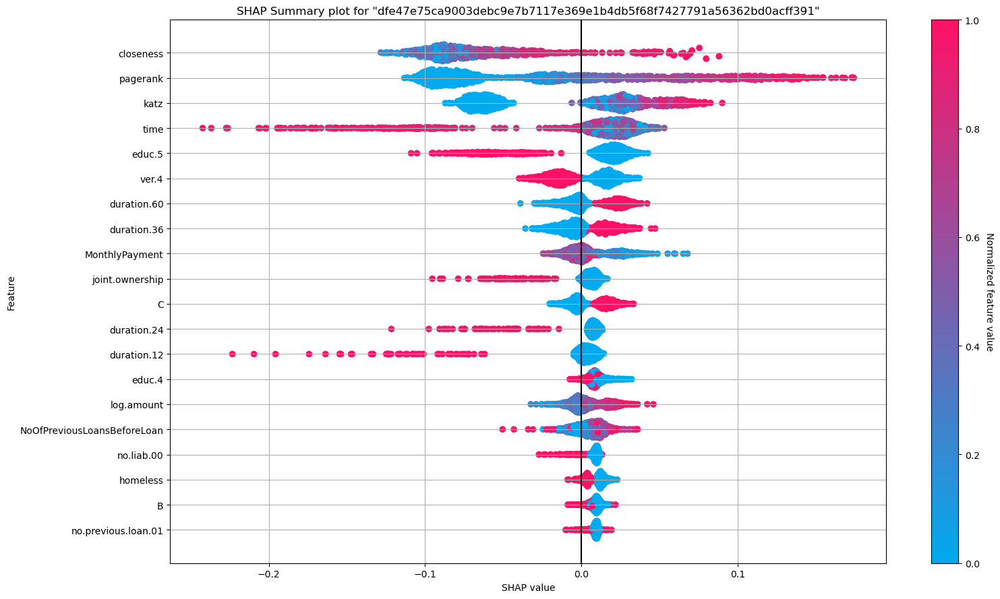

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

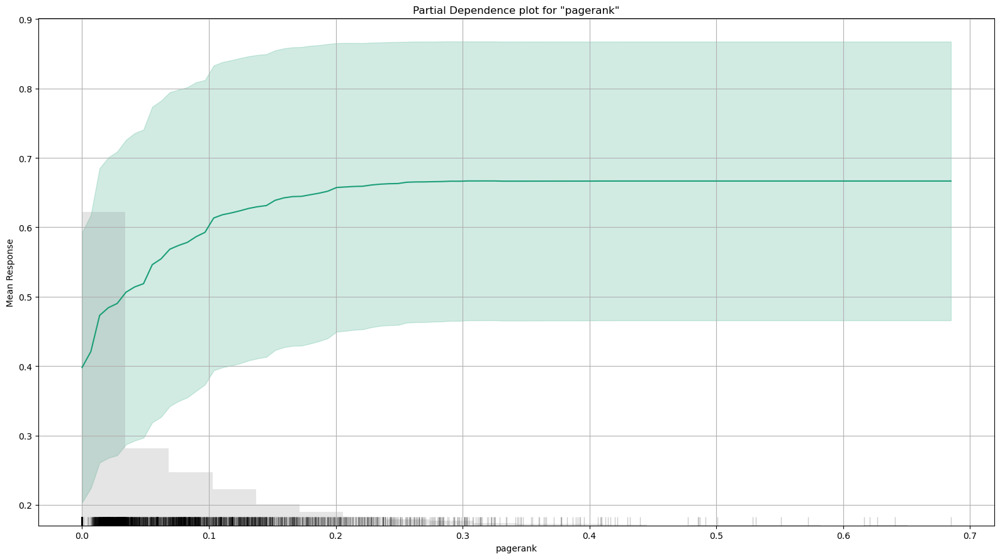

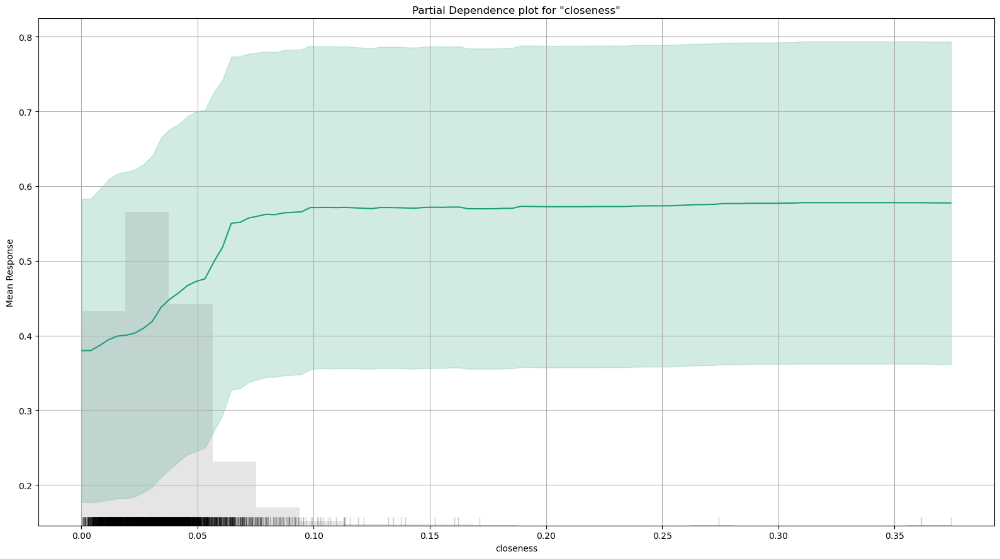

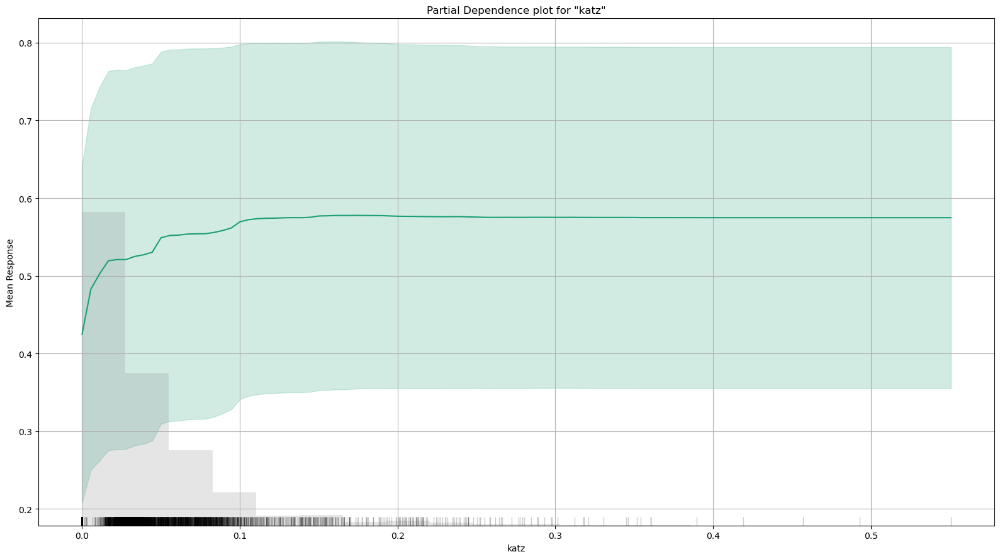

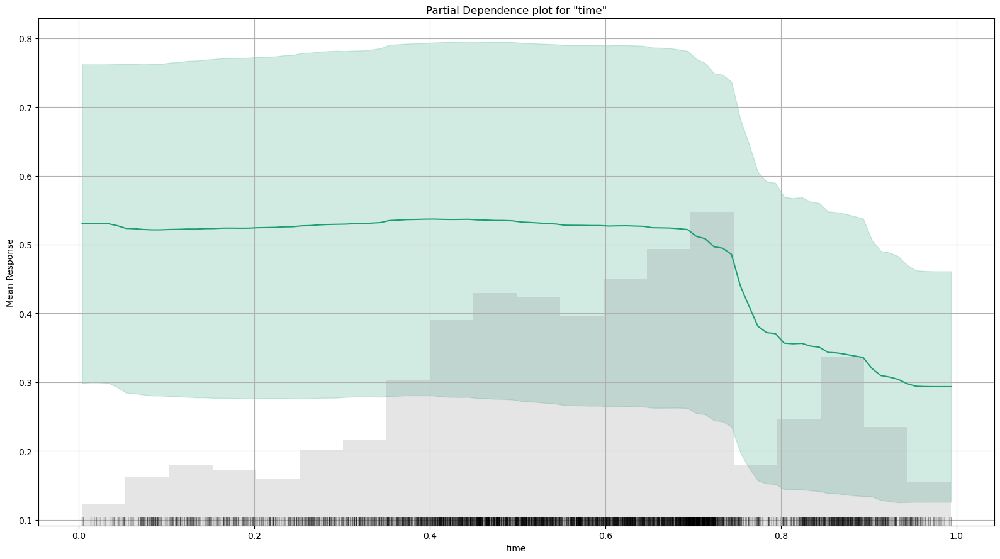

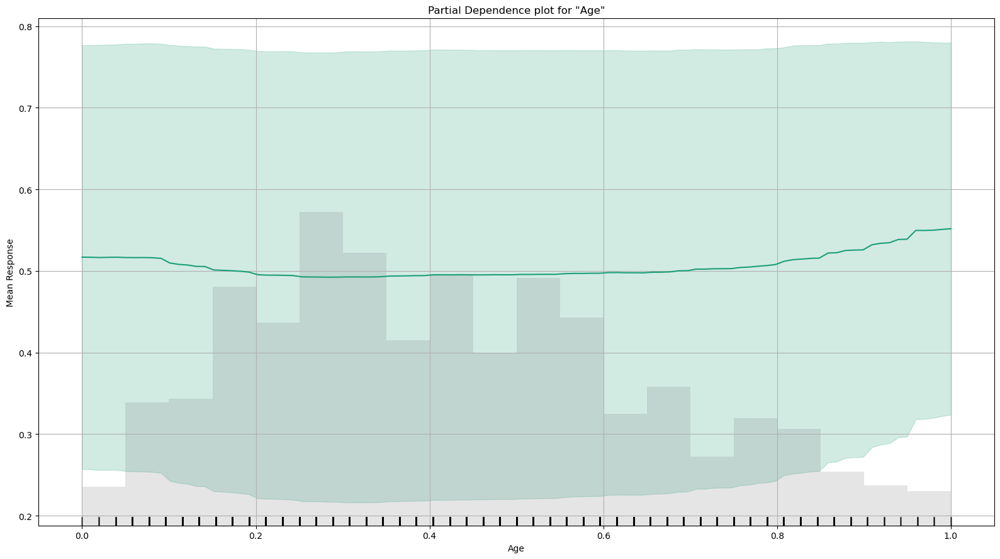

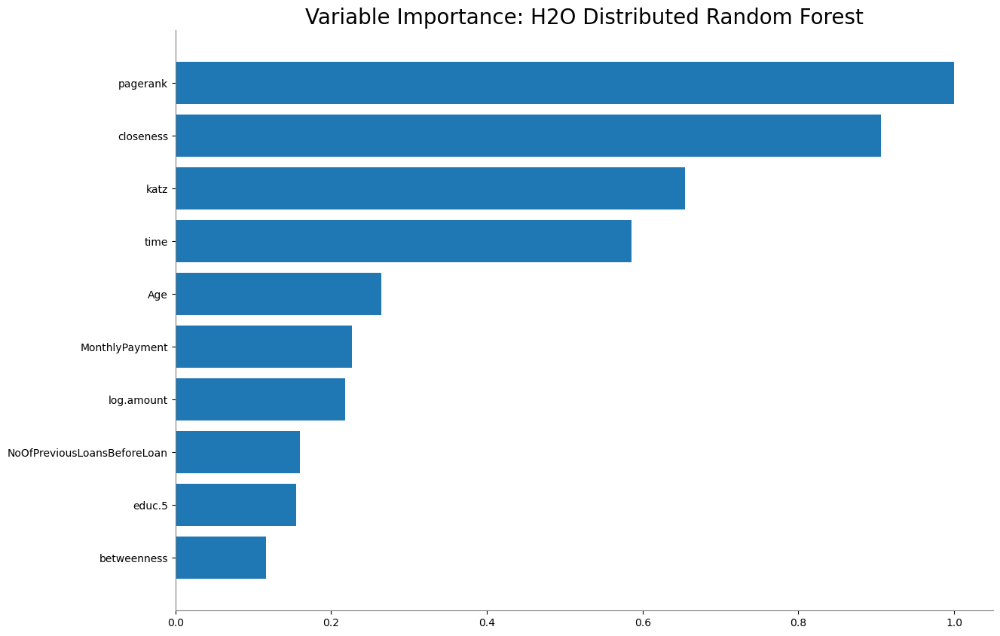

<Figure size 640x480 with 0 Axes>

In [68]:
# Group_RF_2 (TEST SET)
# Model interpretation
h2o.explain(Group_RF_2, test_data)

# Plot variable importance
Group_RF_2.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## e84d4f5cb53ebcfed23636eccd0f9e30d4358cae7b67e29422c813d5de3d636a

,0,1,Error,Rate
0,8264.0,1345.0,0.14,(1345.0/9609.0)
1,1006.0,8585.0,0.1049,(1006.0/9591.0)
Total,9270.0,9930.0,0.1224,(2351.0/19200.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

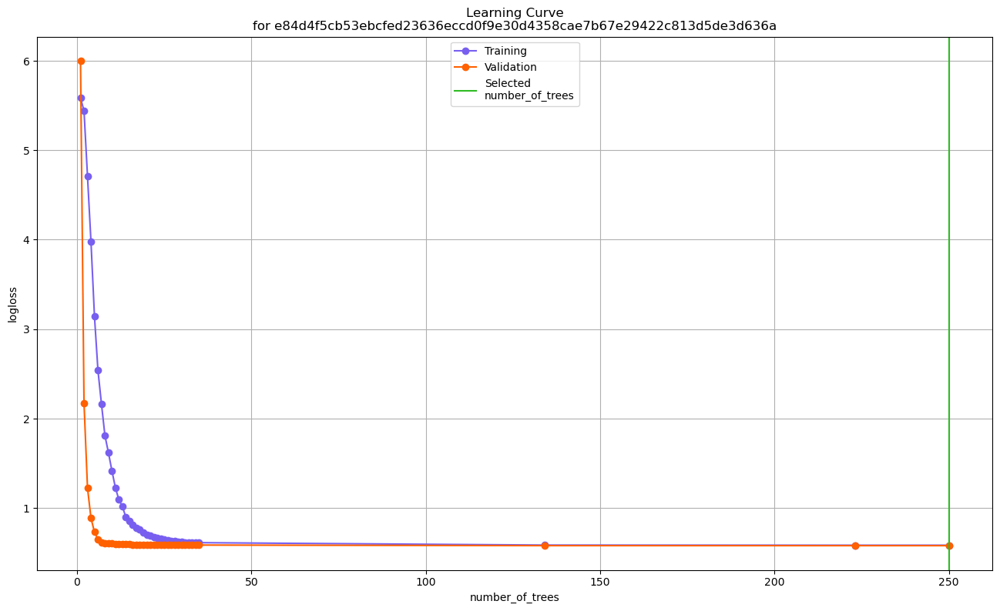

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

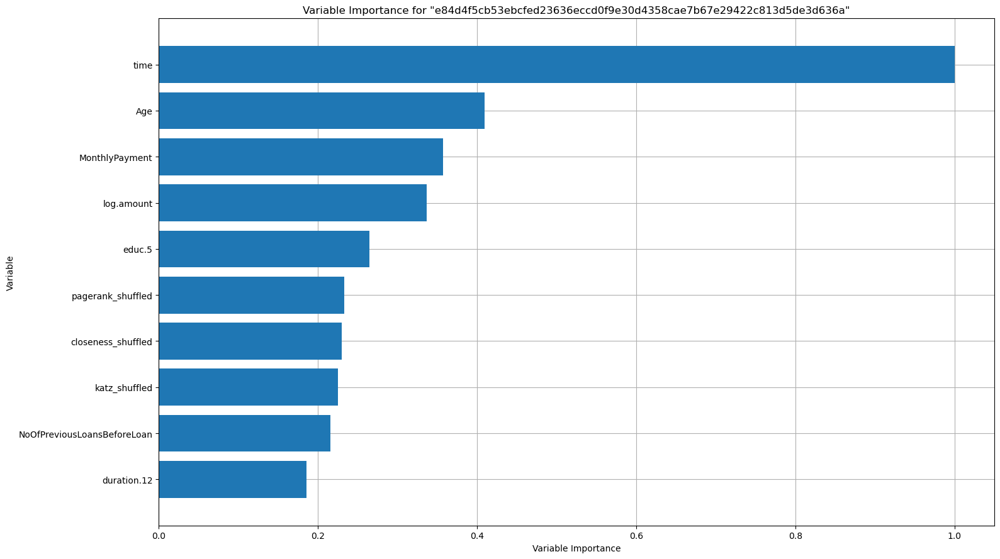

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

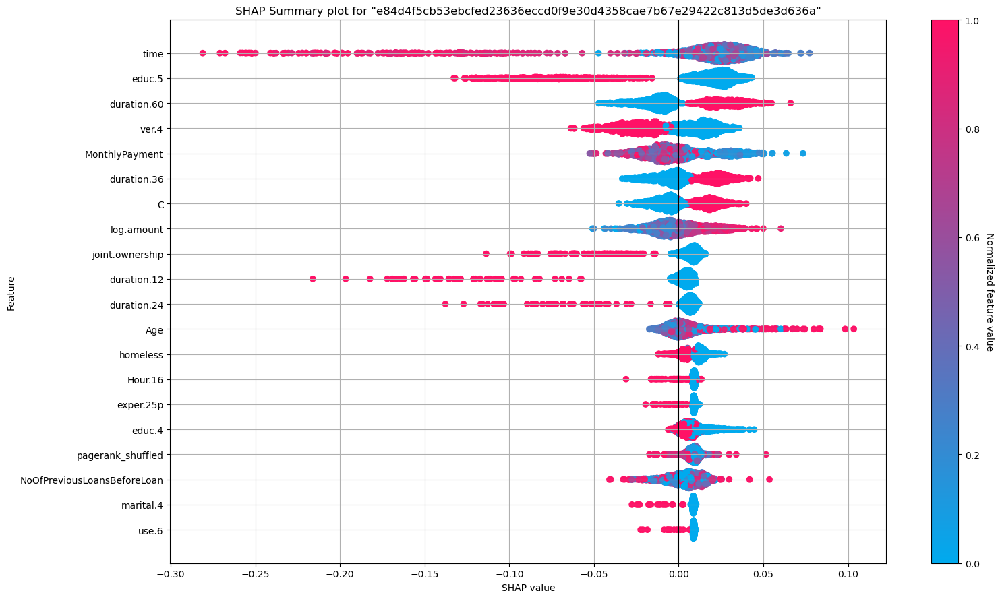

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

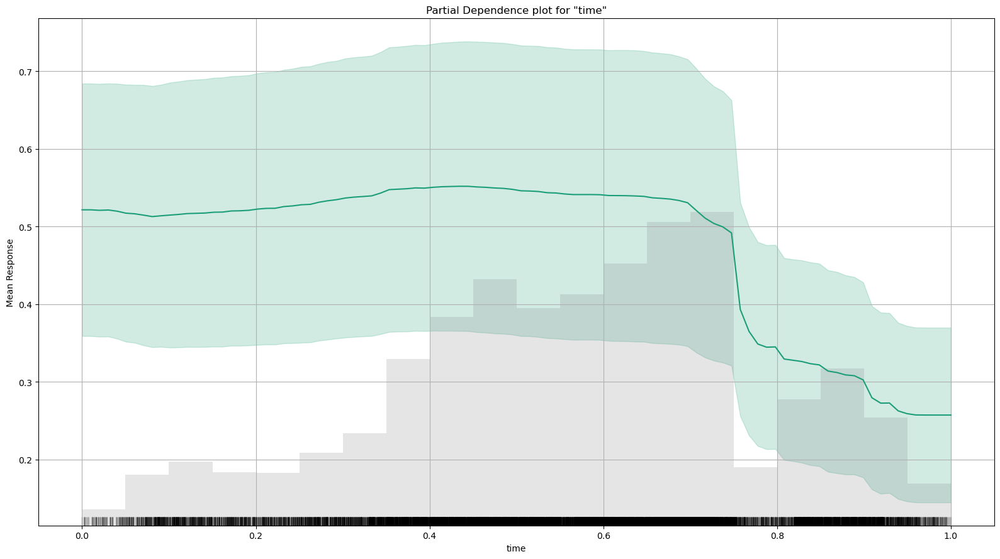

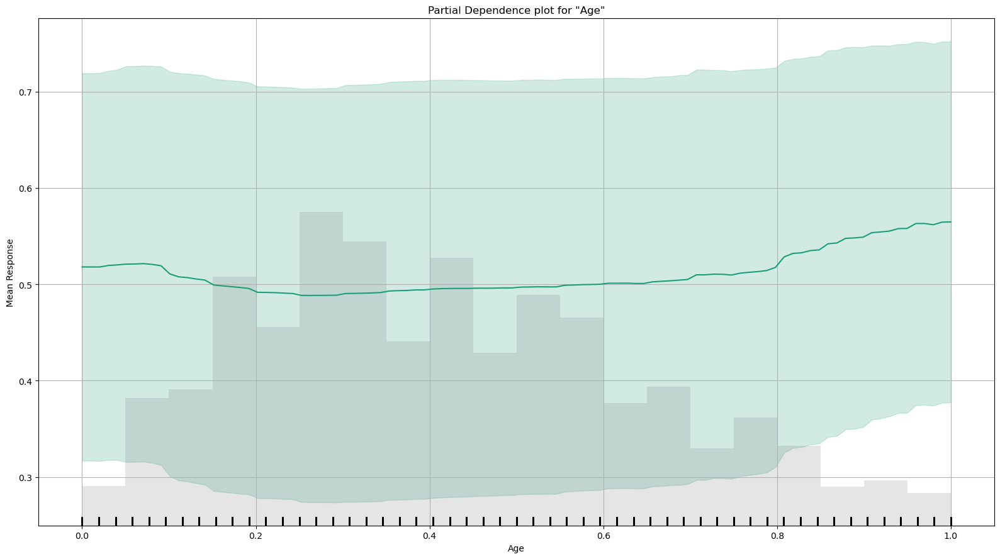

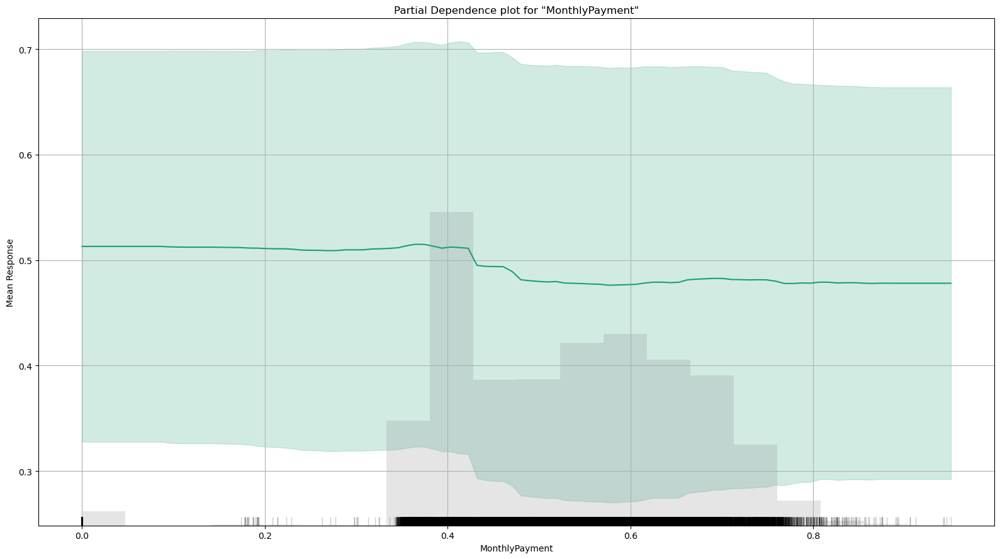

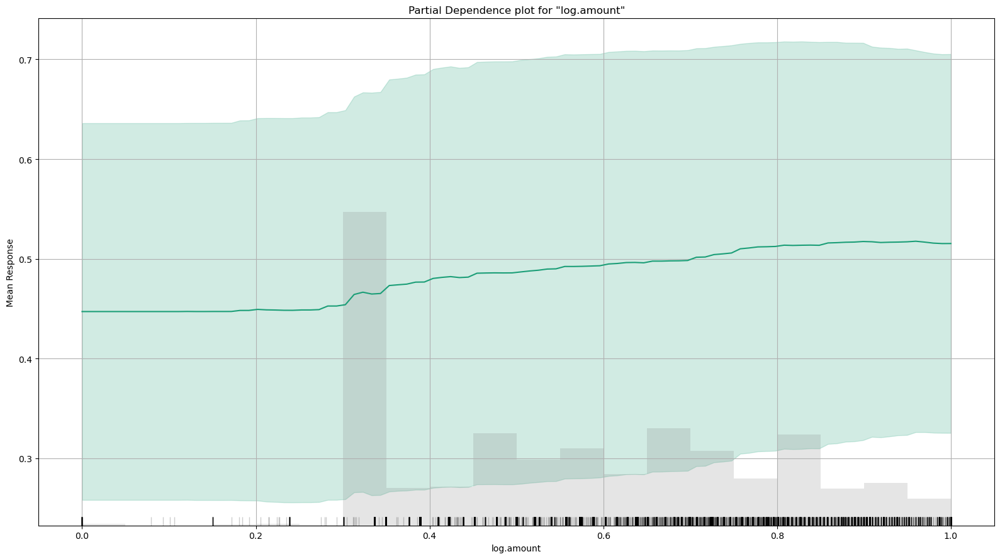

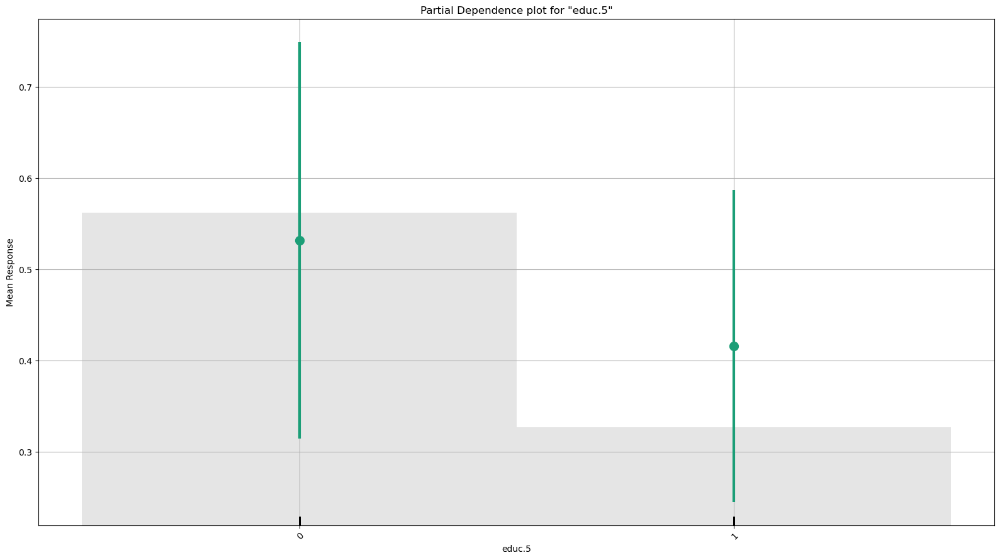

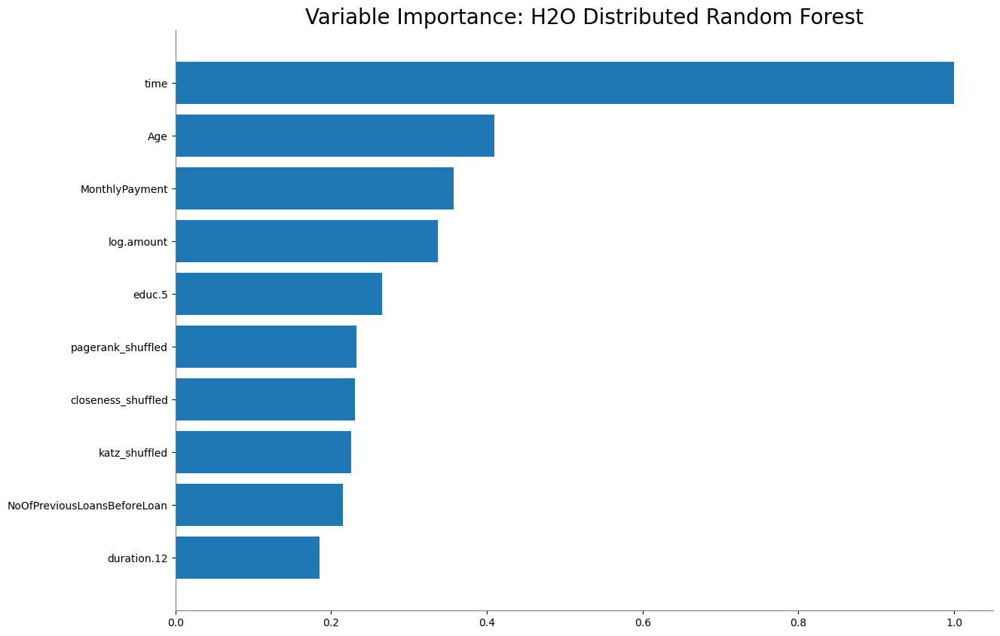

<Figure size 640x480 with 0 Axes>

In [55]:
# Group_RF_3 (training set)
# Model interpretation
h2o.explain(Group_RF_3, train_data)

# Plot variable importance
Group_RF_3.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## e84d4f5cb53ebcfed23636eccd0f9e30d4358cae7b67e29422c813d5de3d636a

,0,1,Error,Rate
0,984.0,1407.0,0.5885,(1407.0/2391.0)
1,199.0,2210.0,0.0826,(199.0/2409.0)
Total,1183.0,3617.0,0.3346,(1606.0/4800.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

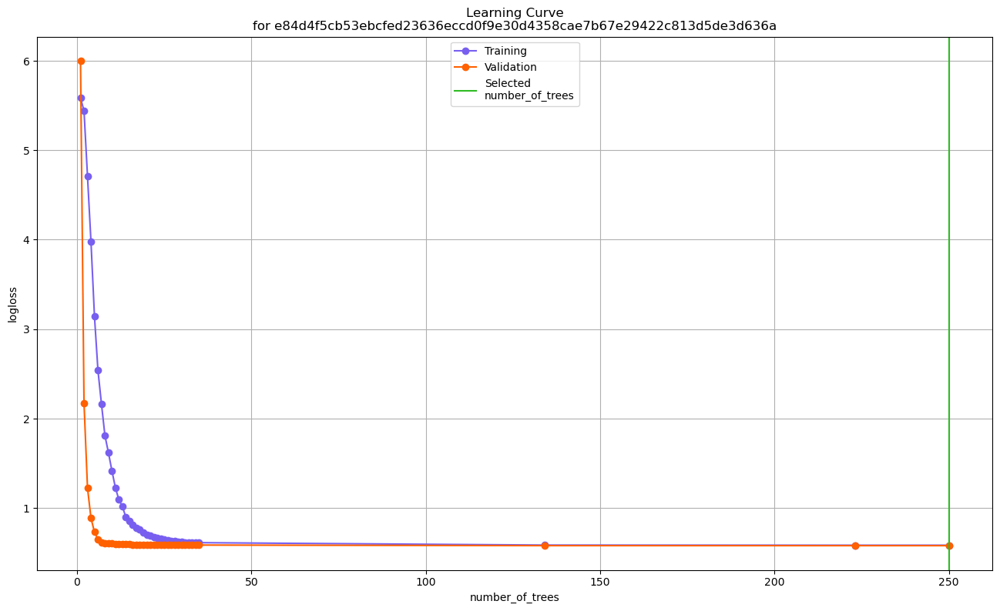

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

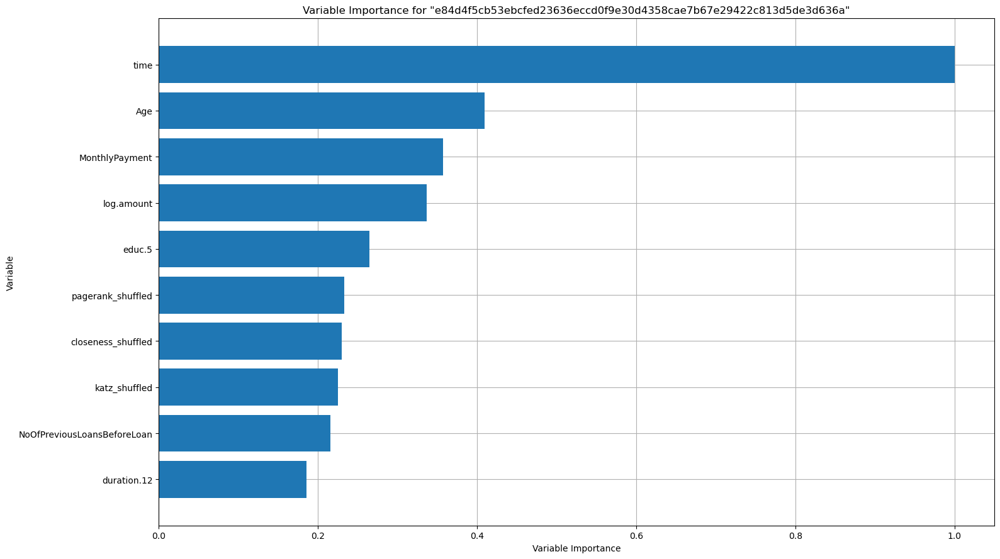

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

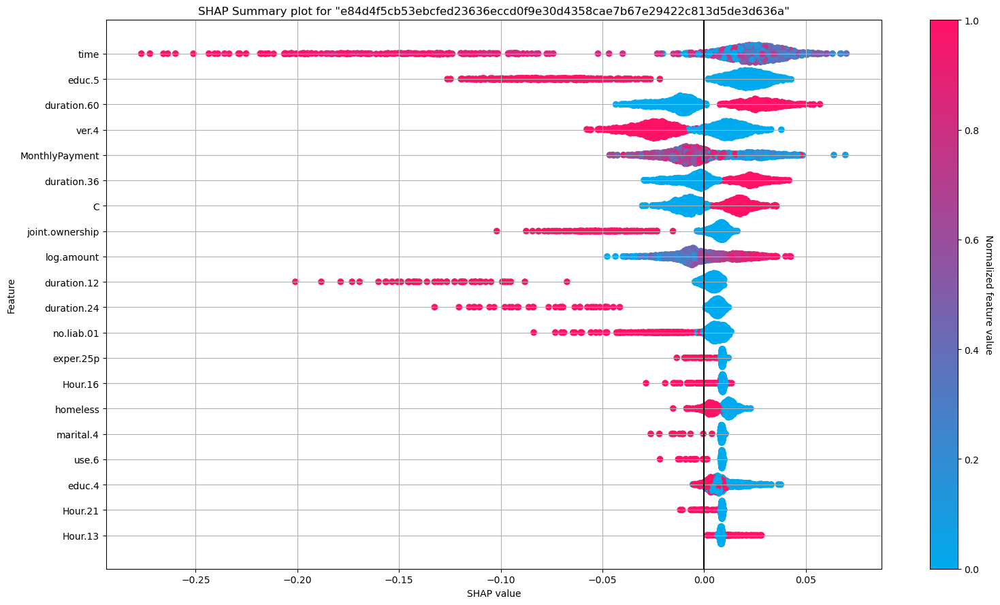

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

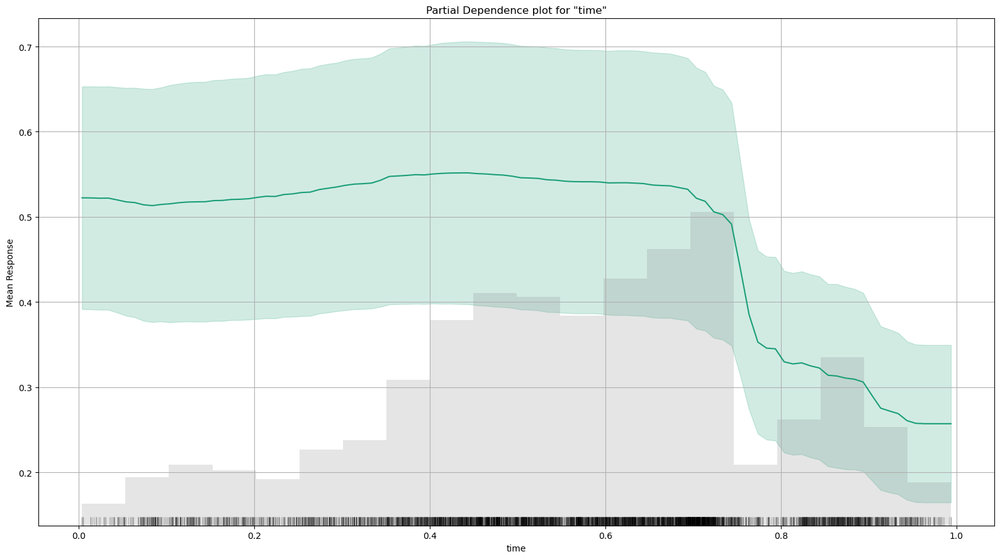

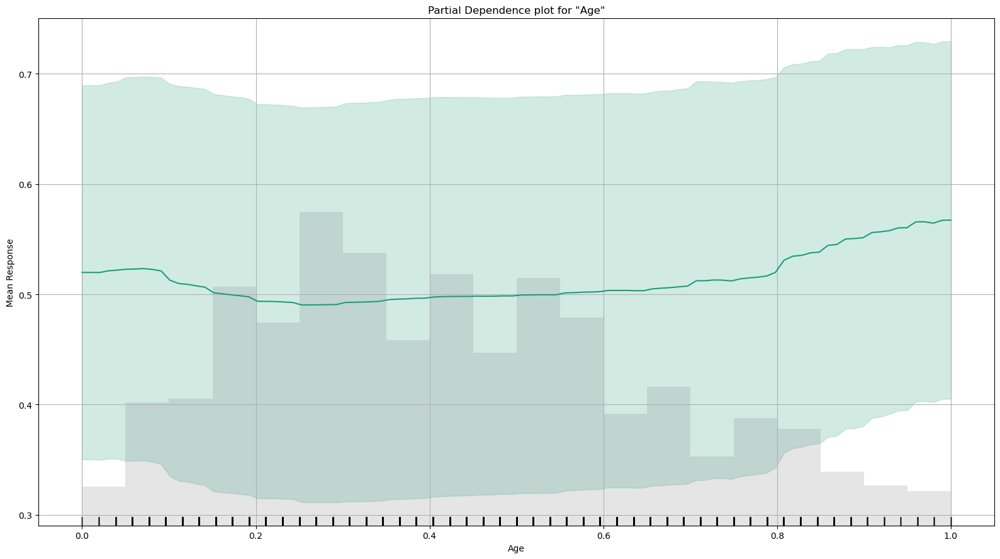

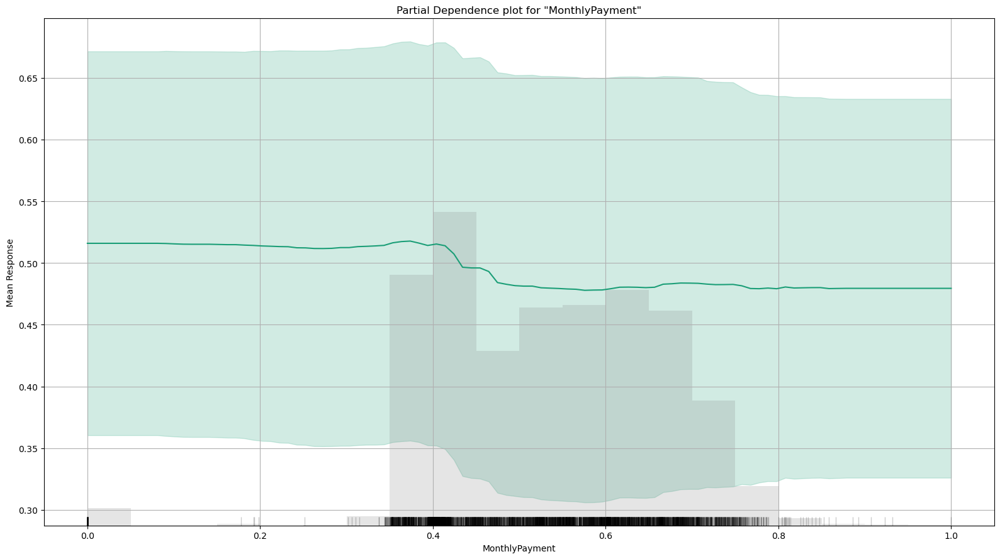

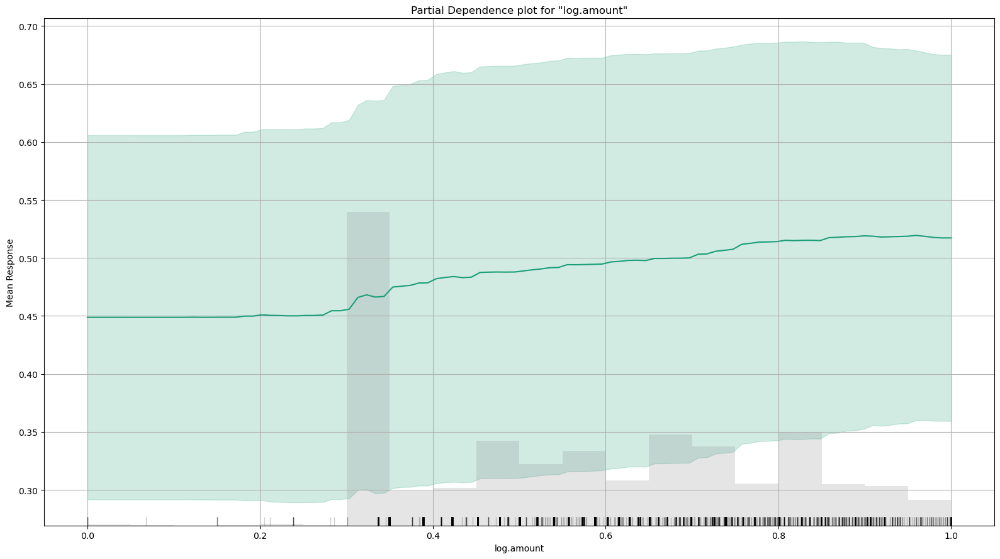

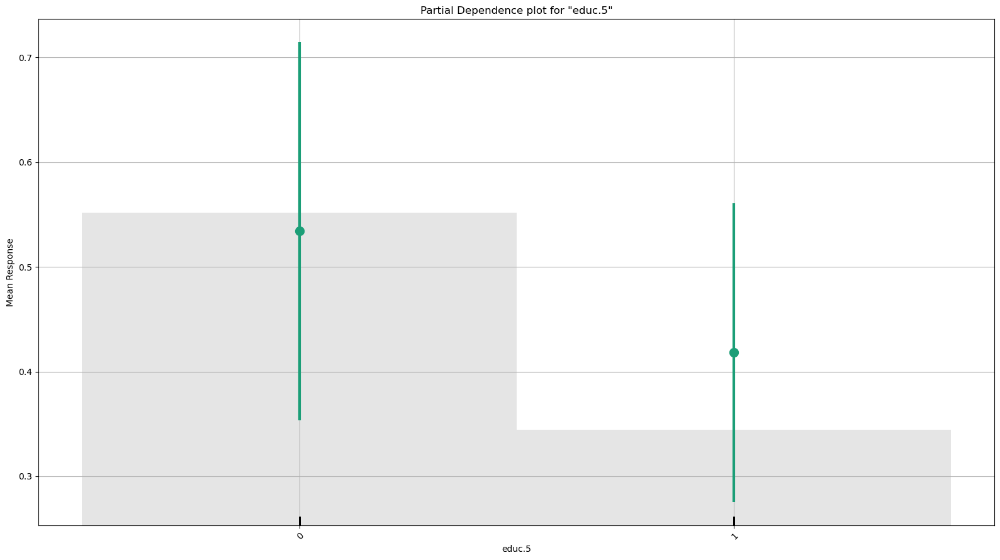

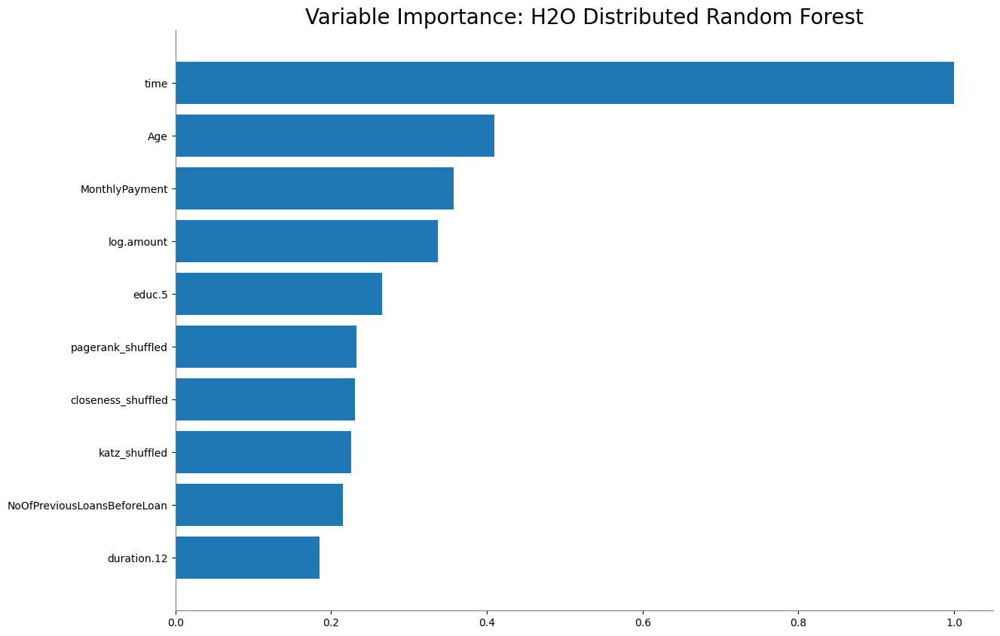

<Figure size 640x480 with 0 Axes>

In [69]:
# Group_RF_3 (TEST SET)
# Model interpretation
h2o.explain(Group_RF_3, test_data)

# Plot variable importance
Group_RF_3.varimp_plot()

### DL Models  

In [72]:
# load best model from group of DL models based on output_info in /Desktop/P2P-Bondora/output_info
# best models are chosen according to AUC criterion.
# Models are different according to the exclusion list and feature selection (detailed in output_info)

Group_DL_1 = get_model_by_hash(model_directory, 'a65c6ff2f137d6997df5b6ddfdd910a389df2546b3ae177f948dade300eac696')

Group_DL_2 = get_model_by_hash(model_directory, '4e959e99ff80da34c178443a69d4fe8ee591e2970f13b8ca5b7b092c15d848ce')

Group_DL_3 = get_model_by_hash(model_directory, 'ac854704fb2412964c28597f9b747d0b2cc90721ff3ff3408f34b0aa52121e6c')

Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/a65c6ff2f137d6997df5b6ddfdd910a389df2546b3ae177f948dade300eac696/a65c6ff2f137d6997df5b6ddfdd910a389df2546b3ae177f948dade300eac696
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/4e959e99ff80da34c178443a69d4fe8ee591e2970f13b8ca5b7b092c15d848ce/4e959e99ff80da34c178443a69d4fe8ee591e2970f13b8ca5b7b092c15d848ce
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/ac854704fb2412964c28597f9b747d0b2cc90721ff3ff3408f34b0aa52121e6c/ac854704fb2412964c28597f9b747d0b2cc90721ff3ff3408f34b0aa52121e6c


In [58]:
# Explain the different DL models

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## a65c6ff2f137d6997df5b6ddfdd910a389df2546b3ae177f948dade300eac696

,0,1,Error,Rate
0,4528.0,5081.0,0.5288,(5081.0/9609.0)
1,1117.0,8474.0,0.1165,(1117.0/9591.0)
Total,5645.0,13555.0,0.3228,(6198.0/19200.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

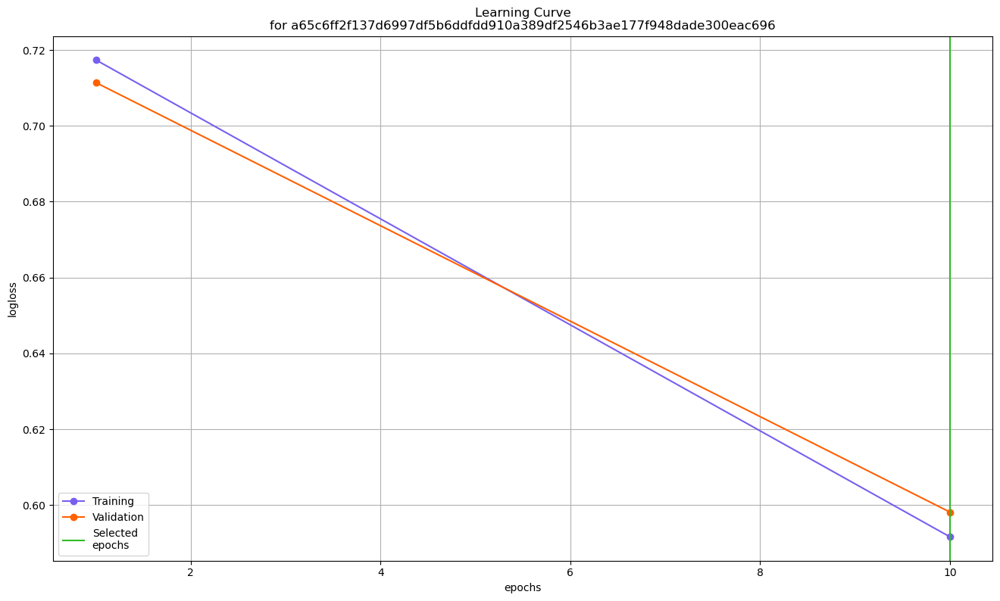

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

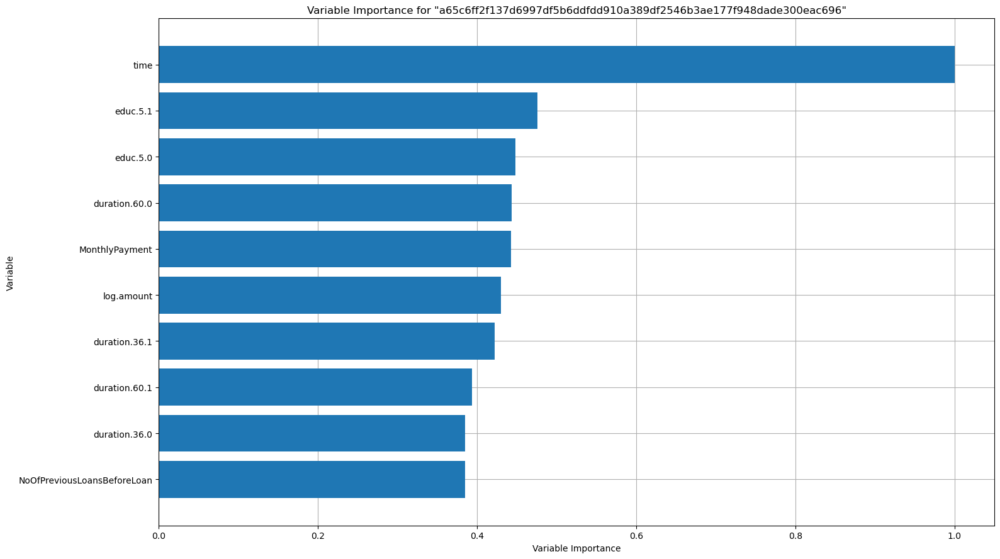

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

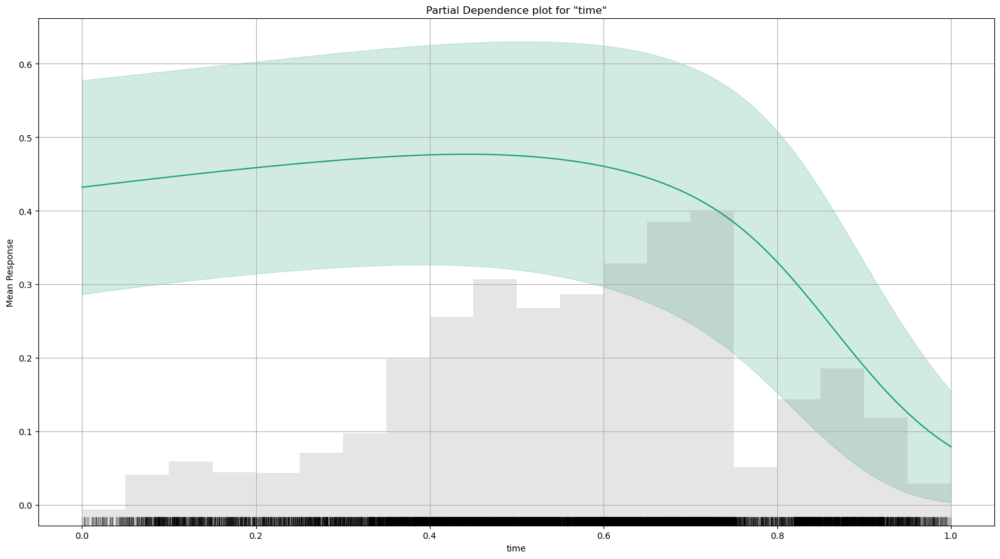

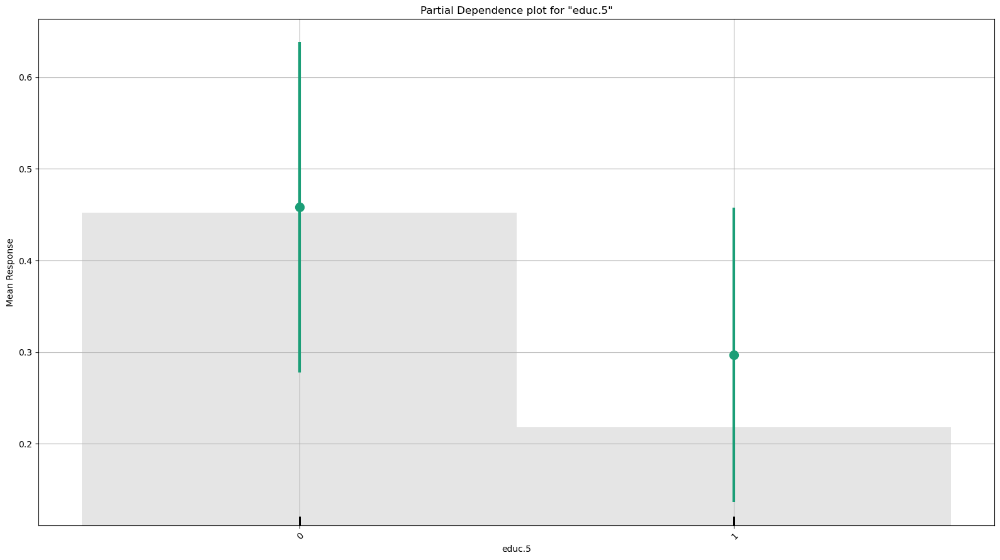

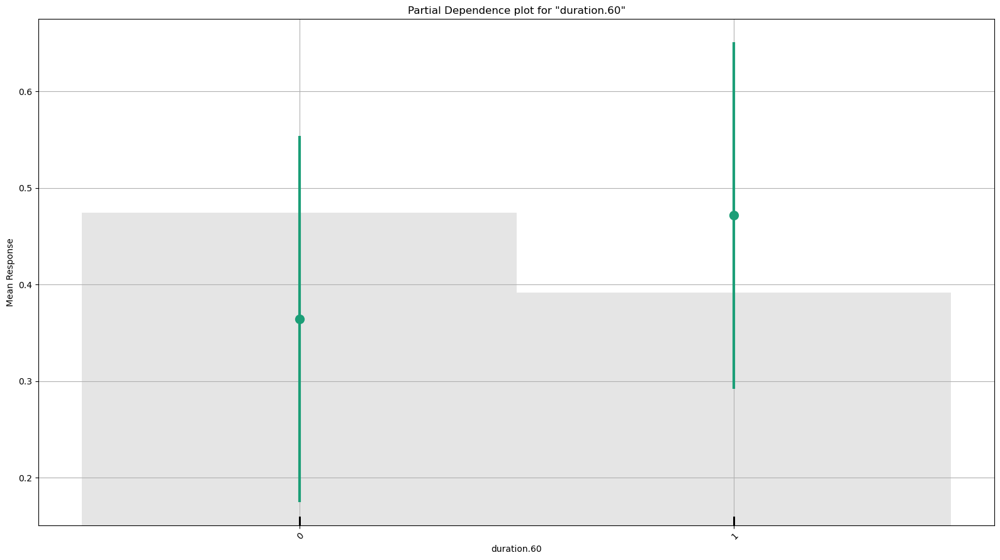

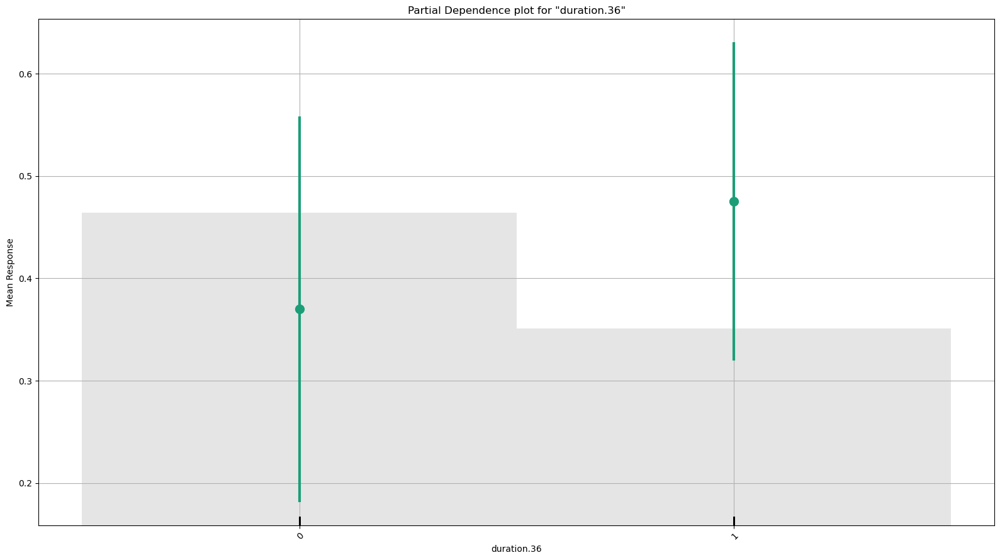

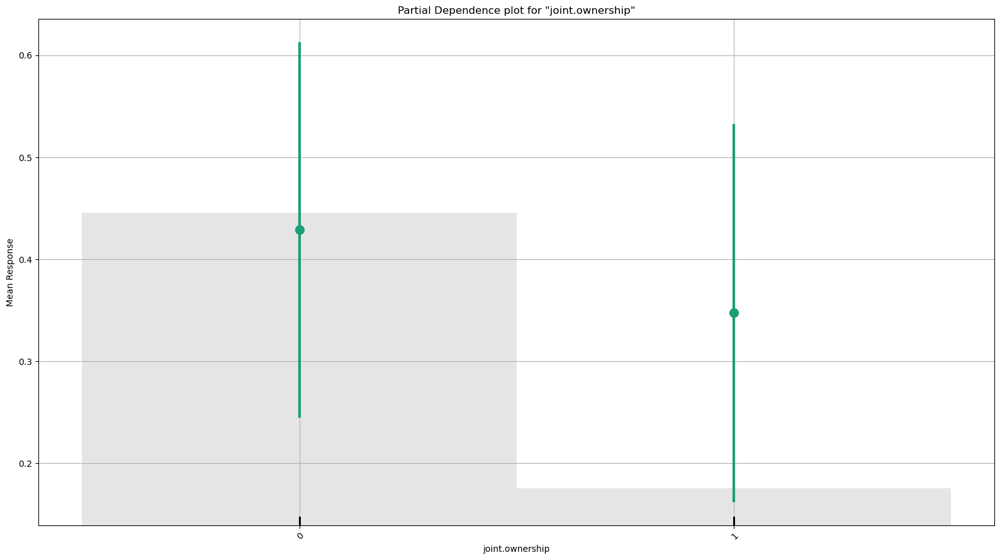

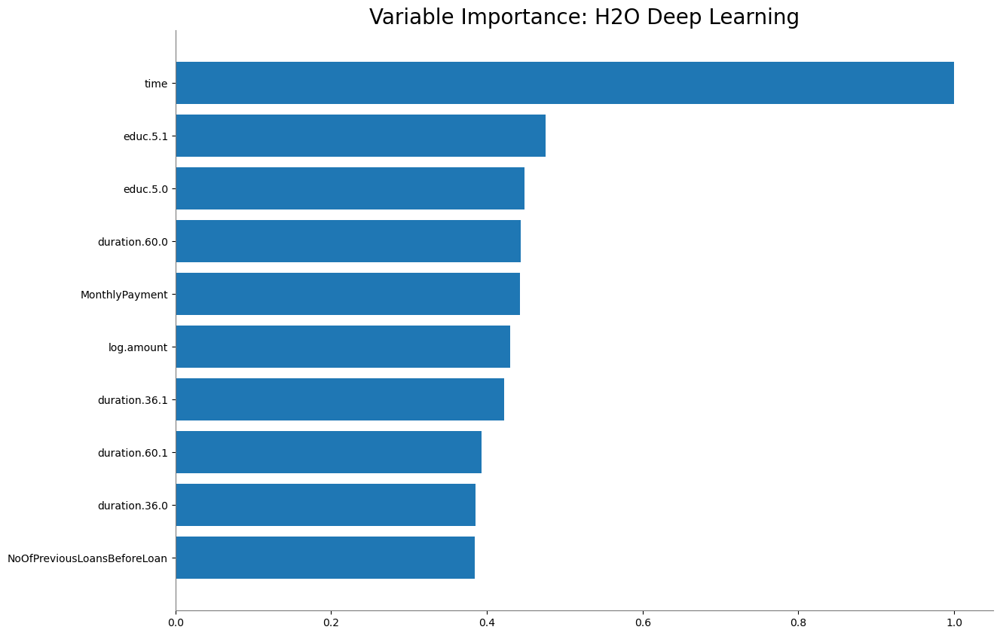

<Figure size 640x480 with 0 Axes>

In [59]:
# Group_DL_1 (training set)
# Model interpretation
h2o.explain(Group_DL_1, train_data)

# Plot variable importance
Group_DL_1.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## a65c6ff2f137d6997df5b6ddfdd910a389df2546b3ae177f948dade300eac696

,0,1,Error,Rate
0,914.0,1477.0,0.6177,(1477.0/2391.0)
1,189.0,2220.0,0.0785,(189.0/2409.0)
Total,1103.0,3697.0,0.3471,(1666.0/4800.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

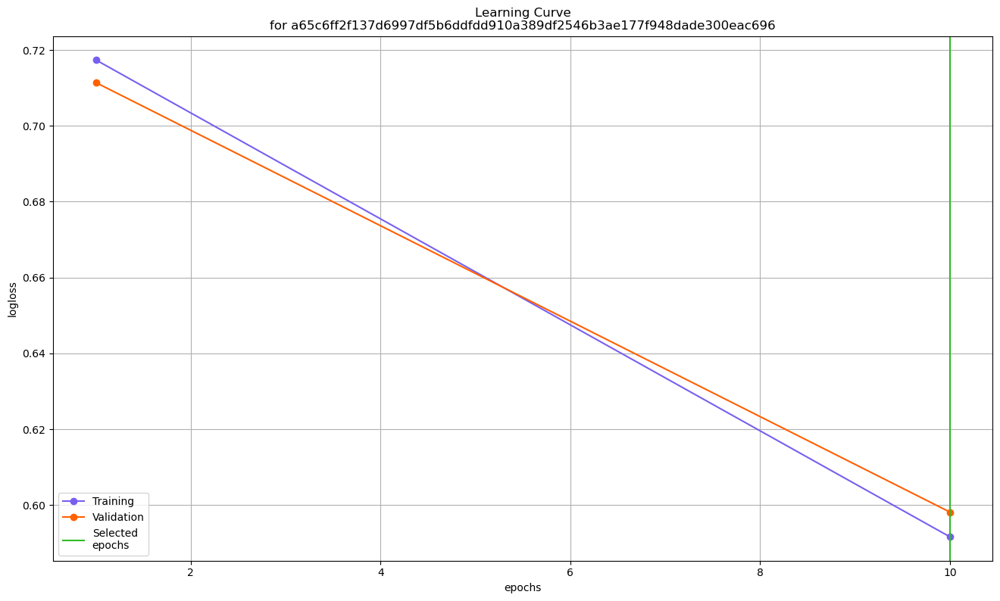

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

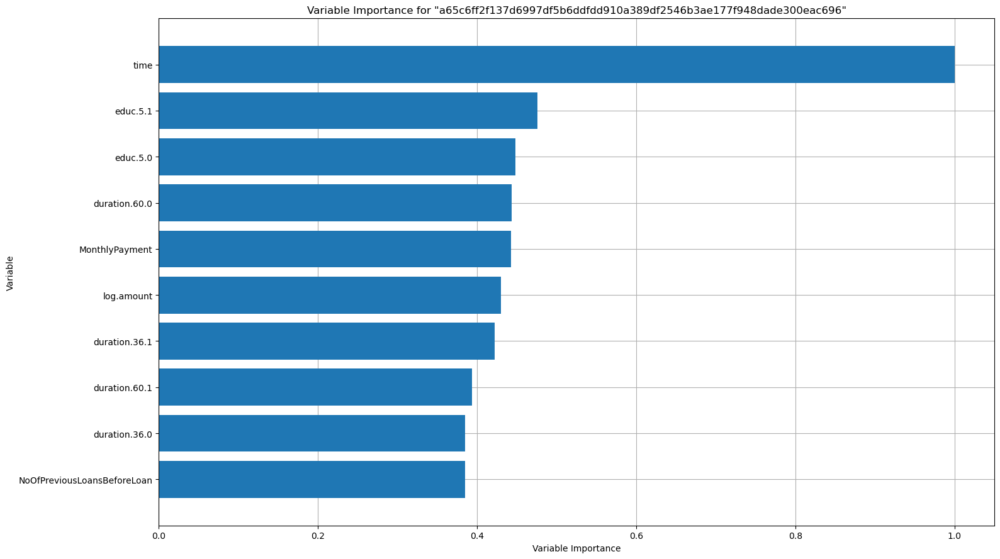

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

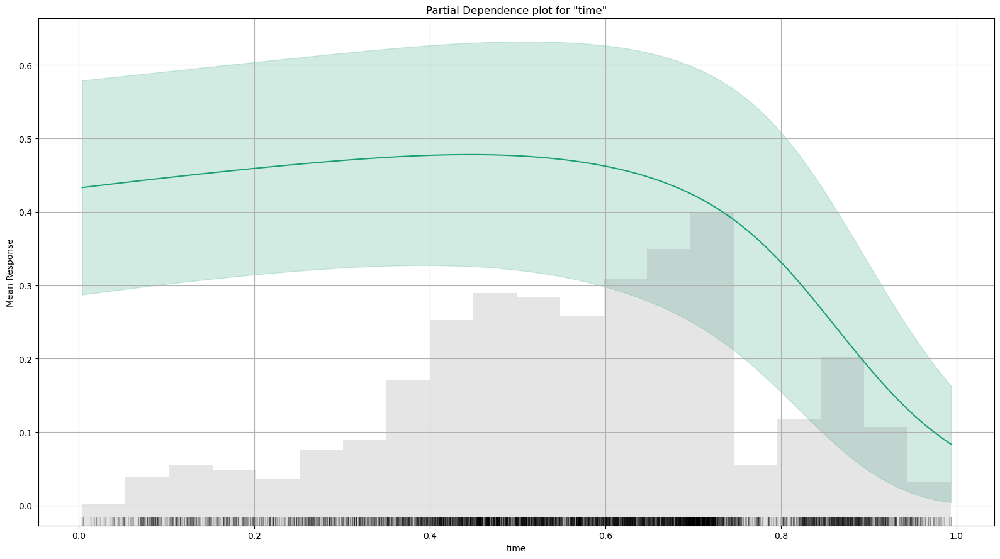

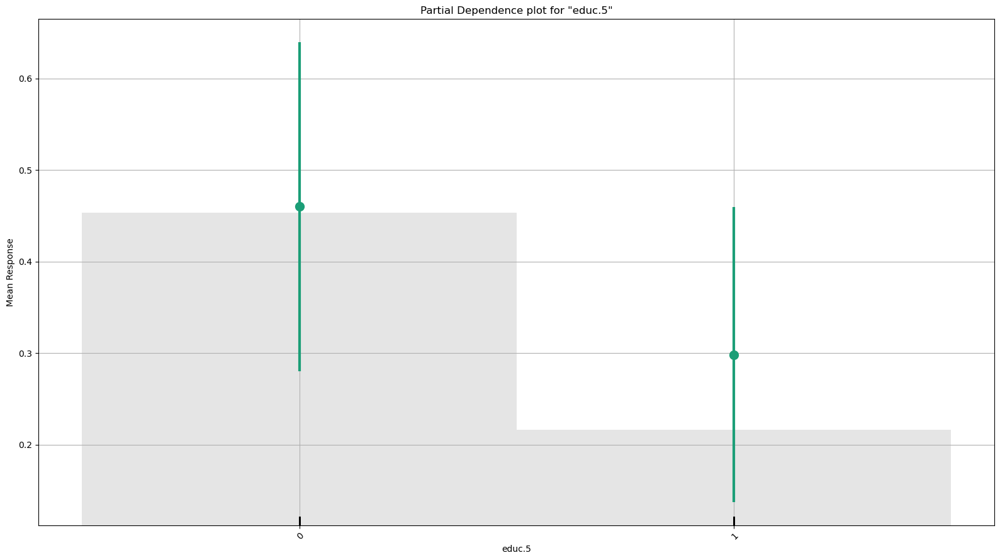

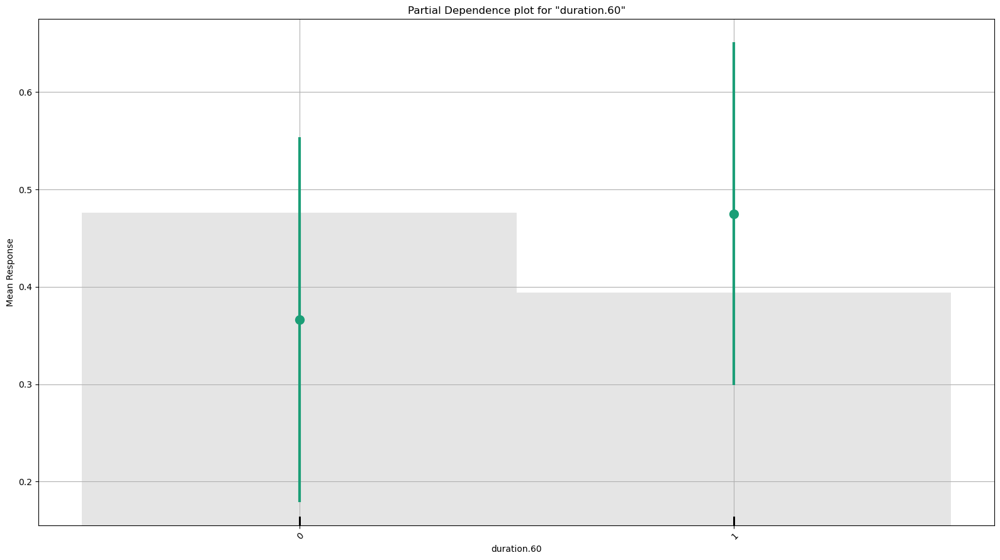

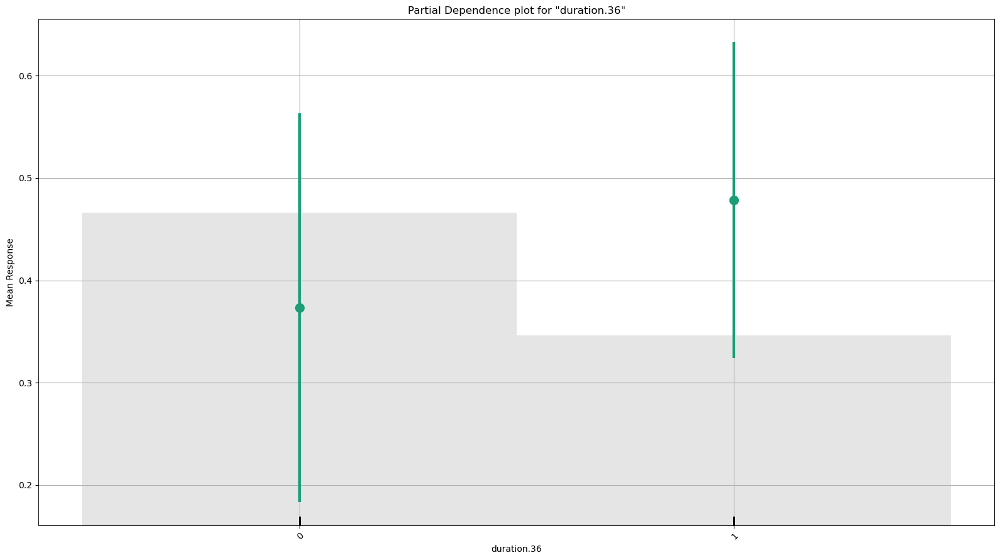

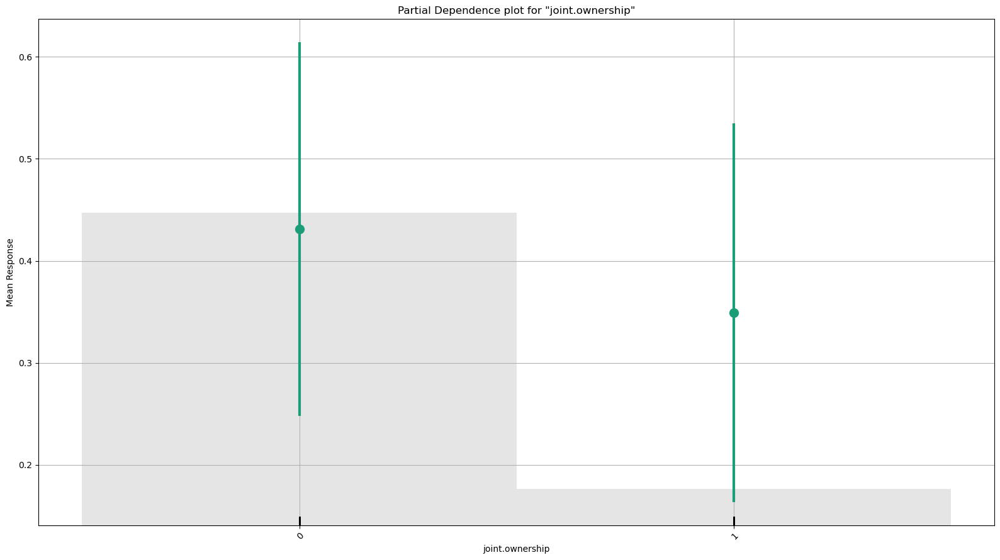

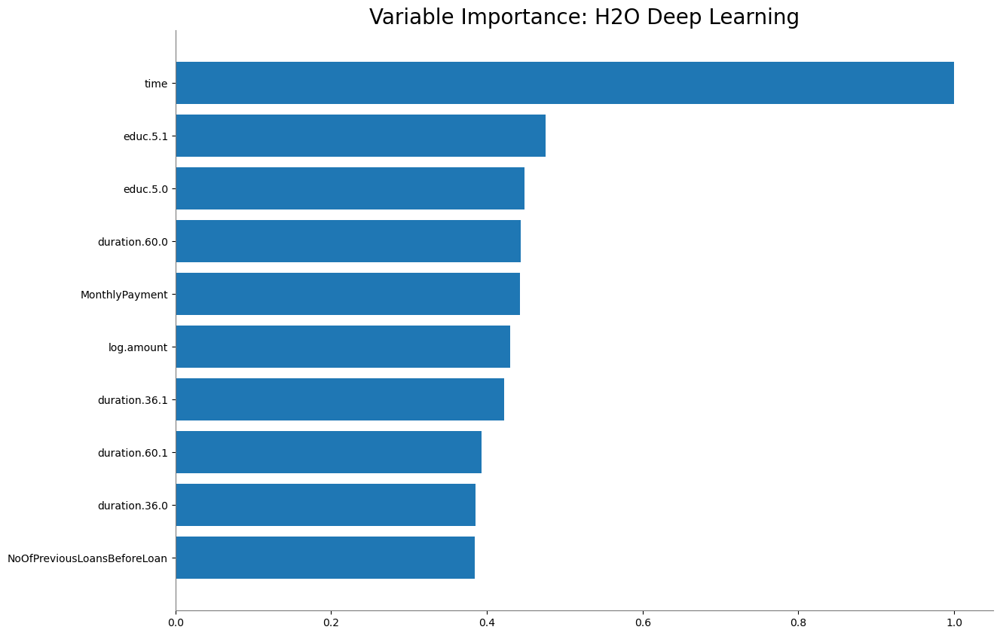

<Figure size 640x480 with 0 Axes>

In [70]:
# Group_DL_1 (TEST SET)
# Model interpretation
h2o.explain(Group_DL_1, test_data)

# Plot variable importance
Group_DL_1.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## 4e959e99ff80da34c178443a69d4fe8ee591e2970f13b8ca5b7b092c15d848ce

,0,1,Error,Rate
0,6612.0,2997.0,0.3119,(2997.0/9609.0)
1,1266.0,8325.0,0.132,(1266.0/9591.0)
Total,7878.0,11322.0,0.222,(4263.0/19200.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

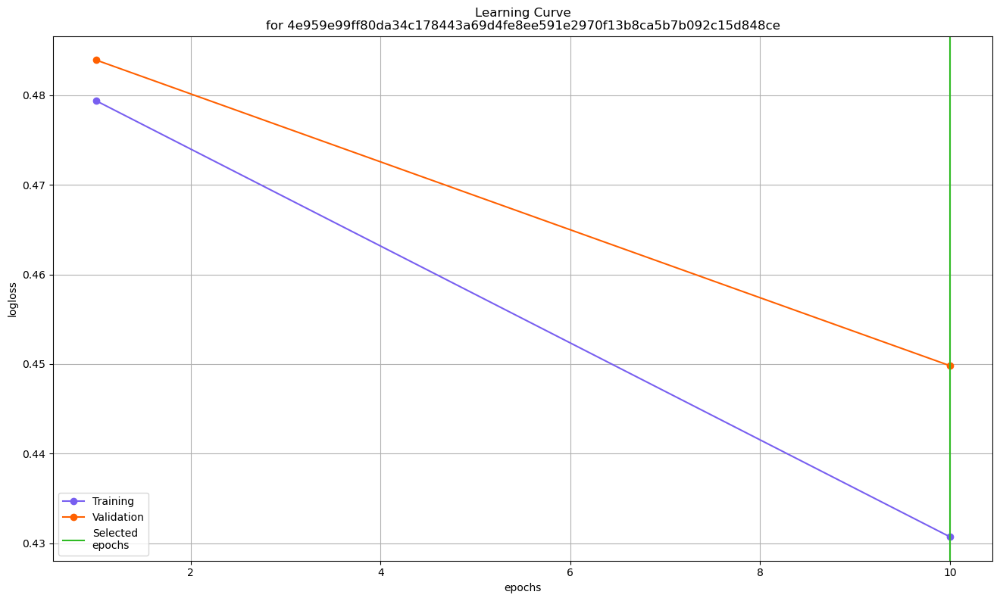

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

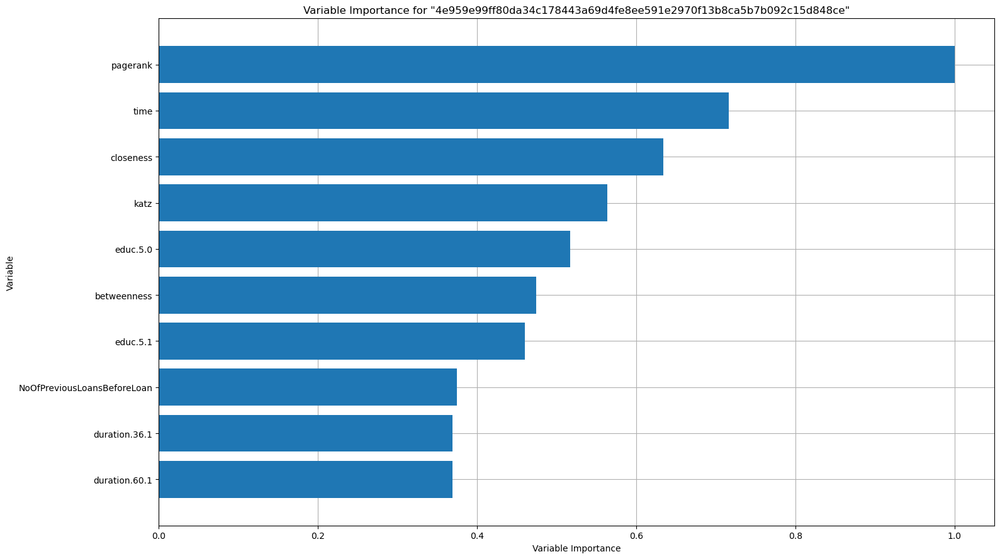

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

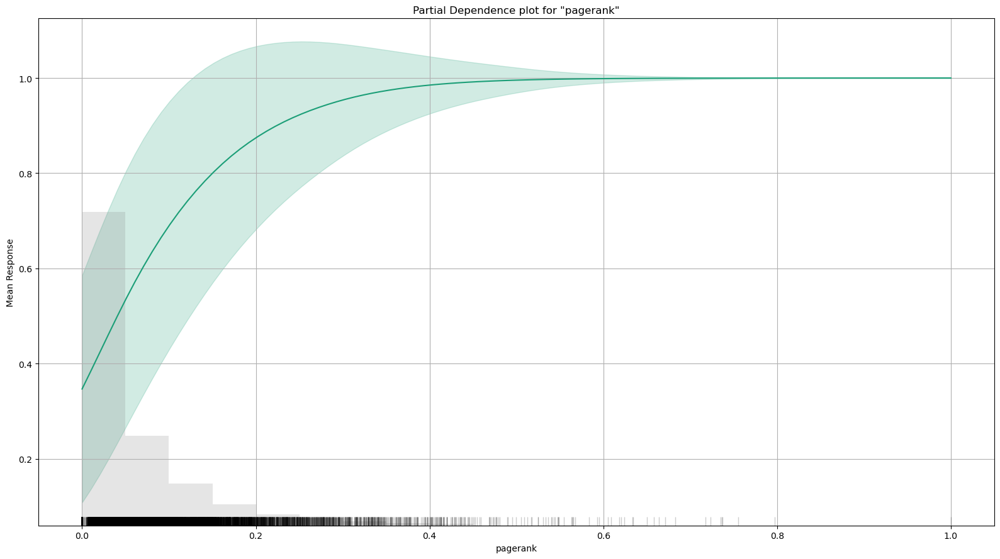

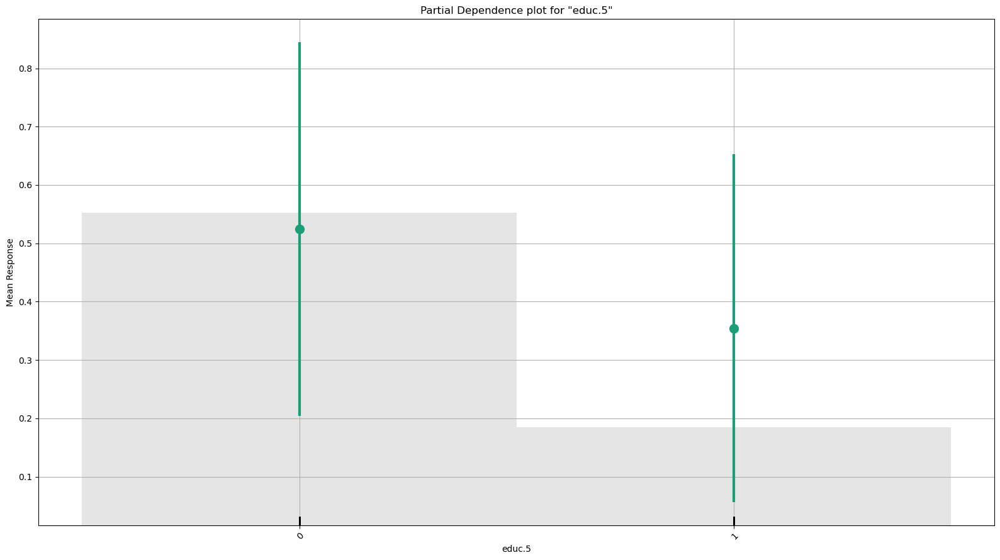

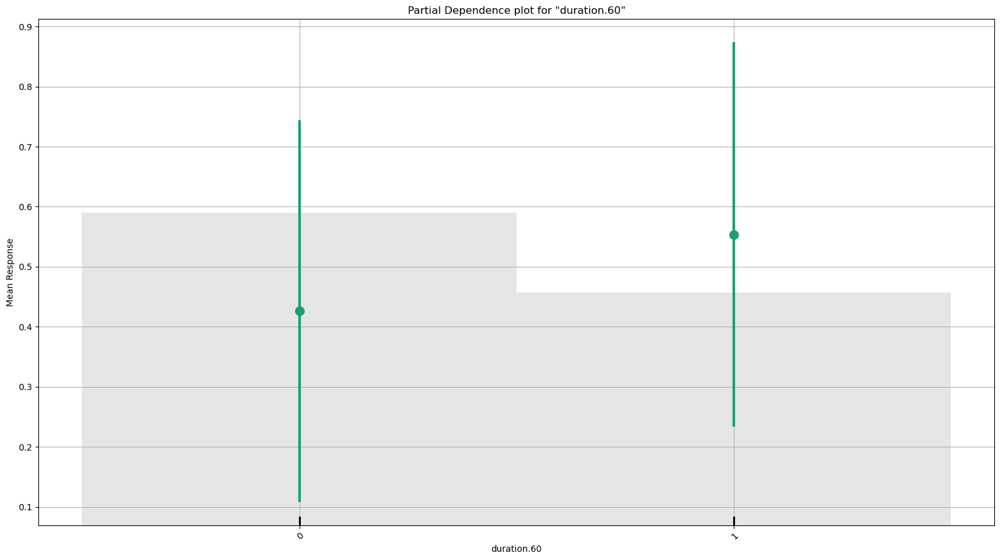

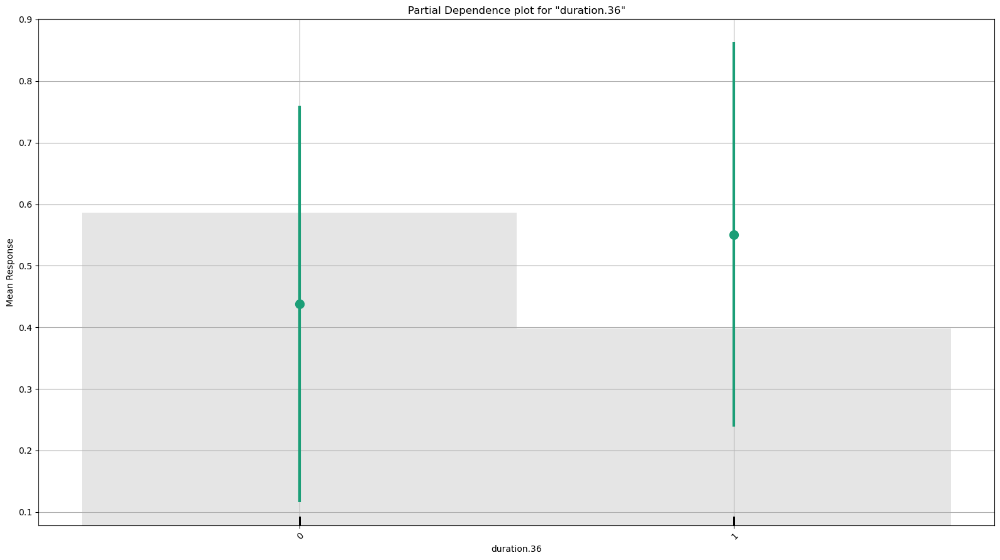

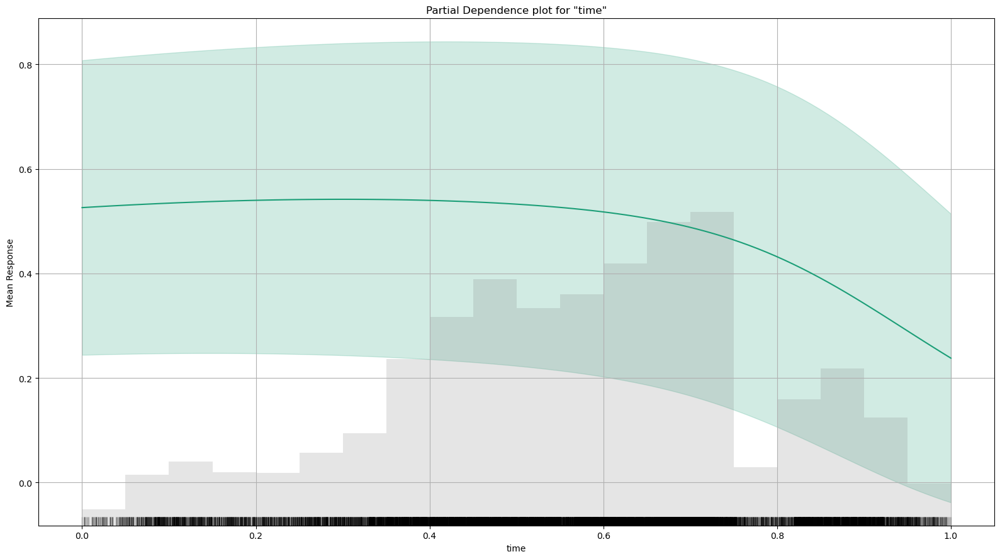

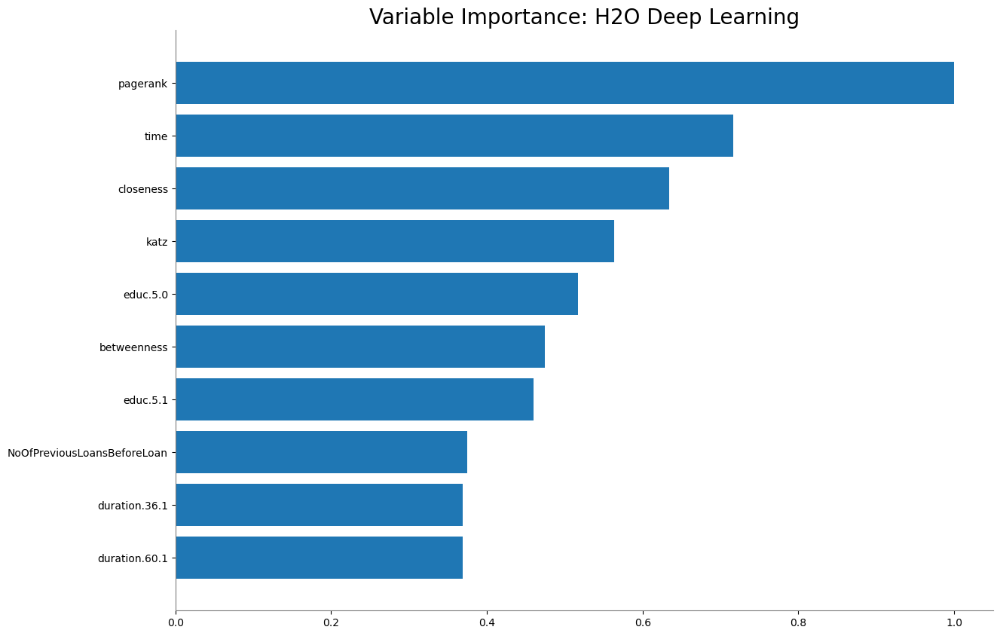

<Figure size 640x480 with 0 Axes>

In [61]:
# Group_DL_2 (training set)
# Model interpretation
h2o.explain(Group_DL_2, train_data)

# Plot variable importance
Group_DL_2.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## 4e959e99ff80da34c178443a69d4fe8ee591e2970f13b8ca5b7b092c15d848ce

,0,1,Error,Rate
0,1664.0,727.0,0.3041,(727.0/2391.0)
1,347.0,2062.0,0.144,(347.0/2409.0)
Total,2011.0,2789.0,0.2238,(1074.0/4800.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

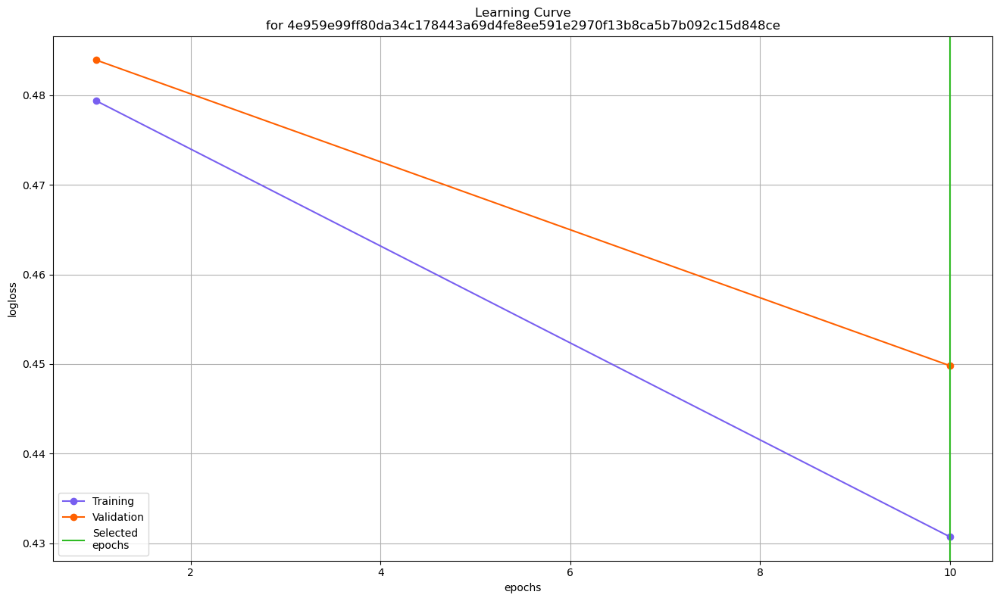

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

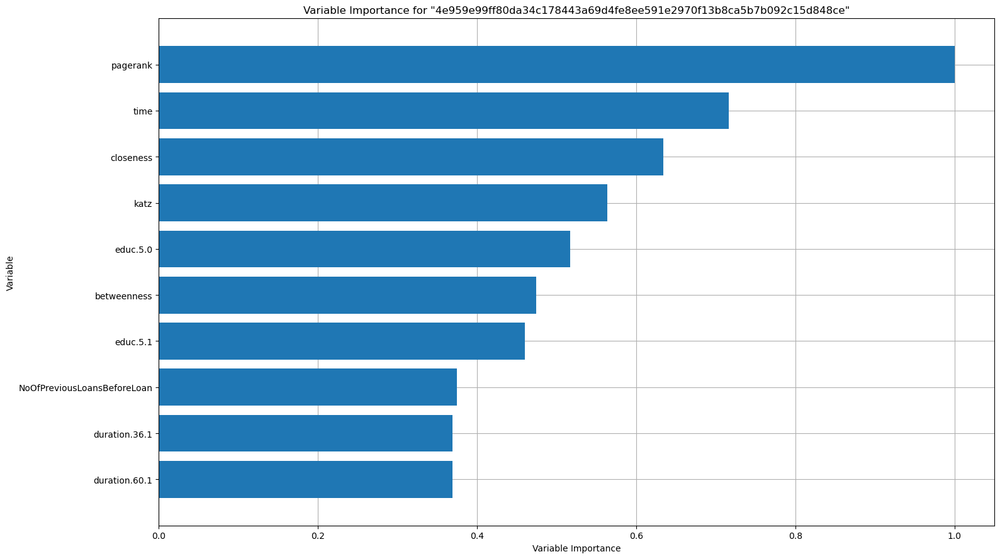

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

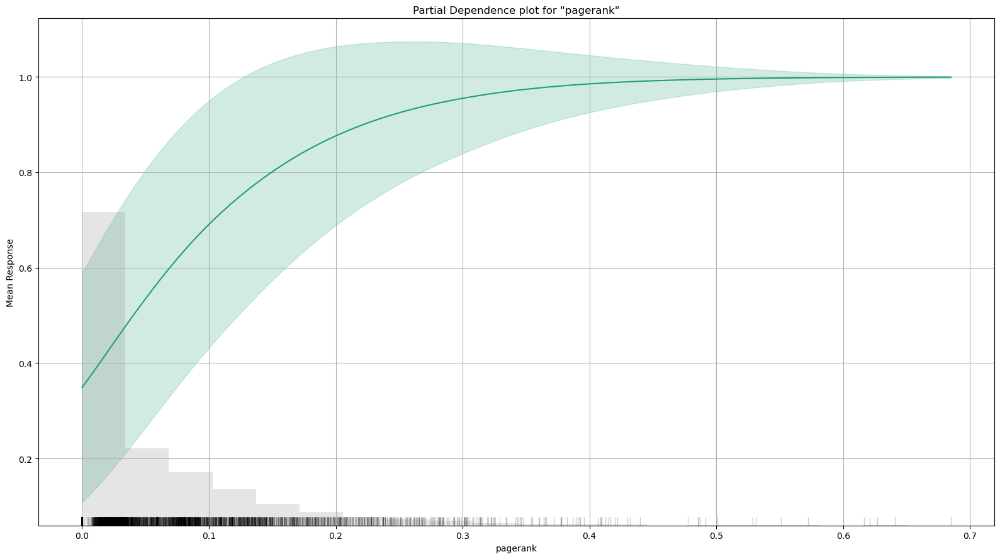

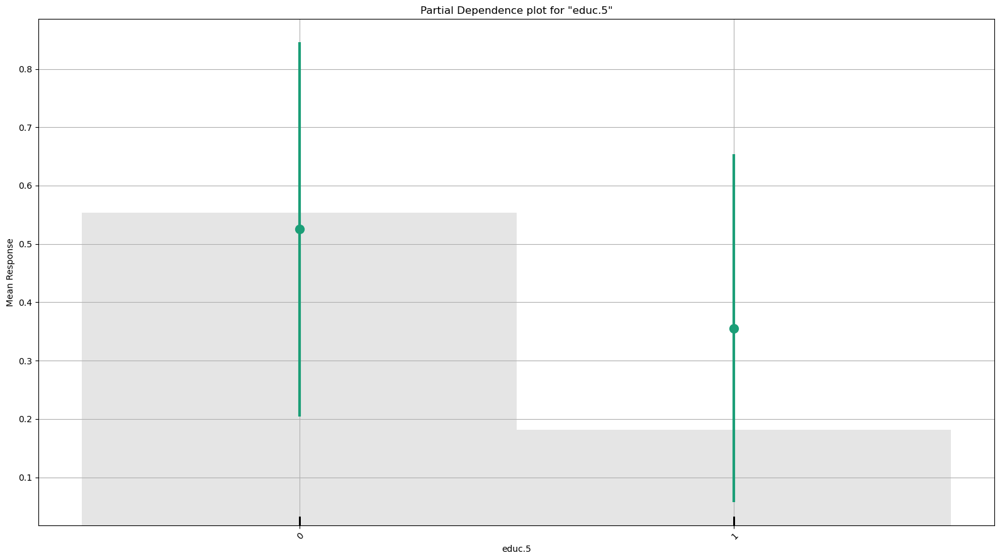

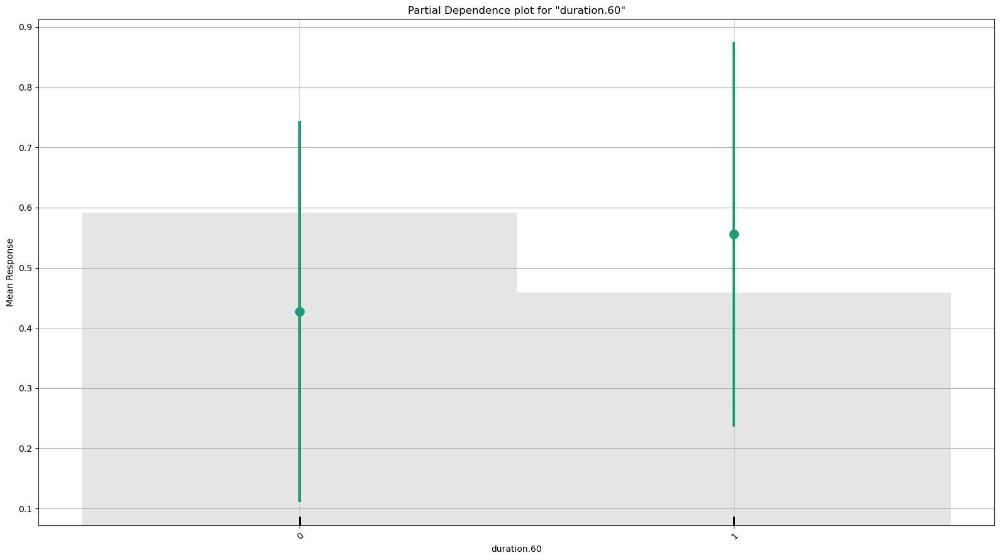

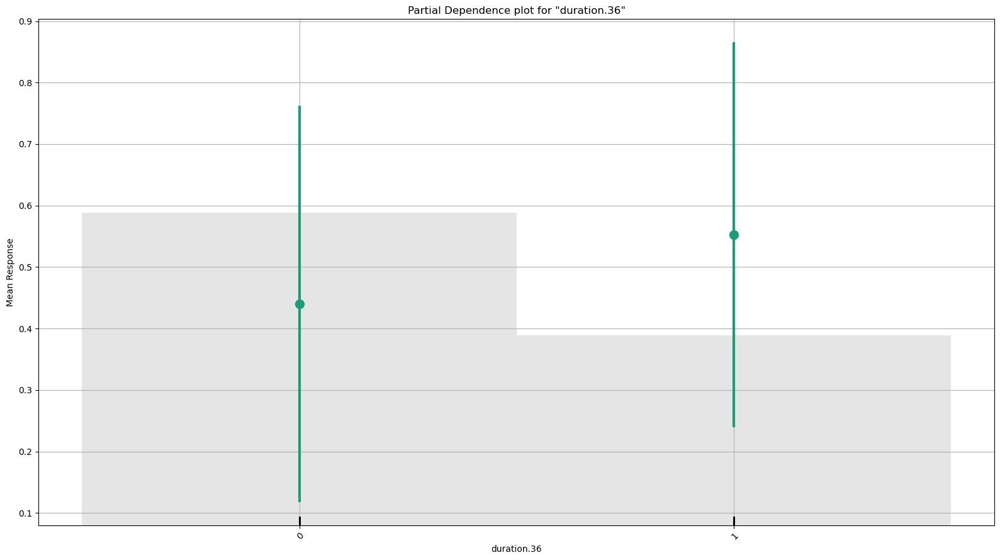

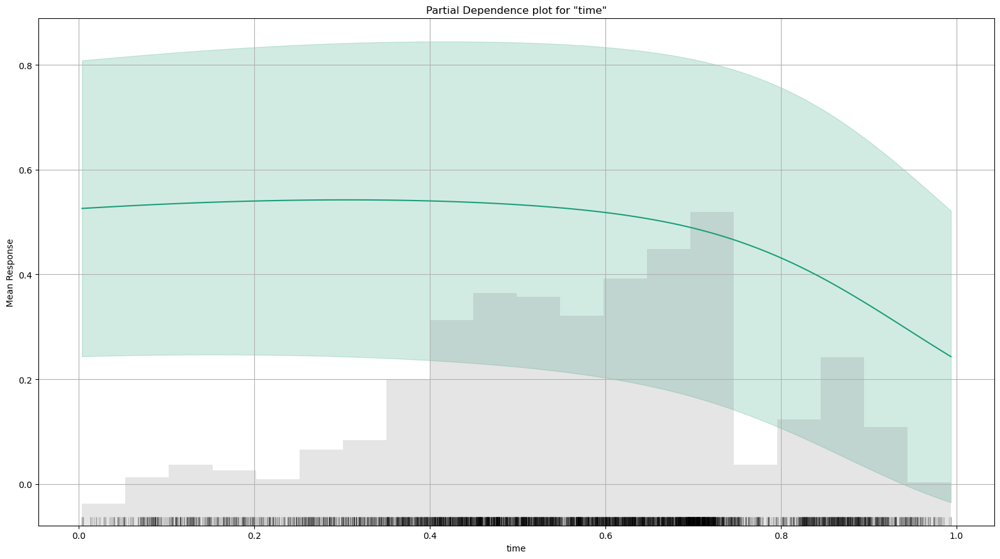

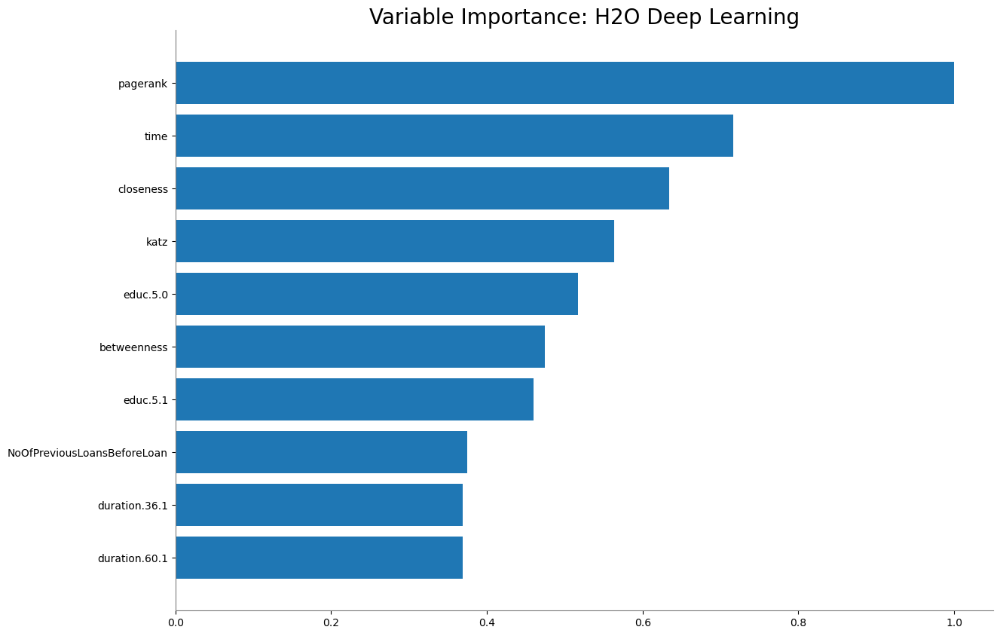

<Figure size 640x480 with 0 Axes>

In [71]:
# Group_DL_2 (TEST SET)
# Model interpretation
h2o.explain(Group_DL_2, test_data)

# Plot variable importance
Group_DL_2.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## ac854704fb2412964c28597f9b747d0b2cc90721ff3ff3408f34b0aa52121e6c

,0,1,Error,Rate
0,4257.0,5352.0,0.557,(5352.0/9609.0)
1,933.0,8658.0,0.0973,(933.0/9591.0)
Total,5190.0,14010.0,0.3273,(6285.0/19200.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

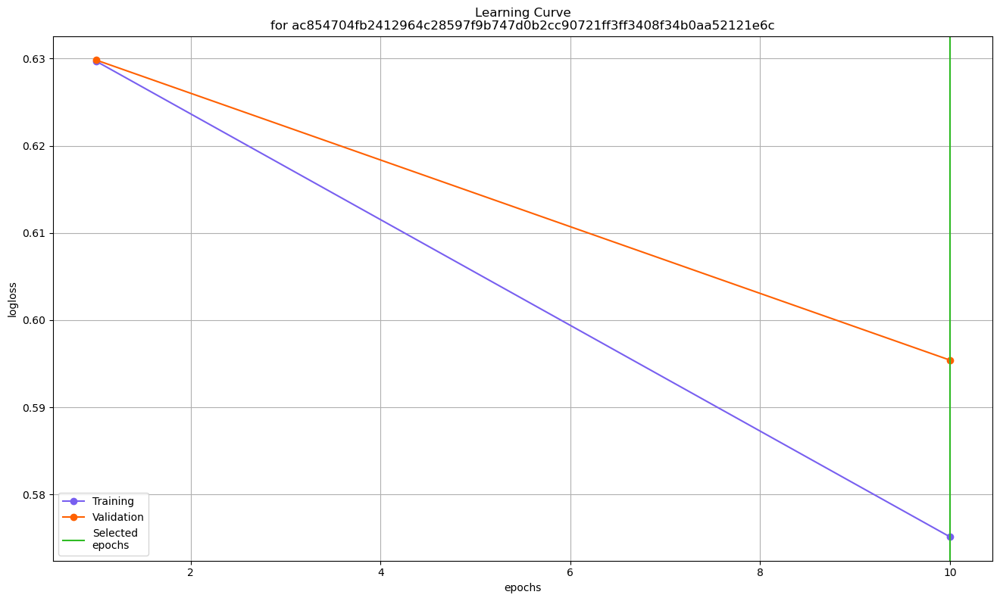

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

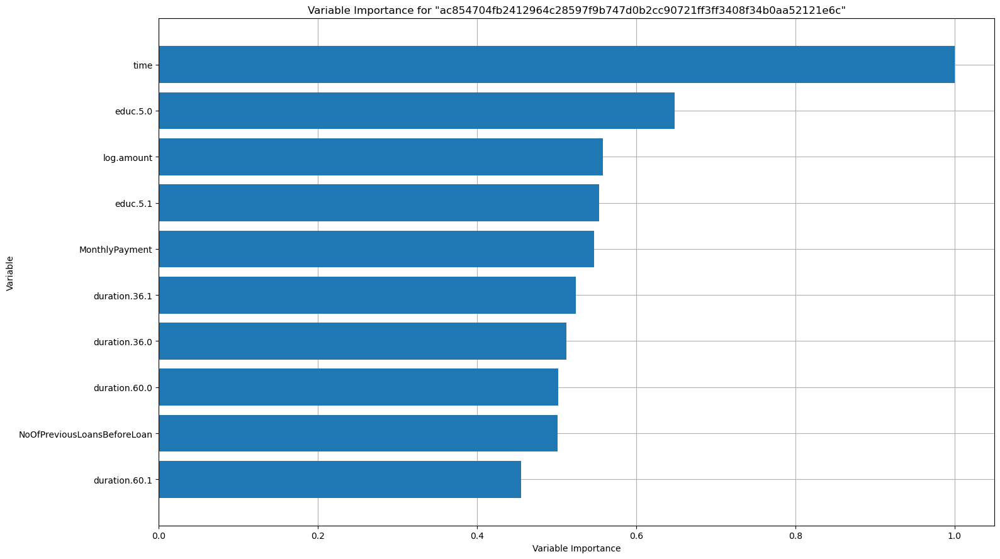

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

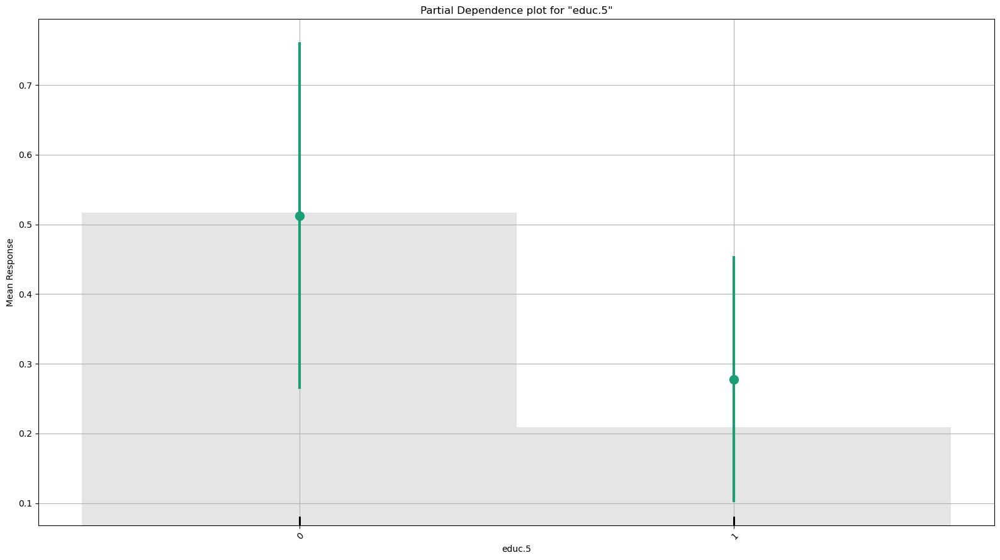

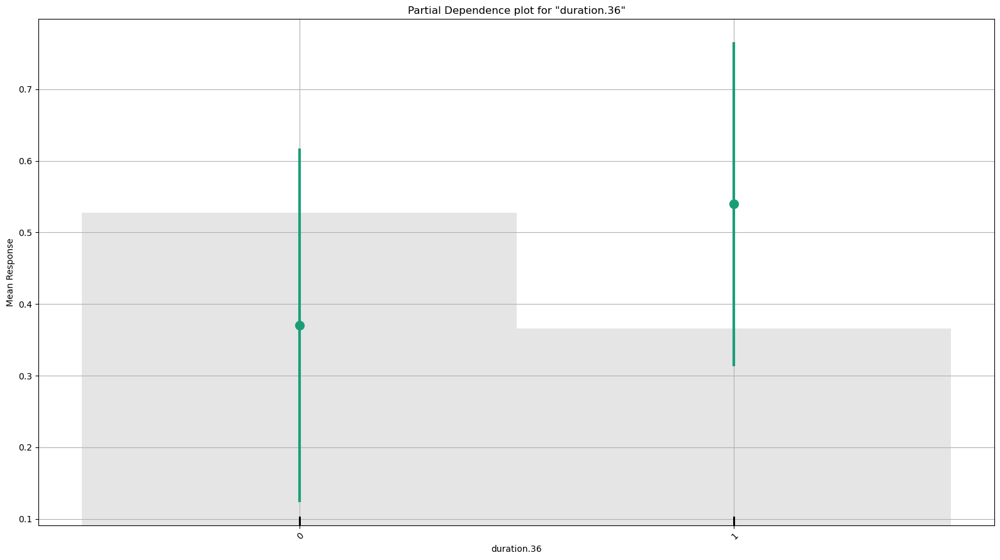

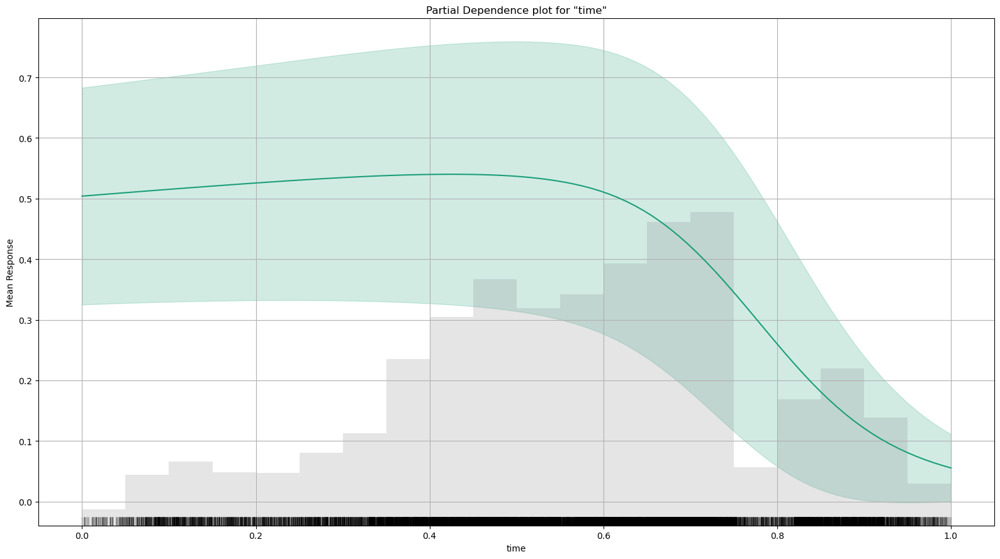

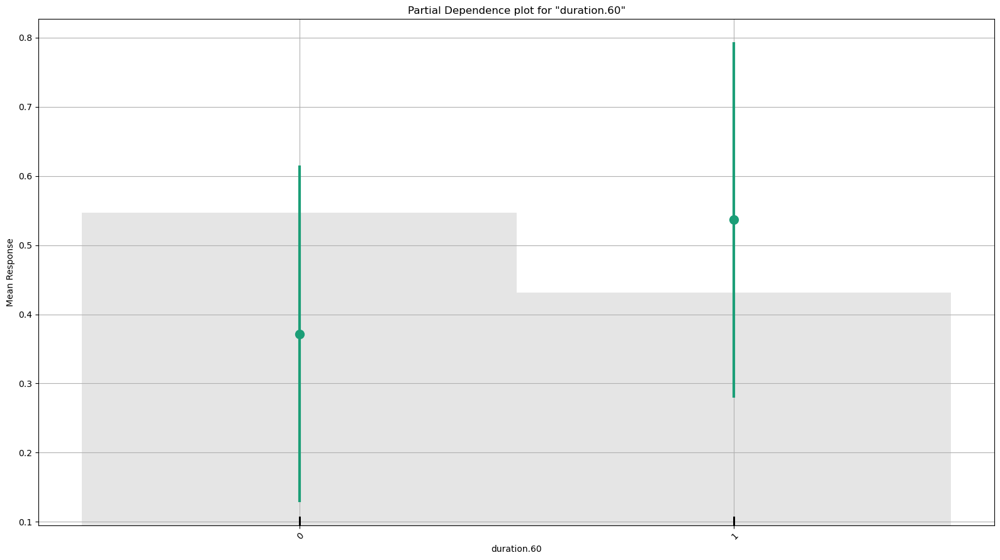

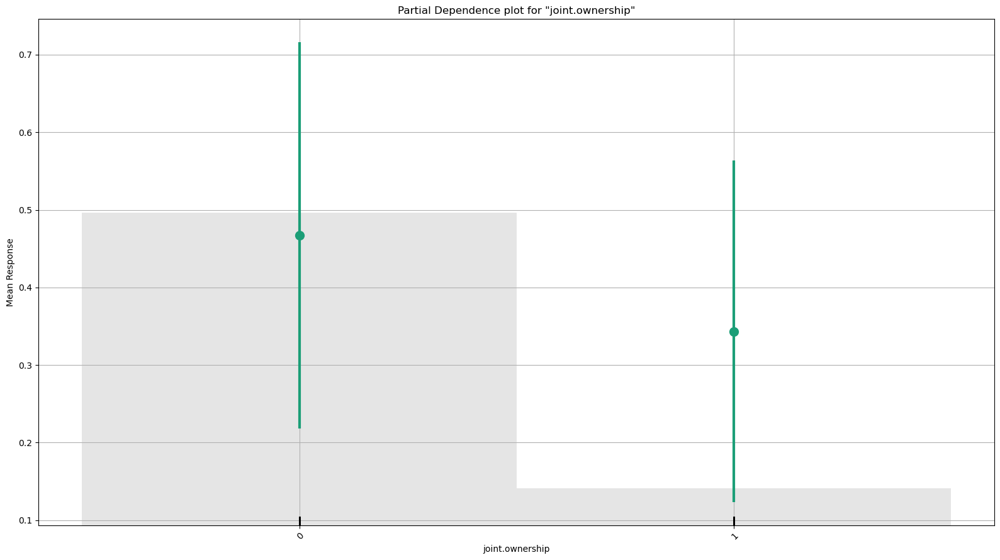

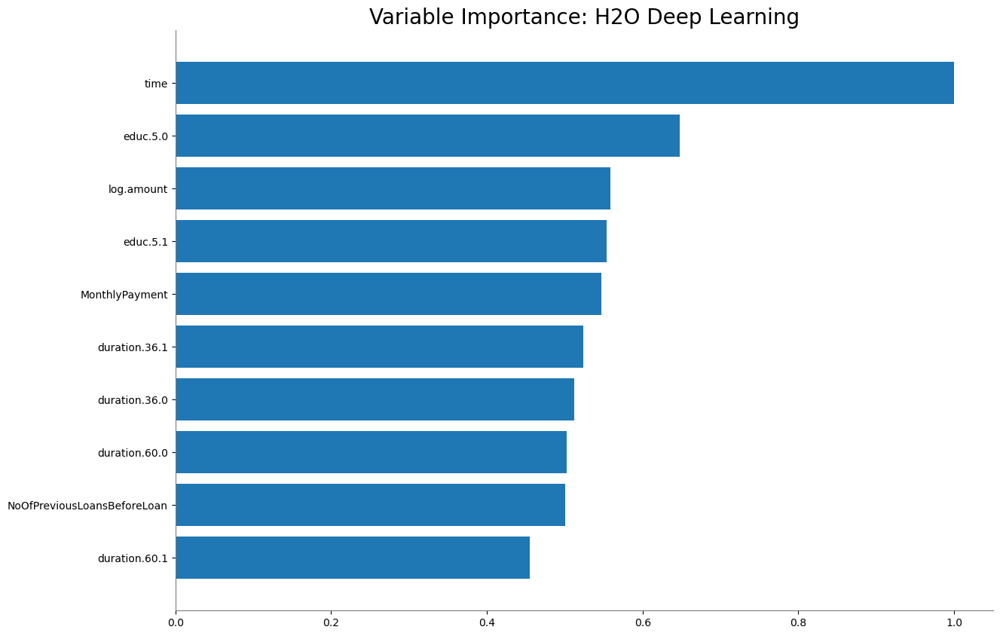

<Figure size 640x480 with 0 Axes>

In [62]:
# Group_DL_3 (training set)
# Model interpretation
h2o.explain(Group_DL_3, train_data)

# Plot variable importance
Group_DL_3.varimp_plot()

# Confusion Matrix

> Confusion matrix shows a predicted class vs an actual class.

## ac854704fb2412964c28597f9b747d0b2cc90721ff3ff3408f34b0aa52121e6c

,0,1,Error,Rate
0,1006.0,1385.0,0.5793,(1385.0/2391.0)
1,219.0,2190.0,0.0909,(219.0/2409.0)
Total,1225.0,3575.0,0.3342,(1604.0/4800.0)


# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

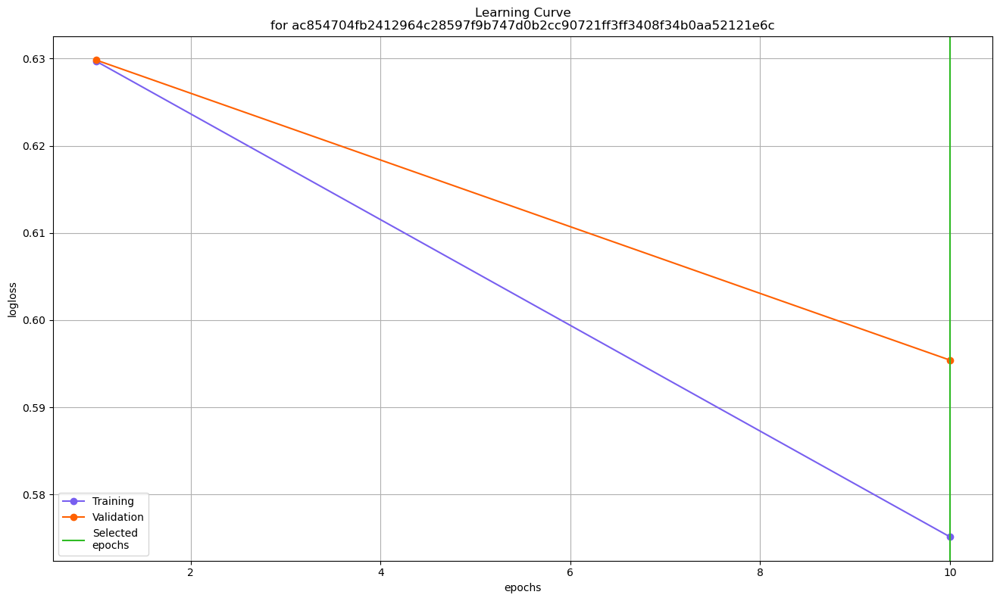

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

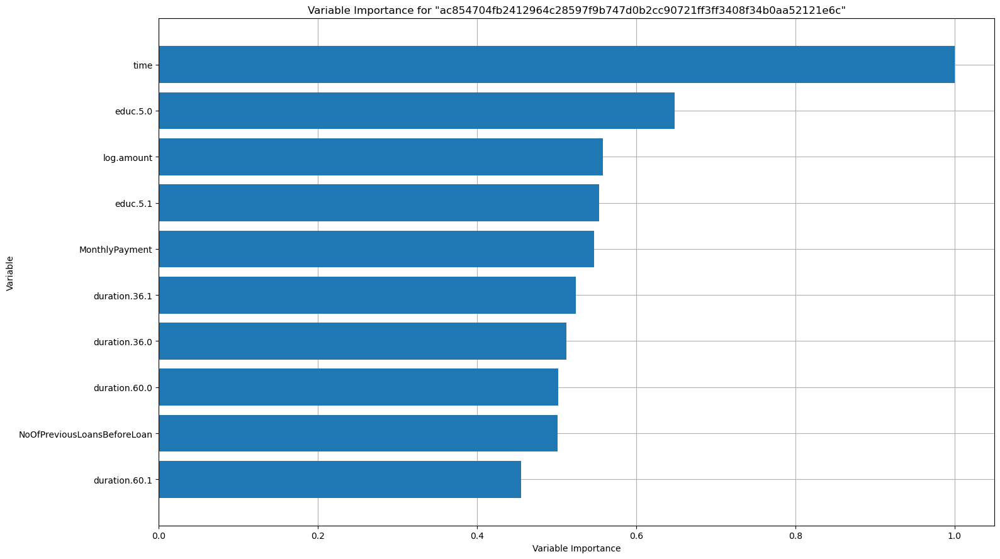

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

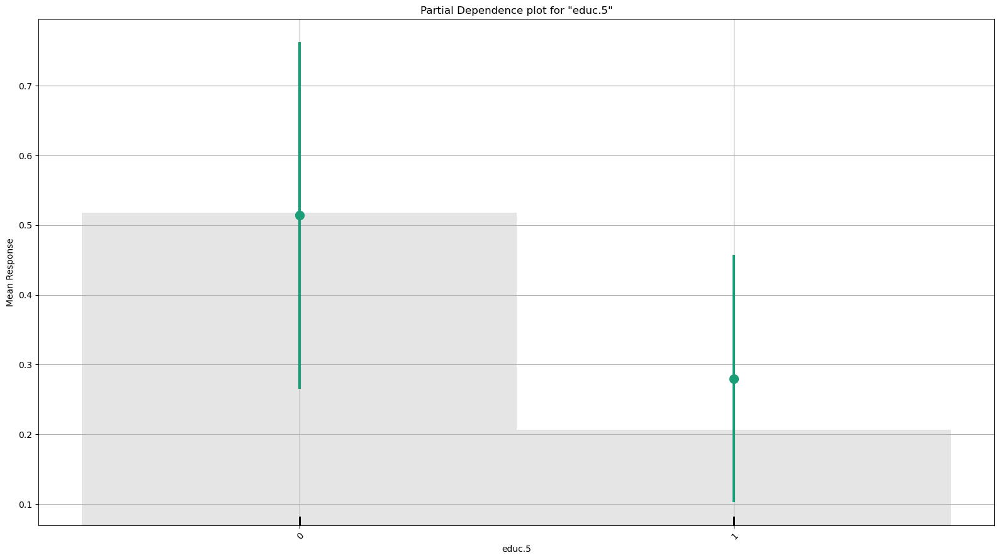

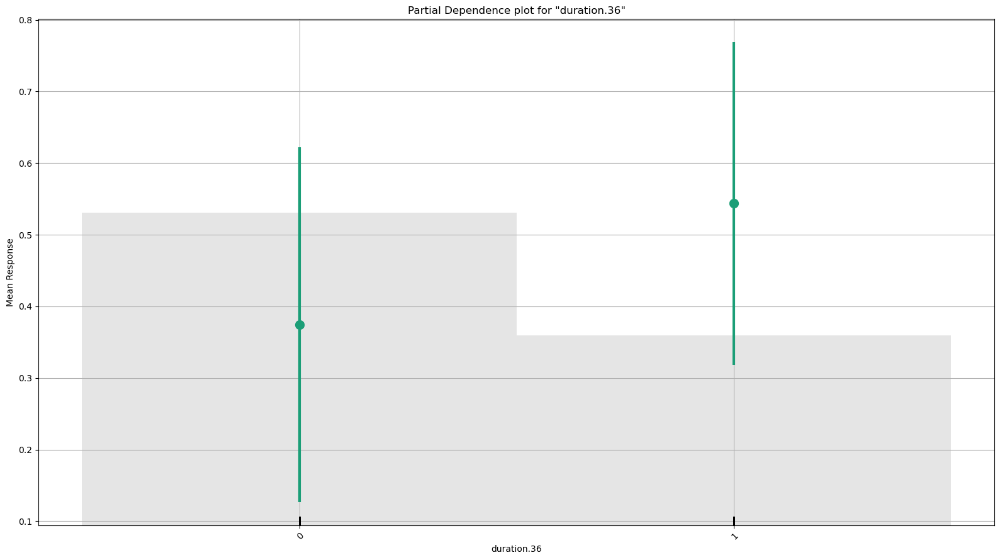

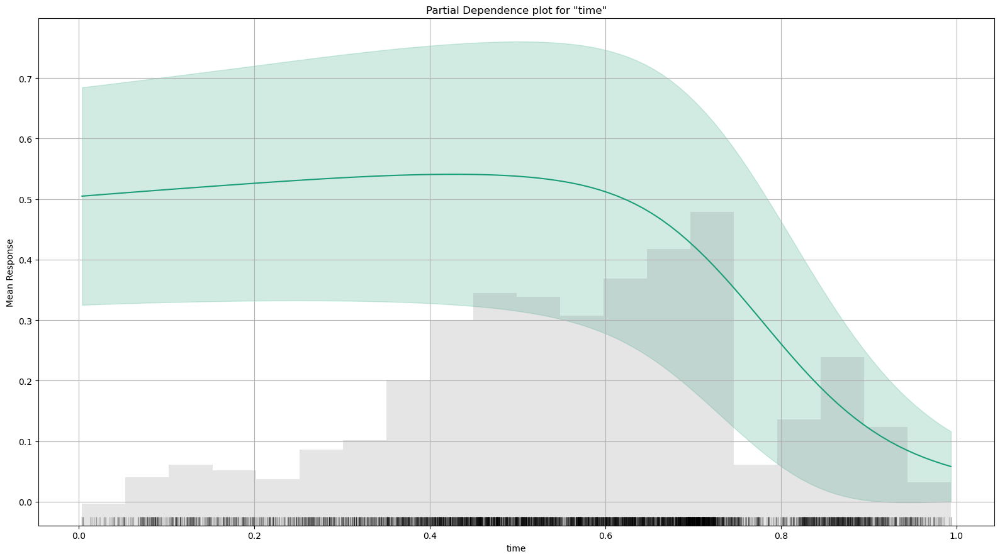

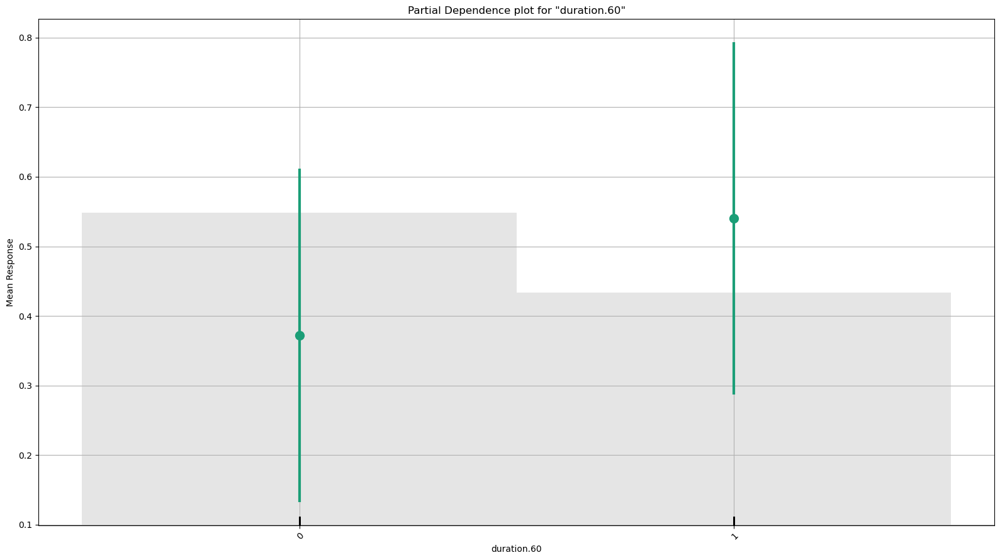

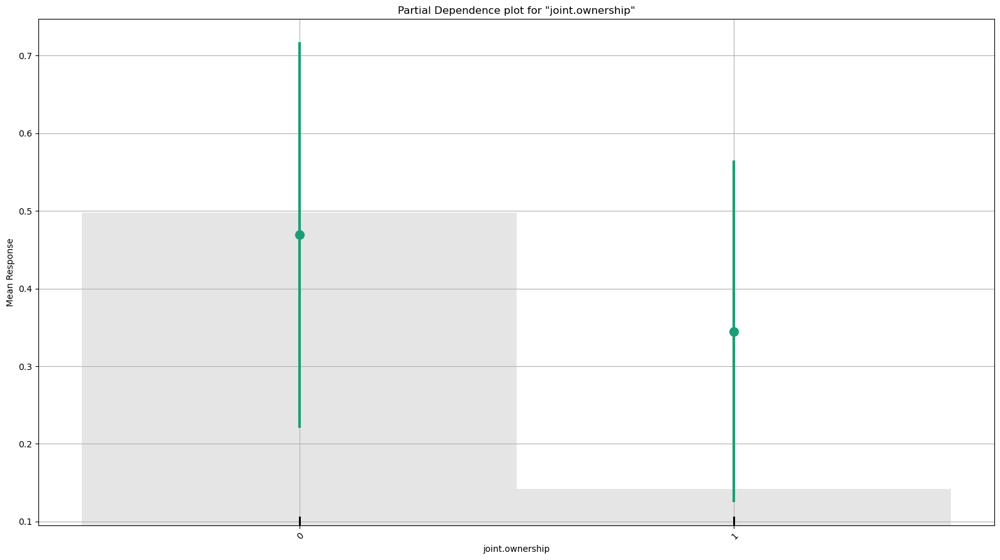

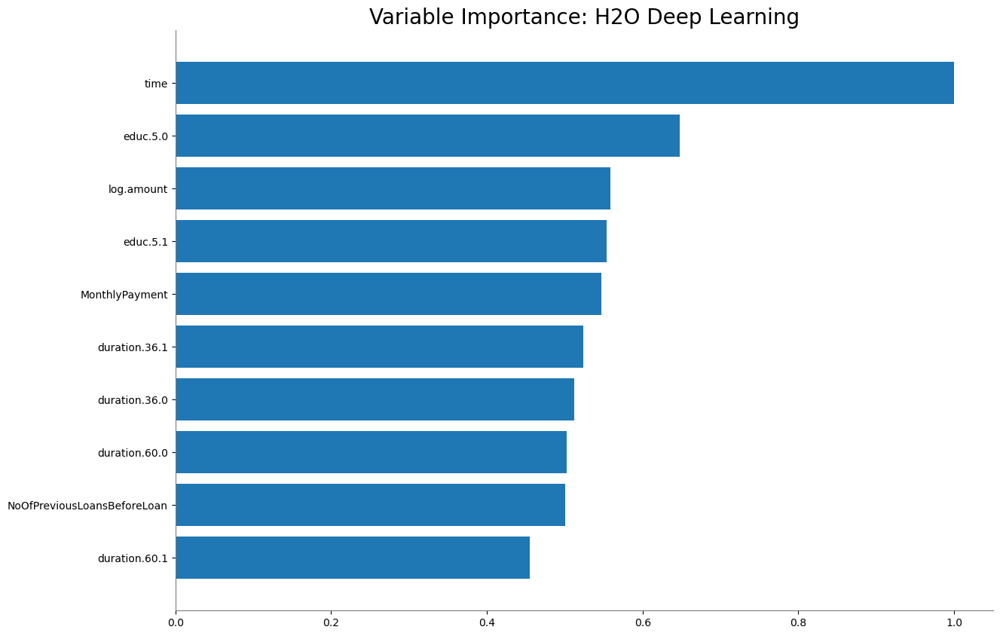

<Figure size 640x480 with 0 Axes>

In [72]:
# Group_DL_3 (TEST SET)
# Model interpretation
h2o.explain(Group_DL_3, test_data)

# Plot variable importance
Group_DL_3.varimp_plot()

# Load and evaluate
we have read back the test and train data. now we read back the trained model

This part load the models.\
Our aim is to compare the performance of two models sharing same hyper parameters but based on with6 and withou6.\
Currently, I have not finished the code to compare multiple groups of models.\
I plan to finish the code for comparsion, and then apply this part to multiple groups.\
Currently, I use model_with6 and model_without6 to represent two models.\

In [53]:
problematic_pairs, result_list, graph_filepath = load_pairs_and_compare(
    X_test,
    y_test,
    exclude_LIST,
    models_and_hyperparams,
    model_directory,
    graph_directory,
    model_to_analyse,
    paired=True)

Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/fa6b728c8ebd82fb044ed37b5c2d8d8501150f092db016e71104a7a58bdfa8d0/fa6b728c8ebd82fb044ed37b5c2d8d8501150f092db016e71104a7a58bdfa8d0
No model file found at /Users/bal8/Desktop/P2P-Model-Bondora/model/fa6b728c8ebd82fb044ed37b5c2d8d8501150f092db016e71104a7a58bdfa8d0/fa6b728c8ebd82fb044ed37b5c2d8d8501150f092db016e71104a7a58bdfa8d0
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/a069b72afdd1adc5fc87b3d76eee905b68a232891bd1b27a6d8304c405a574aa/a069b72afdd1adc5fc87b3d76eee905b68a232891bd1b27a6d8304c405a574aa
No model file found at /Users/bal8/Desktop/P2P-Model-Bondora/model/a069b72afdd1adc5fc87b3d76eee905b68a232891bd1b27a6d8304c405a574aa/a069b72afdd1adc5fc87b3d76eee905b68a232891bd1b27a6d8304c405a574aa
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/fa6b728c8ebd82fb044ed37b5c2d8d8501150f092db016e71104a7a58bdfa8d0/fa6b728c8ebd82fb044ed37b5c2d8d8501150f092db016e71104a7a58bdfa8d0
No model 

In [51]:
problematic_pairs

[({'ntrees': 50, 'max_depth': 5},
  0,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 50, 'max_depth': 10},
  1,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 50, 'max_depth': 15},
  2,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 50, 'max_depth': 20},
  3,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 100, 'max_depth': 5},
  4,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 100, 'max_depth': 10},
  5,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 100, 'max_depth': 15},
  6,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 100, 'max_depth': 20},
  7,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 150, 'max_depth': 5},
  8,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 150, 'max_depth': 10},
  9,
  NameError("name 'delong_test' is not defined")),
 ({'ntrees': 150, 'max_depth': 15},
  10,
  NameError("name 'delong_test' is not define

In [39]:
problematic_pairs = []  

Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/02549686289fabb00f007337137c6a4809cb77b02c5dd11d1ac3a2903efa8d32/02549686289fabb00f007337137c6a4809cb77b02c5dd11d1ac3a2903efa8d32
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/e309de6a32c59ba5db56ffc7f2ffdbb8a65d5972320dd2bac8e03ae003f9e459/e309de6a32c59ba5db56ffc7f2ffdbb8a65d5972320dd2bac8e03ae003f9e459
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/f6ec0bab2aafc00ba79ca257e76e64f4f91858d266a906bb6665134709d01a84/f6ec0bab2aafc00ba79ca257e76e64f4f91858d266a906bb6665134709d01a84
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/edca328ed9f8741cb8c0de5313bb83fd87abdae9c49ace67851adbfe54cd9550/edca328ed9f8741cb8c0de5313bb83fd87abdae9c49ace67851adbfe54cd9550
Loading model from path: /Users/bal8/Desktop/P2P-Model-Bondora/model/02549686289fabb00f007337137c6a4809cb77b02c5dd11d1ac3a2903efa8d32/02549686289fabb00f007337137c6a4809cb77b02c5dd11d1ac3a2903efa8d32
Loadi

([],
 '/Users/bal8/Desktop/P2P-Model-Bondora/graph/feature_importance/preprocessed_shuffled/RF.pdf')

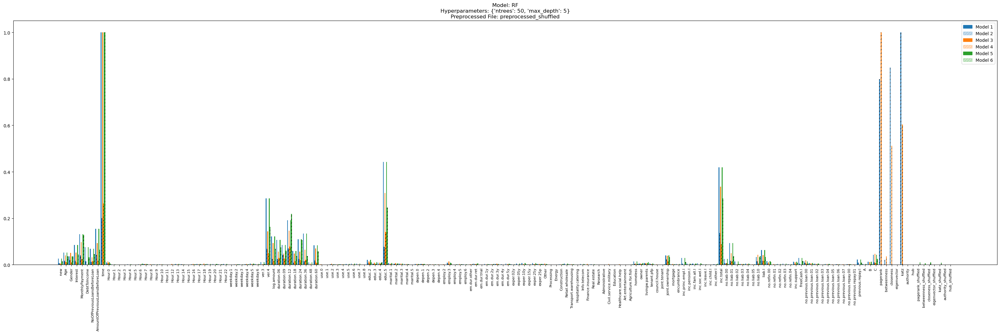

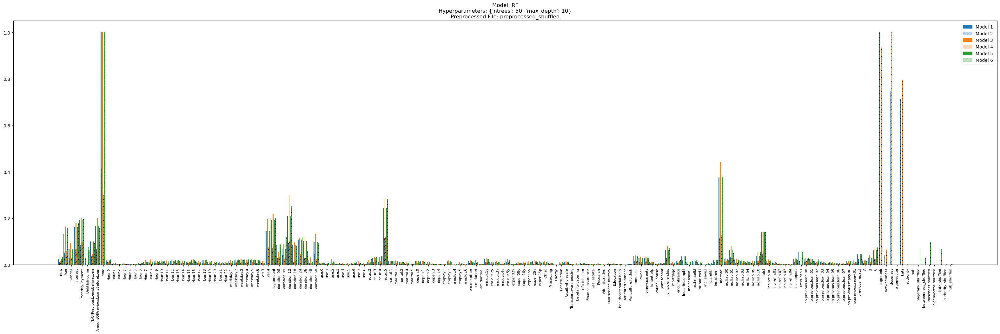

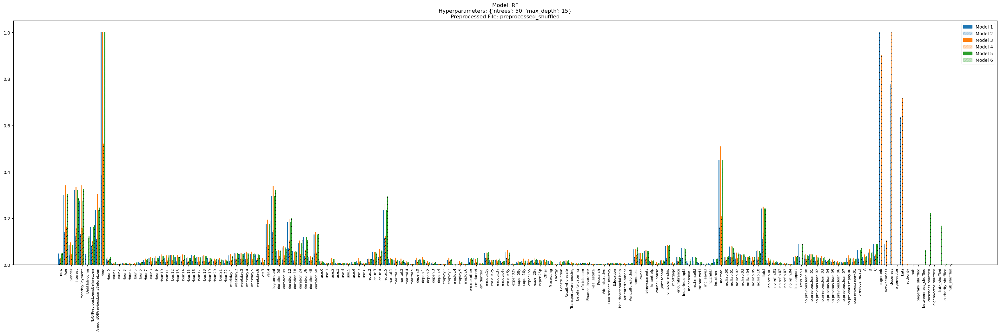

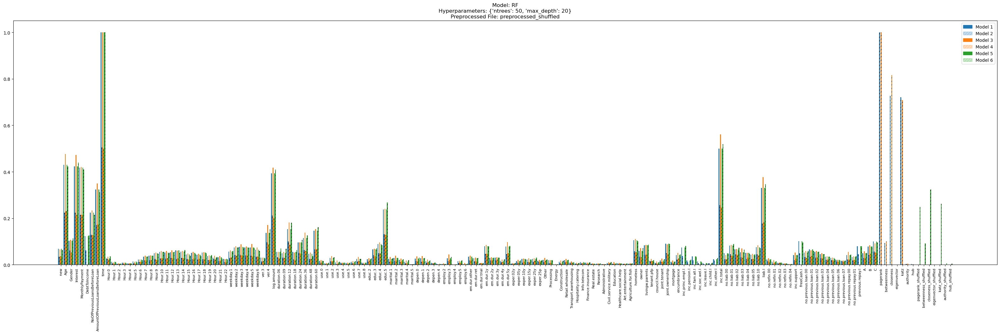

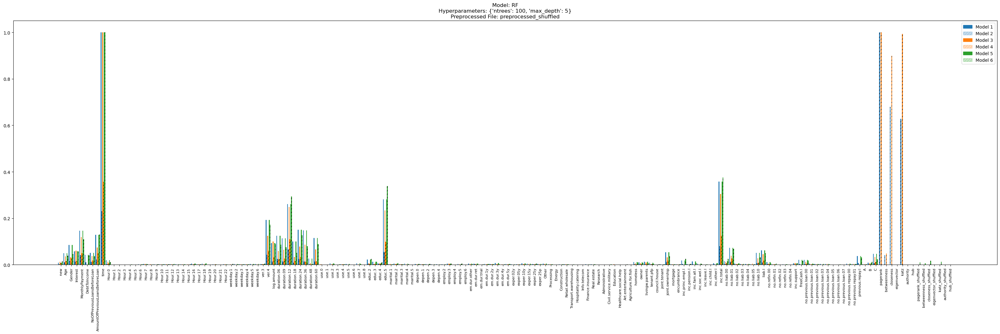

...

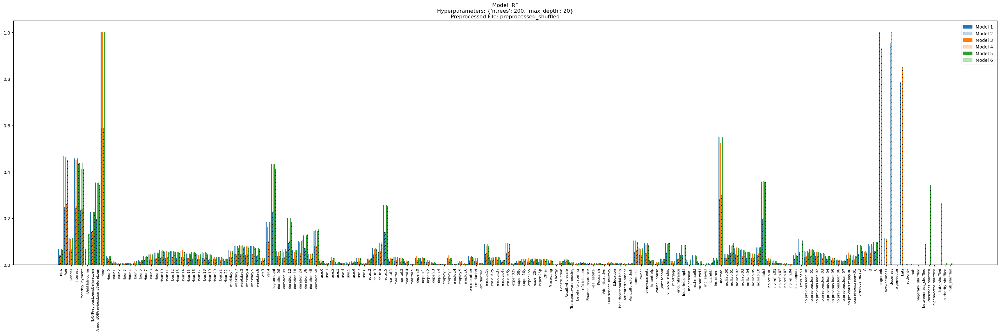

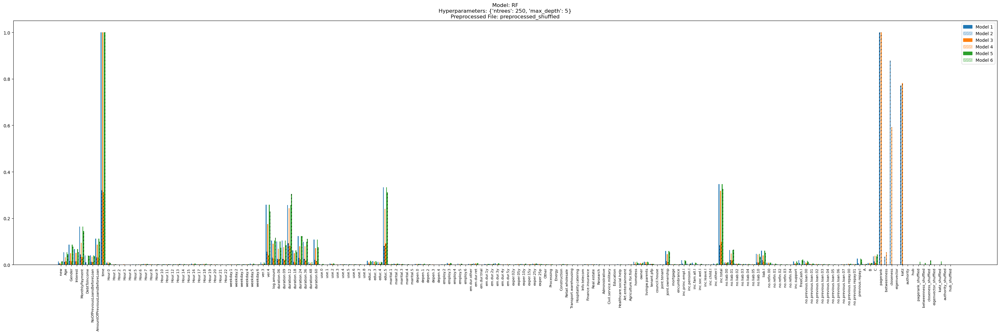

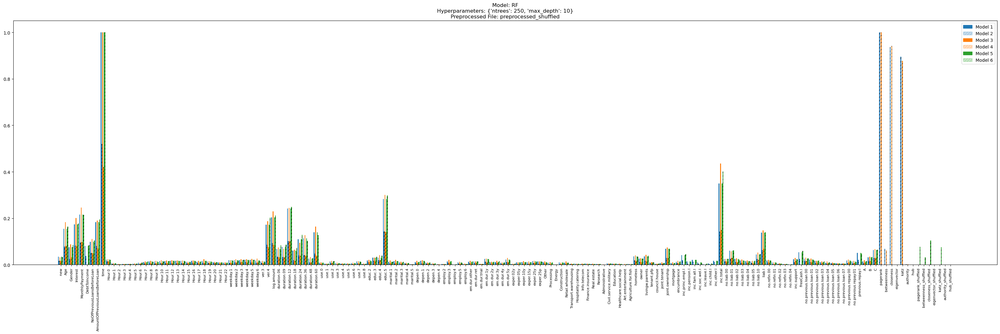

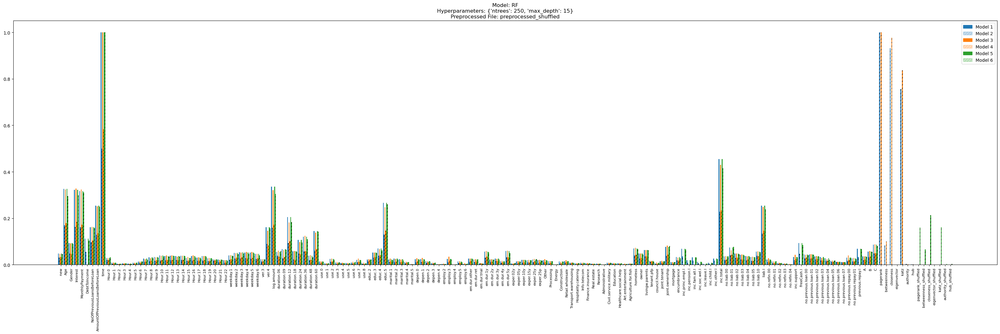

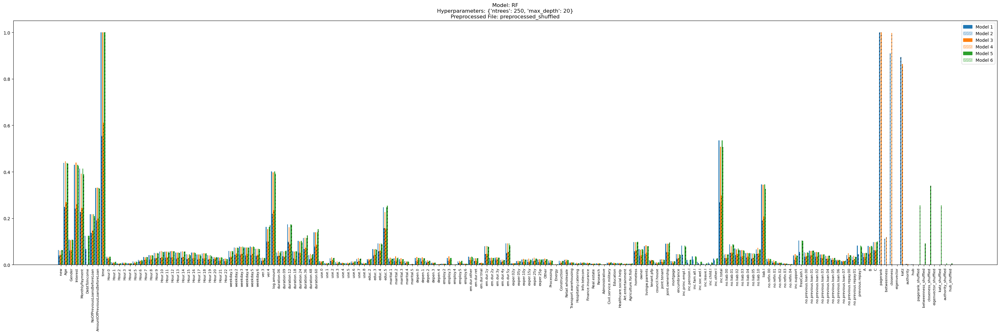

In [57]:
feature_importance(X_test,
                       y_test,
                       exclude_LIST,
                       models_and_hyperparams,
                       model_directory,
                       graph_directory,
                       model_to_analyse,
                       paired=True)

In [58]:
problematic_pairs = [] 

In [154]:
print_model_report(X_test, y_test, exclude_LIST, models_and_hyperparams,
                       model_directory, graph_directory, model_to_analyse)

'/Users/yil1/GitHub/P2P-Model-Bondora/graph/model_report/preprocessed_shuffled/GLM.pdf'

# Compute LIME values for best models 

In [95]:
#LIME
# Select a row from the test set for which you want explanations. Here we select
# the first row.
row_index = 4  # Replace 0 with the desired row index

# check data type of X_train and y_train
print(type(X_train))
print(type(y_train))
print(type(X_test))
print(type(y_test))

<class 'pandas.core.frame.DataFrame'>
<class 'numpy.ndarray'>
<class 'pandas.core.frame.DataFrame'>
<class 'numpy.ndarray'>


In [79]:
# Dropping the 'eigenvector' and 'eigenvector_shuffled' columns from X_train, due to NaNs
X_train = X_train.drop(['eigenvector', 'eigenvector_shuffled'], axis=1)

# Dropping the 'eigenvector' and 'eigenvector_shuffled' columns from X_test, due to NaNs
X_test = X_test.drop(['eigenvector', 'eigenvector_shuffled'], axis=1)

In [80]:
# convert X_train from h2o.frame to pandas.frame
X_train = h2o_to_pandas(X_train)
# convert binary columns to categorical columns
X_train = convert_binary_to_categorical(X_train, binary_columns)
# convert X_train from h2o.frame to pandas.frame
X_test = h2o_to_pandas(X_test)
# convert binary columns to categorical columns
X_test = convert_binary_to_categorical(X_test, binary_columns)


# print head of X_train and X_test
print(X_train.head())
print(X_test.head())

  new       Age Gender  Interest  MonthlyPayment  DebtToIncome  \
0   0  0.692308      1  0.469554        0.501901      0.000000   
1   1  0.134615      0  0.188212        0.752364      0.000000   
2   1  0.423077      1  0.534354        0.680313      0.235227   
3   0  0.211538      1  0.060892        0.666817      0.000000   
4   0  0.519231      1  0.869749        0.000000      0.191693   

   NoOfPreviousLoansBeforeLoan  AmountOfPreviousLoansBeforeLoan      time  \
0                     0.115385                         0.157894  0.901789   
1                     0.000000                         0.000000  0.948363   
2                     0.000000                         0.000000  0.152548   
3                     0.192308                         0.039751  0.701991   
4                     0.038462                         0.020070  0.059062   

  Hour.0  ... closeness      katz     authority           hub  \
0      0  ...  0.032052  0.000000  0.000000e+00  1.450147e-94   
1      0  

In [81]:
# convert y_train and y_test from h2o.frame to pandas.frame to np.array
y_train = h2o_to_pandas(y_train)
y_test = h2o_to_pandas(y_test)

# convert y_train (pd.frame) into np.array format
y_train = y_train.iloc[:, 0].values
y_test = y_test.iloc[:, 0].values

print(y_train)
print(y_test)

[0 0 0 ... 0 1 1]
[1 1 1 ... 0 1 1]


In [82]:
print(len(y_train))
print(len(y_test))

14400
4800


In [83]:
# Checking how GLM and DL treat NaN values
print('GLM missing values handling:', Group_GLM_1.params['missing_values_handling'])
print('GLM missing values handling:', Group_GLM_2.params['missing_values_handling'])
print('GLM missing values handling:', Group_GLM_3.params['missing_values_handling'])
print('DL missing values handling:', Group_DL_1.params['missing_values_handling'])
print('DL missing values handling:', Group_DL_2.params['missing_values_handling'])
print('DL missing values handling:', Group_DL_3.params['missing_values_handling'])

GLM missing values handling: {'default': 'MeanImputation', 'actual': 'MeanImputation', 'input': 'MeanImputation'}
GLM missing values handling: {'default': 'MeanImputation', 'actual': 'MeanImputation', 'input': 'MeanImputation'}
GLM missing values handling: {'default': 'MeanImputation', 'actual': 'MeanImputation', 'input': 'MeanImputation'}
DL missing values handling: {'default': 'MeanImputation', 'actual': 'MeanImputation', 'input': 'MeanImputation'}
DL missing values handling: {'default': 'MeanImputation', 'actual': 'MeanImputation', 'input': 'MeanImputation'}
DL missing values handling: {'default': 'MeanImputation', 'actual': 'MeanImputation', 'input': 'MeanImputation'}


In [84]:
# Create the explainer using LIME (X_train needs to be of format pd.dataframe, y_train
# needs to be np.array type.)
explainer = create_explainer(X_train, y_train)

In [93]:
# Generate explanations for the selected row for each ML model. Use the same imputation technique as 
# the ML models to treat the NaN values in the data set in order to let the LIME explainer 
# function compute its values.

In [85]:
print(set(X_train.columns) - set(X_test.columns))
print(set(X_test.columns) - set(X_train.columns))

set()
set()


In [86]:
# Import the necessary library
from sklearn.impute import SimpleImputer

# Create an imputer object that imputes with the median
imputer = SimpleImputer(strategy='median')

# Fit the imputer on your training data and use it to transform your test data
X_test_imputed = imputer.fit(X_train).transform(X_test)

In [87]:
X_test_imputed = pd.DataFrame(imputer.transform(X_test), columns=X_train.columns)

In [92]:
print(X_train.shape)
print(X_test_imputed.shape)
print(X_test.shape)

print(X_train.head(10))
print(X_test_imputed.head(10))

(14400, 166)
(4800, 166)
(4800, 166)
  new       Age Gender  Interest  MonthlyPayment  DebtToIncome  \
0   0  0.692308      1  0.469554        0.501901      0.000000   
1   1  0.134615      0  0.188212        0.752364      0.000000   
2   1  0.423077      1  0.534354        0.680313      0.235227   
3   0  0.211538      1  0.060892        0.666817      0.000000   
4   0  0.519231      1  0.869749        0.000000      0.191693   
5   0  0.250000      0  0.244871        0.460688      0.000000   
6   1  0.153846      1  0.187561        0.355609      0.000000   
7   1  0.076923      0  0.078802        0.614941      0.000000   
8   0  0.307692      0  0.082709        0.537935      0.000000   
9   1  0.307692      1  0.306089        0.701851      0.236226   

   NoOfPreviousLoansBeforeLoan  AmountOfPreviousLoansBeforeLoan      time  \
0                     0.115385                         0.157894  0.901789   
1                     0.000000                         0.000000  0.948363   
2    

## GLM Models 

In [104]:
row_index=[1,2]
print(X_test_imputed.iloc[row_index])

   new       Age  Gender  Interest  MonthlyPayment  DebtToIncome  \
1  1.0  0.519231     0.0  0.519700        0.644822           0.0   
2  1.0  0.596154     0.0  0.627157        0.747482           0.0   

   NoOfPreviousLoansBeforeLoan  AmountOfPreviousLoansBeforeLoan      time  \
1                     0.000000                         0.000000  0.727641   
2                     0.038462                         0.029864  0.744178   

   Hour.0  ...  closeness      katz      authority  hub  pagerank_shuffled  \
1     0.0  ...   0.031548  0.033047   1.923979e-78  0.0           0.029757   
2     0.0  ...   0.031548  0.028886  1.644676e-121  0.0           0.000000   

   betweenness_shuffled  closeness_shuffled  katz_shuffled  \
1                   0.0            0.024050       0.082111   
2                   0.0            0.045557       0.000000   

   authority_shuffled  hub_shuffled  
1        1.131081e-65  1.405313e-70  
2       4.239560e-116  9.368837e-75  

[2 rows x 166 columns]


In [105]:
Group_GLM_1

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: aaa81d16cda1bf620bd5cce2977eeb52c71b2f32f67e9faf0f7cc38d8acbd6c9


GLM Model: summary
    family    link    regularization             number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  ------  -------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    binomial  logit   Ridge ( lambda = 1.0E-4 )  214                           214                            4                       py_539_sid_b628

ModelMetricsBinomialGLM: glm
** Reported on train data. **

MSE: 0.20242931993326213
RMSE: 0.44992145973854386
LogLoss: 0.5891111002804651
AUC: 0.7482294856436682
AUCPR: 0.720182356297811
Gini: 0.4964589712873364
Null degrees of freedom: 14399
Residual degrees of freedom: 14185
Null deviance: 19962.60518900332
Residual deviance: 16966.399688077396
AIC: 17396.399688077396

Confusion Matrix (Act/Pred) for max f1 @ threshold = 0.37886508810400565
       0     1      Error    Rate
-----  ----  -----  -------  ----------------
0      3260  3929   0.5465   (3929.0/7189.0)
1      827   6384   0.1147   (827.0/7211.0)
Total  4087  10313  0.3303   (4756.0/14400.0)

Maximum Metrics: Maximum metrics at their respective thresholds
metric                       threshold    value     idx
---------------------------  -----------  --------  -----
max f1                       0.378865     0.728601  252
max f2                       0.158866     0.846425  345
max f0point5                 0.524376     0.681974  182
max accuracy                 0.491749     0.685486  198
max precision                0.964382     1         0
max recall                   0.0163011    1         397
max specificity              0.964382     1         0
max absolute_mcc             0.428391     0.378789  229
max min_per_class_accuracy   0.52674      0.678676  181
max mean_per_class_accuracy  0.491749     0.6854    198
max tns                      0.964382     7189      0
max fns                      0.964382     7210      0
max fps                      0.00755597   7189      399
max tps                      0.0163011    7211      397
max tnr                      0.964382     1         0
max fnr                      0.964382     0.999861  0
max fpr                      0.00755597   1         399
max tpr                      0.0163011    1         397

Gains/Lift Table: Avg response rate: 50.08 %, avg score: 50.08 %
group    cumulative_data_fraction    lower_threshold    lift      cumulative_lift    response_rate    score      cumulative_response_rate    cumulative_score    capture_rate    cumulative_capture_rate    gain      cumulative_gain    kolmogorov_smirnov
-------  --------------------------  -----------------  --------  -----------------  ---------------  ---------  --------------------------  ------------------  --------------  -------------------------  --------  -----------------  --------------------
1        0.01                        0.875108           1.7612    1.7612             0.881944         0.898707   0.881944                    0.898707            0.017612        0.017612                   76.1198   76.1198            0.0152473
2        0.02                        0.850348           1.63639   1.69879            0.819444         0.863055   0.850694                    0.880881            0.0163639       0.0339759                  63.6389   69.8794            0.0279945
3        0.03                        0.835307           1.62252   1.67337            0.8125           0.842454   0.837963                    0.868072            0.0162252       0.0502011                  62.2521   67.3369            0.040464
4        0.04                        0.821948           1.67799   1.67453            0.840278         0.828422   0.838542                    0.858159            0.0167799       0.066981                   67.7992   67.4525     

In [106]:
predict_proba_h2o(Group_GLM_1, X_test_imputed.iloc[row_index])

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%


array([[0.37955318, 0.62044682],
       [0.41781111, 0.58218889]])

In [107]:
# Generate explanations for the selected row for model (Group_GLM_1)
explanation_GLM_1 = explainer.explain_instance(X_test_imputed.iloc[row_index],
                                               lambda x: predict_proba_h2o(Group_GLM_1, x),
                                               num_features=5)

InvalidIndexError: (slice(None, None, None), 0)

In [ ]:
# Print the explanations
print("Explanation for row", row_index + 1)
explanation.show_in_notebook(
    show_table=True)  # Updated line to display explanations in a notebook

In [ ]:
# Print the true label
true_label = y_test.iloc[row_index]
print("True Label:", true_label)